In [ ]:
import pandas as pd  
import geopandas as gpd  
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Prepare data

## Socioeconomic

In [3]:
# geodata_counties = gpd.read_file('data/locations/powiaty/powiaty.shp')
geodata_counties = gpd.read_file('data/locations/PRG_jednostki_administracyjne_2017/powiaty.shp', encoding='windows-1250')
geodata_voivodeships = gpd.read_file('data/locations/PRG_jednostki_administracyjne_2017/województwa.shp', encoding='windows-1250')


geodata_counties['JPT_NAZWA_'] = geodata_counties['jpt_nazwa_']
geodata_voivodeships['JPT_NAZWA_'] = geodata_voivodeships['jpt_nazwa_']

In [4]:
geodata_counties.crs

<Projected CRS: PROJCS["ETRS89_Poland_CS92",GEOGCS["ETRS89",DATUM[ ...>
Name: ETRS89_Poland_CS92
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [5]:
geodata_counties

,iip_przest,iip_identy,iip_wersja,jpt_sjr_ko,jpt_kod_je,jpt_nazwa_,jpt_nazw01,jpt_organ_,jpt_orga01,jpt_jor_id,...,id_bufor01,id_technic,jpt_opis,jpt_sps_ko,gra_ids,status_obi,opis_bledu,typ_bledu,geometry,JPT_NAZWA_
0,PL.PZGIK.200,07f182b1-9146-43e5-a62d-836c211f9ff1,2012-09-27T07:36:28+02:00,POW,0226,powiat złotoryjski,None,None,NZN,0.0,...,13888.0,0.0,829314,UZG,None,AKTUALNY,None,None,"POLYGON ((269083.616 370884.075, 269164.192 37...",powiat złotoryjski
1,PL.PZGIK.200,c845cab0-9fbf-4123-9fc3-c70e57ad17fb,2012-09-27T07:36:28+02:00,POW,0262,powiat Legnica,None,None,NZN,0.0,...,13888.0,0.0,829315,UZG,None,AKTUALNY,None,None,"POLYGON ((296226.609 372333.783, 296251.889 37...",powiat Legnica
2,PL.PZGIK.200,139e17ec-bbd6-410b-80c0-da7faea2a439,2012-09-27T07:36:28+02:00,POW,0206,powiat jeleniogórski,None,None,NZN,0.0,...,13888.0,0.0,829321,UZG,None,AKTUALNY,None,None,"POLYGON ((244044.051 332419.671, 244053.906 33...",powiat jeleniogórski
3,PL.PZGIK.200,65b5a197-3d86-401c-8cea-ea80c3b4bf7c,2012-09-27T07:36:28+02:00,POW,0204,powiat górowski,None,None,NZN,0.0,...,13888.0,0.0,829320,UZG,None,AKTUALNY,None,None,"POLYGON ((311163.07 427025.48, 311254.62 42763...",powiat górowski
4,PL.PZGIK.200,258b68f9-31cb-4f37-bbdf-f1824805a0e4,2012-09-27T07:36:28+02:00,POW,0214,powiat oleśnicki,None,None,NZN,0.0,...,13888.0,0.0,829331,UZG,None,AKTUALNY,None,None,"POLYGON ((377122.144 378970.426, 377361.467 37...",powiat oleśnicki
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,PL.PZGIK.200,9043964d-c042-4fd3-af34-9b4462f23484,2012-09-27T10:07:22+02:00,POW,3204,powiat goleniowski,None,None,NZN,0.0,...,13887.0,0.0,829294,UZG,None,AKTUALNY,None,None,"POLYGON ((196416.295 665923.035, 199716.076 66...",powiat goleniowski
376,PL.PZGIK.200,3035e433-0a64-4d6e-8d21-c2d38762586c,2012-09-27T10:07:22+02:00,POW,3203,powiat drawski,None,None,NZN,0.0,...,13887.0,0.0,829295,UZG,None,AKTUALNY,None,None,"MULTIPOLYGON (((305671.69 619160.963, 305679.4...",powiat drawski
377,PL.PZGIK.200,e687adb2-d4e9-41cf-ba09-fd494ecaf3db,2012-09-27T10:07:22+02:00,POW,3205,powiat gryficki,None,None,NZN,0.0,...,13887.0,0.0,829296,UZG,None,AKTUALNY,None,None,"POLYGON ((231477.15 695592.611, 231578.998 695...",powiat gryficki
378,PL.PZGIK.200,8fd0edf8-7086-41cd-a817-8e5e66a22d3e,2012-09-27T10:07:22+02:00,POW,3207,powiat kamieński,None,None,NZN,0.0,...,13887.0,0.0,829297,UZG,None,AKTUALNY,None,None,"POLYGON ((197510.247 682217.768, 197557.21 682...",powiat kamieński


In [6]:
# Convert county geometries to centroids for the join
geodata_counties['centroid'] = geodata_counties.geometry.centroid

# Create temporary GeoDataFrame with centroids
temp_counties = gpd.GeoDataFrame(
    geodata_counties[['JPT_NAZWA_']], 
    geometry=geodata_counties['centroid']
)

# Spatial join using centroids
counties_voivodeships = gpd.sjoin(
    temp_counties,
    geodata_voivodeships[['JPT_NAZWA_', 'geometry']],
    how='left',
    predicate='within'
)

# Add voivodeship information to original geodata_counties
geodata_counties['voivodeship'] = counties_voivodeships['JPT_NAZWA__right']

# Clean up temporary column
geodata_counties.drop('centroid', axis=1, inplace=True)

In [7]:
df_socioeconomic = pd.read_csv('../data/intermediate/socioeconomic.csv')
df_socioeconomic['id'] = df_socioeconomic['id'].astype(str).str.zfill(7)

In [8]:
df_counties = df_socioeconomic[df_socioeconomic['type'] == 'county']
df_counties

,id,type,name,year,Indicators: population per 1 km2 (person),Road types: paved surface (km),Road types: improved paved surface (km),Vehicle types: motor vehicles and tractors (units),Vehicle types: passenger cars (units),Vehicle types: total buses (units),Vehicle types: trucks (units),Vehicle types: semi-trailer tractors (units),Road accidents: total accidents (units),Road accidents: total casualties (person),Road accidents: fatalities (person),Road accidents: injured (person),Road types: municipal and county paved roads per 100km2 (km),Road types: municipal and county paved roads per 10.000 inhabitants (km)
58,0201000,county,powiat bolesławiecki,1995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59,0201000,county,powiat bolesławiecki,1996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60,0201000,county,powiat bolesławiecki,1997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61,0201000,county,powiat bolesławiecki,1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
62,0201000,county,powiat bolesławiecki,1999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11558,3263000,county,powiat m. Świnoujście,2019,202.3,61.5,55.0,27332.0,22611.0,137.0,2569.0,117.0,34.0,NaN,3.0,36.0,49.0,24.2
11559,3263000,county,powiat m. Świnoujście,2020,199.6,63.8,58.5,28192.0,23311.0,138.0,2647.0,116.0,27.0,NaN,2.0,26.0,50.1,25.1
11560,3263000,county,powiat m. Świnoujście,2021,197.1,63.0,58.9,28783.0,23755.0,131.0,2689.0,120.0,24.0,NaN,3.0,22.0,50.4,25.6
11561,3263000,county,powiat m. Świnoujście,2022,194.8,66.6,62.6,29587.0,24336.0,136.0,2796.0,117.0,19.0,NaN,0.0,22.0,52.2,26.8


In [9]:
# https://bdl.stat.gov.pl/bdl/metadane/teryt/lista

voivodeship_codes = {
    'dolnośląskie': '0200000',
    'kujawsko-pomorskie': '0400000',
    'lubelskie': '0600000',
    'lubuskie': '0800000',
    'łódzkie': '1000000',
    'małopolskie': '1200000',
    'mazowieckie': '1400000',
    'opolskie': '1600000',
    'podkarpackie': '1800000',
    'podlaskie': '2000000',
    'pomorskie': '2200000',
    'śląskie': '2400000',
    'świętokrzyskie': '2600000',
    'warmińsko-mazurskie': '2800000',
    'wielkopolskie': '3000000',
    'zachodniopomorskie': '3200000'
}

code_to_voivodeship = {code[:2]: name for name, code in voivodeship_codes.items()}
df_counties = df_counties.assign(
    voivodeship=lambda x: x['id'].astype('str').str[:2].map(code_to_voivodeship)
)
df_counties

,id,type,name,year,Indicators: population per 1 km2 (person),Road types: paved surface (km),Road types: improved paved surface (km),Vehicle types: motor vehicles and tractors (units),Vehicle types: passenger cars (units),Vehicle types: total buses (units),Vehicle types: trucks (units),Vehicle types: semi-trailer tractors (units),Road accidents: total accidents (units),Road accidents: total casualties (person),Road accidents: fatalities (person),Road accidents: injured (person),Road types: municipal and county paved roads per 100km2 (km),Road types: municipal and county paved roads per 10.000 inhabitants (km),voivodeship
58,0201000,county,powiat bolesławiecki,1995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dolnośląskie
59,0201000,county,powiat bolesławiecki,1996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dolnośląskie
60,0201000,county,powiat bolesławiecki,1997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dolnośląskie
61,0201000,county,powiat bolesławiecki,1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dolnośląskie
62,0201000,county,powiat bolesławiecki,1999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dolnośląskie
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11558,3263000,county,powiat m. Świnoujście,2019,202.3,61.5,55.0,27332.0,22611.0,137.0,2569.0,117.0,34.0,NaN,3.0,36.0,49.0,24.2,zachodniopomorskie
11559,3263000,county,powiat m. Świnoujście,2020,199.6,63.8,58.5,28192.0,23311.0,138.0,2647.0,116.0,27.0,NaN,2.0,26.0,50.1,25.1,zachodniopomorskie
11560,3263000,county,powiat m. Świnoujście,2021,197.1,63.0,58.9,28783.0,23755.0,131.0,2689.0,120.0,24.0,NaN,3.0,22.0,50.4,25.6,zachodniopomorskie
11561,3263000,county,powiat m. Świnoujście,2022,194.8,66.6,62.6,29587.0,24336.0,136.0,2796.0,117.0,19.0,NaN,0.0,22.0,52.2,26.8,zachodniopomorskie


In [10]:
df_counties.loc[:, 'name'] = df_counties['name'].str.replace('powiat ', '').str.replace('m. ', '') .str.replace('st. ', '')
geodata_counties['JPT_NAZWA_'] = geodata_counties['JPT_NAZWA_'].str.replace('powiat ', '')

In [11]:
df_counties = geodata_counties.merge(df_counties, left_on=['JPT_NAZWA_', 'voivodeship'], right_on=['name', 'voivodeship'], how='right')

df_counties

,iip_przest,iip_identy,iip_wersja,jpt_sjr_ko,jpt_kod_je,jpt_nazwa_,jpt_nazw01,jpt_organ_,jpt_orga01,jpt_jor_id,...,Vehicle types: passenger cars (units),Vehicle types: total buses (units),Vehicle types: trucks (units),Vehicle types: semi-trailer tractors (units),Road accidents: total accidents (units),Road accidents: total casualties (person),Road accidents: fatalities (person),Road accidents: injured (person),Road types: municipal and county paved roads per 100km2 (km),Road types: municipal and county paved roads per 10.000 inhabitants (km)
0,PL.PZGIK.200,275bb110-6b8f-4f24-873d-abbb862c02a6,2012-09-27T07:36:28+02:00,POW,0201,powiat bolesławiecki,None,None,NZN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,PL.PZGIK.200,275bb110-6b8f-4f24-873d-abbb862c02a6,2012-09-27T07:36:28+02:00,POW,0201,powiat bolesławiecki,None,None,NZN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,PL.PZGIK.200,275bb110-6b8f-4f24-873d-abbb862c02a6,2012-09-27T07:36:28+02:00,POW,0201,powiat bolesławiecki,None,None,NZN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PL.PZGIK.200,275bb110-6b8f-4f24-873d-abbb862c02a6,2012-09-27T07:36:28+02:00,POW,0201,powiat bolesławiecki,None,None,NZN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,PL.PZGIK.200,275bb110-6b8f-4f24-873d-abbb862c02a6,2012-09-27T07:36:28+02:00,POW,0201,powiat bolesławiecki,None,None,NZN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11065,PL.PZGIK.200,8e8009b0-9e3e-41b7-a236-ed8b2e31ca0b,2012-09-27T10:07:22+02:00,POW,3263,powiat Świnoujście,None,None,NZN,0.0,...,22611.0,137.0,2569.0,117.0,34.0,NaN,3.0,36.0,49.0,24.2
11066,PL.PZGIK.200,8e8009b0-9e3e-41b7-a236-ed8b2e31ca0b,2012-09-27T10:07:22+02:00,POW,3263,powiat Świnoujście,None,None,NZN,0.0,...,23311.0,138.0,2647.0,116.0,27.0,NaN,2.0,26.0,50.1,25.1
11067,PL.PZGIK.200,8e8009b0-9e3e-41b7-a236-ed8b2e31ca0b,2012-09-27T10:07:22+02:00,POW,3263,powiat Świnoujście,None,None,NZN,0.0,...,23755.0,131.0,2689.0,120.0,24.0,NaN,3.0,22.0,50.4,25.6
11068,PL.PZGIK.200,8e8009b0-9e3e-41b7-a236-ed8b2e31ca0b,2012-09-27T10:07:22+02:00,POW,3263,powiat Świnoujście,None,None,NZN,0.0,...,24336.0,136.0,2796.0,117.0,19.0,NaN,0.0,22.0,52.2,26.8


In [12]:
df_voivodeships = df_socioeconomic[df_socioeconomic['type'] == 'voivodeship']

df_voivodeships = geodata_voivodeships.merge(df_voivodeships, left_on='JPT_NAZWA_', right_on='name', how='right')

df_voivodeships.tail()

,iip_przest,iip_identy,iip_wersja,jpt_sjr_ko,jpt_kod_je,jpt_nazwa_,jpt_nazw01,jpt_organ_,jpt_orga01,jpt_jor_id,...,Vehicle types: passenger cars (units),Vehicle types: total buses (units),Vehicle types: trucks (units),Vehicle types: semi-trailer tractors (units),Road accidents: total accidents (units),Road accidents: total casualties (person),Road accidents: fatalities (person),Road accidents: injured (person),Road types: municipal and county paved roads per 100km2 (km),Road types: municipal and county paved roads per 10.000 inhabitants (km)
459,PL.PZGIK.200,c3f2202a-b491-49c5-a3af-d581108d939a,2012-09-27T13:45:13+02:00,WOJ,32,zachodniopomorskie,None,None,NZN,0.0,...,1022540.0,6072.0,142661.0,16336.0,1221.0,NaN,129.0,1406.0,46.6,62.9
460,PL.PZGIK.200,c3f2202a-b491-49c5-a3af-d581108d939a,2012-09-27T13:45:13+02:00,WOJ,32,zachodniopomorskie,None,None,NZN,0.0,...,1053392.0,6185.0,146219.0,16860.0,927.0,NaN,101.0,1012.0,48.8,67.2
461,PL.PZGIK.200,c3f2202a-b491-49c5-a3af-d581108d939a,2012-09-27T13:45:13+02:00,WOJ,32,zachodniopomorskie,None,None,NZN,0.0,...,1084077.0,6326.0,149692.0,17654.0,946.0,NaN,95.0,1093.0,47.7,66.2
462,PL.PZGIK.200,c3f2202a-b491-49c5-a3af-d581108d939a,2012-09-27T13:45:13+02:00,WOJ,32,zachodniopomorskie,None,None,NZN,0.0,...,1106825.0,6433.0,152791.0,18241.0,881.0,NaN,75.0,993.0,47.8,66.7
463,PL.PZGIK.200,c3f2202a-b491-49c5-a3af-d581108d939a,2012-09-27T13:45:13+02:00,WOJ,32,zachodniopomorskie,None,None,NZN,0.0,...,1134383.0,6517.0,156168.0,18814.0,783.0,986.0,92.0,894.0,48.7,68.3


## Incidents

In [13]:
df_incidents = pd.read_csv('../data/intermediate/incidents_all.csv')
df_incidents = pd.read_csv('../data/intermediate/data_all.csv')
df_incidents['datetime'] = pd.to_datetime(df_incidents['datetime'])
df_incidents

/var/folders/yp/gjwvp9611c96kbtrz5ssff_h0000gn/T/ipykernel_80804/1983736270.py:1: DtypeWarning: Columns (11,12,13,15,16,17,18,19,20,21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  df_incidents = pd.read_csv('../data/intermediate/incidents_all.csv')
/var/folders/yp/gjwvp9611c96kbtrz5ssff_h0000gn/T/ipykernel_80804/1983736270.py:2: DtypeWarning: Columns (9,10,11,13,14,15,16,17,18,19,20) have mixed types. Specify dtype option on import or set low_memory=False.
  df_incidents = pd.read_csv('../data/intermediate/data_all.csv')


,id,datetime,longitude,latitude,voivodeship,county,municipality,city,incident_type,other_cause,...,vehicle_types_passenger_cars,vehicle_types_total_buses,vehicle_types_trucks,vehicle_types_semi-trailer_tractors,road_accidents_total_accidents,road_accidents_total_casualties,road_accidents_fatalities,road_accidents_injured,road_types_municipal_and_county_paved_roads_per_100km2,road_types_municipal_and_county_paved_roads_per_10.000_inhabitants
0,98710099,2015-01-01 00:30:00,20.963028,51.647694,mazowieckie,białobrzeski,Białobrzegi,Pohulanka,Najechanie na zwierzę,"Obiekty, zwierzęta na drodze",...,22616.0,115.0,6654.0,283.0,34.0,NaN,7.0,40.0,80.9,154.0
1,98710983,2015-01-01 00:50:00,18.595278,54.416389,pomorskie,Gdańsk,Gdańsk,Gdańsk,Najechanie na pieszego,Brak,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,98709614,2015-01-01 00:50:00,22.030278,49.509222,podkarpackie,sanocki,Bukowsko,Nowotaniec,Najechanie na pieszego,Brak,...,42679.0,439.0,6279.0,339.0,29.0,NaN,8.0,28.0,46.6,59.6
3,98708579,2015-01-01 00:57:00,21.396972,50.947500,świętokrzyskie,ostrowiecki,Ostrowiec Świętokrzyski,Ostrowiec Świętokrzyski,Zderzenie pojazdów boczne,Brak,...,46503.0,274.0,5757.0,506.0,48.0,NaN,0.0,59.0,112.6,61.8
4,98709800,2015-01-01 01:00:00,16.591861,51.846722,wielkopolskie,Leszno,Leszno,Leszno,Zderzenie pojazdów boczne,Brak,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249952,125862934,2023-12-31 21:39:00,16.966860,50.850805,dolnośląskie,strzeliński,Borów,Głownin,Najechanie na drzewo,NaN,...,36762.0,325.0,4419.0,421.0,23.0,27.0,4.0,23.0,79.1,117.7
249953,125860432,2023-12-31 22:20:00,19.934027,50.074999,małopolskie,Kraków,Kraków,Kraków,Najechanie na pojazd unieruchomiony,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
249954,125862027,2023-12-31 23:16:00,20.519268,52.259491,mazowieckie,warszawski zachodni,Kampinos,Wiejca,Najechanie na drzewo,NaN,...,130743.0,482.0,25941.0,5565.0,48.0,59.0,9.0,50.0,128.8,50.8
249955,125860445,2023-12-31 23:26:00,17.918390,50.673988,opolskie,Opole,Opole,Opole,Zderzenie pojazdów boczne,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Incidents

## Drunk drivers

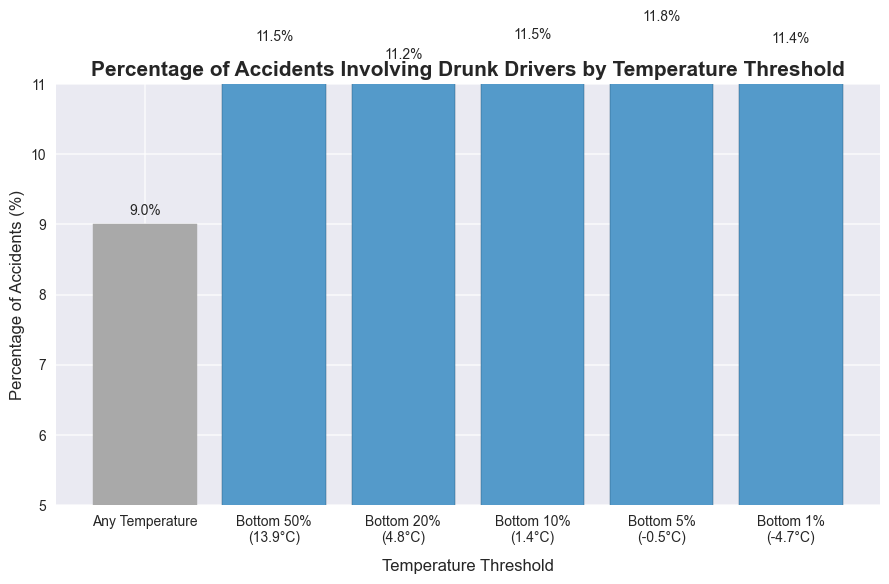

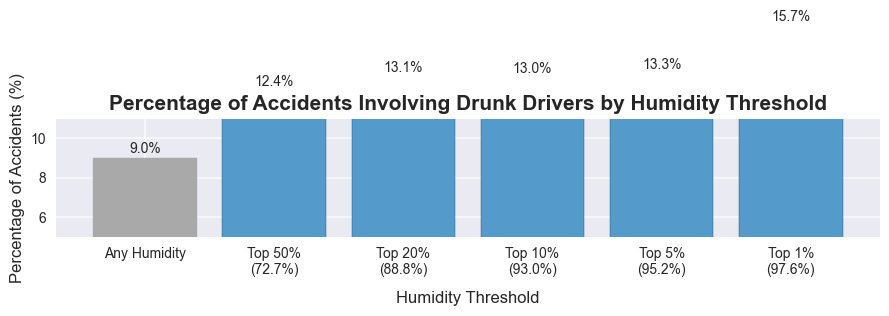

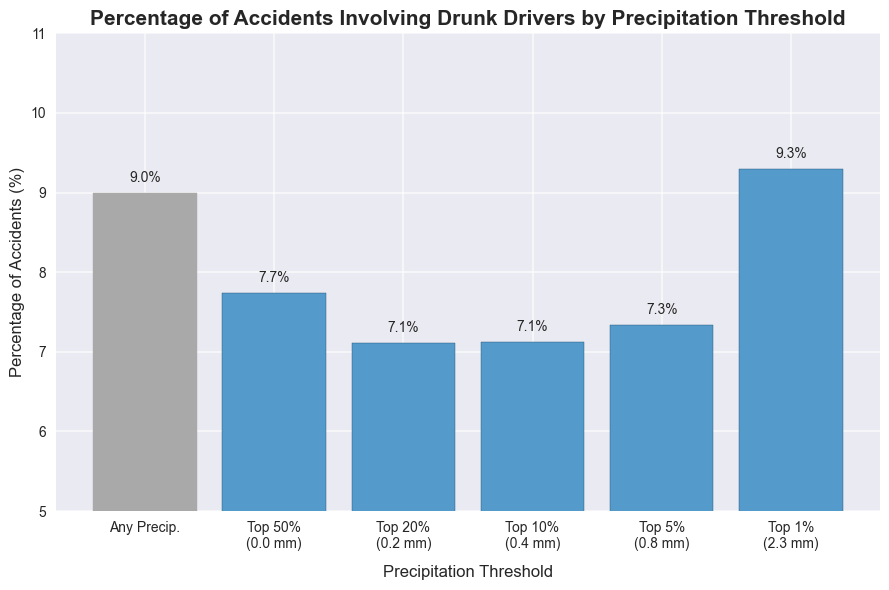

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


df_incidents['precipitation'] = df_incidents['precipation']

# Set style
plt.style.use('seaborn-v0_8')

# Define colors consistent with other plots
bar_color = '#549ACA'
edge_color = '#1B4F72'
edge_baseline_color = 'darkgray'
baseline_color = '#E67E22'  # Complementary orange for 'Any' category
baseline_color = 'darkgray'  # Complementary orange for 'Any' category
baseline_line_color = '#E74C3C'  # Color for baseline line

# Common figure parameters (less wide)
fig_width = 9  # Reduced from 14
fig_height = 6

# FIGURE 1: TEMPERATURE (LOWEST PERCENTILES)
# Filter out NaN values
df_temp = df_incidents.dropna(subset=['driver_under_influence', 'temperature'])

# Calculate temperature percentiles (lowest)
temp_percentiles = [
    0,
    np.percentile(df_temp['temperature'], 50),  # 50th percentile
    np.percentile(df_temp['temperature'], 20),  # 20th percentile
    np.percentile(df_temp['temperature'], 10),  # 10th percentile
    np.percentile(df_temp['temperature'], 5),   # 5th percentile
    np.percentile(df_temp['temperature'], 1),   # 1st percentile
]

# Map these to labels
temp_labels = ["Any Temperature"] + ["Bottom 1%", "Bottom 5%", "Bottom 10%", "Bottom 20%", "Bottom 50%"][::-1]
temp_values = [""] + [f"{temp:.1f}°C" for temp in temp_percentiles[1:]]
temp_combined_labels = [f"{label}\n{f'({value})' if value else ''}" for label, value in zip(temp_labels, temp_values)]

# Hard-coded percentage for "Any Temperature" (baseline)
temp_drunk_percentages = [9.0]  # Hard-coded baseline value
# Calculate percentage of drunk driving incidents for each temperature threshold
for percentile in temp_percentiles[1:]:
    cold_accidents = df_temp[df_temp['temperature'] <= percentile]
    drunk_count = cold_accidents['driver_under_influence'].sum()
    percentage = (drunk_count / len(cold_accidents)) * 100 if len(cold_accidents) > 0 else 0
    temp_drunk_percentages.append(percentage)

# Create first figure
fig1, ax1 = plt.subplots(figsize=(fig_width, fig_height))

# Set bar colors (first bar is baseline orange, others are blue)
bar_colors = [baseline_color] + [bar_color] * (len(temp_drunk_percentages) - 1)
edge_colors = [edge_baseline_color] + [edge_color] * (len(temp_drunk_percentages) - 1)

bars1 = ax1.bar(temp_combined_labels, temp_drunk_percentages, color=bar_colors, edgecolor=edge_colors)
ax1.set_title('Percentage of Accidents Involving Drunk Drivers by Temperature Threshold', 
          fontsize=15, fontweight='bold')
ax1.set_xlabel('Temperature Threshold', fontsize=12, labelpad=10)
ax1.set_ylabel('Percentage of Accidents (%)', fontsize=12)
ax1.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
ax1.set_ylim(5, 11)  # Set y-axis limits to end at 11

# Add baseline horizontal line
# ax1.axhline(y=9.0, color=baseline_line_color, linestyle='--', linewidth=2, alpha=0.7)
# ax1.text(len(temp_drunk_percentages)*0.75, 9.1, 'Baseline (9.0%)', color=baseline_line_color, fontweight='bold')

# Add value labels
for bar in bars1:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
             f'{height:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# FIGURE 2: HUMIDITY (HIGHEST PERCENTILES)
# Filter out NaN values
df_humidity = df_incidents.dropna(subset=['driver_under_influence', 'humidity'])

# Calculate humidity percentiles (highest)
humidity_percentiles = [
    0,
    np.percentile(df_humidity['humidity'], 50),  # 50th percentile
    np.percentile(df_humidity['humidity'], 80),  # 80th percentile
    np.percentile(df_humidity['humidity'], 90),  # 90th percentile
    np.percentile(df_humidity['humidity'], 95),  # 95th percentile
    np.percentile(df_humidity['humidity'], 99)   # 99th percentile
]

# Map these to labels
humidity_labels = ["Any Humidity", "Top 50%", "Top 20%", "Top 10%", "Top 5%", "Top 1%"]
humidity_values = [""] + [f"{hum:.1f}%" for hum in humidity_percentiles[1:]]
humidity_combined_labels = [f"{label}\n{f'({value})' if value else ''}" for label, value in zip(humidity_labels, humidity_values)]

# Hard-coded percentage for "Any Humidity" (baseline)
humidity_drunk_percentages = [9.0]  # Hard-coded baseline value
# Calculate percentage of drunk driving incidents for each humidity threshold
for percentile in humidity_percentiles[1:]:
    humid_accidents = df_humidity[df_humidity['humidity'] >= percentile]
    drunk_count = humid_accidents['driver_under_influence'].sum()
    percentage = (drunk_count / len(humid_accidents)) * 100 if len(humid_accidents) > 0 else 0
    humidity_drunk_percentages.append(percentage)

# Create second figure
fig2, ax2 = plt.subplots(figsize=(fig_width, fig_height))

# Set bar colors (first bar is baseline orange, others are blue)
bar_colors = [baseline_color] + [bar_color] * (len(humidity_drunk_percentages) - 1)
edge_colors = [edge_baseline_color] + [edge_color] * (len(temp_drunk_percentages) - 1)

bars2 = ax2.bar(humidity_combined_labels, humidity_drunk_percentages, color=bar_colors, edgecolor=edge_colors)
ax2.set_title('Percentage of Accidents Involving Drunk Drivers by Humidity Threshold', 
          fontsize=15, fontweight='bold')
ax2.set_xlabel('Humidity Threshold', fontsize=12, labelpad=10)
ax2.set_ylabel('Percentage of Accidents (%)', fontsize=12)
ax2.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
ax2.set_ylim(5, 11)  # Set y-axis limits to end at 11

# Add baseline horizontal line
# ax2.axhline(y=9.0, color=baseline_line_color, linestyle='--', linewidth=2, alpha=0.7)
# ax2.text(len(humidity_drunk_percentages)*0.75, 9.1, 'Baseline (9.0%)', color=baseline_line_color, fontweight='bold')

# Add value labels
for bar in bars2:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.1,
             f'{height:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# FIGURE 3: PRECIPITATION (HIGHEST PERCENTILES)
# Filter out NaN values
df_precip = df_incidents.dropna(subset=['driver_under_influence', 'precipitation'])

# For precipitation, we need to handle the case where many values might be 0
non_zero_precip = df_precip[df_precip['precipitation'] > 0]['precipitation']

if len(non_zero_precip) > 0:
    precip_percentiles = [
        0,  # Any precipitation
        np.percentile(non_zero_precip, 50),  # 50th percentile of non-zero values
        np.percentile(non_zero_precip, 80),  # 80th percentile
        np.percentile(non_zero_precip, 90),  # 90th percentile
        np.percentile(non_zero_precip, 95),  # 95th percentile
        np.percentile(non_zero_precip, 99)   # 99th percentile
    ]
    
    precip_labels = ["Any Precip.", "Top 50%", "Top 20%", "Top 10%", "Top 5%", "Top 1%"]
else:
    precip_percentiles = [0, 0.1, 0.5, 1, 5, 10]  # Example thresholds
    precip_labels = ["0 mm", "0.1+ mm", "0.5+ mm", "1+ mm", "5+ mm", "10+ mm"]

precip_values = [""] + [f"{prec:.1f} mm" for prec in precip_percentiles[1:]]
precip_combined_labels = [f"{label}\n{f'({value})' if value else ''}" for label, value in zip(precip_labels, precip_values)]

# Hard-coded percentage for "Any Precip." (baseline)
precip_drunk_percentages = [9.0]  # Hard-coded baseline value
# Calculate percentage of drunk driving incidents for each precipitation threshold
for percentile in precip_percentiles[1:]:
    rainy_accidents = df_precip[df_precip['precipitation'] >= percentile]
    drunk_count = rainy_accidents['driver_under_influence'].sum()
    percentage = (drunk_count / len(rainy_accidents)) * 100 if len(rainy_accidents) > 0 else 0
    precip_drunk_percentages.append(percentage)

# Create third figure
fig3, ax3 = plt.subplots(figsize=(fig_width, fig_height))

# Set bar colors (first bar is baseline orange, others are blue)
bar_colors = [baseline_color] + [bar_color] * (len(precip_drunk_percentages) - 1)
edge_colors = [edge_baseline_color] + [edge_color] * (len(temp_drunk_percentages) - 1)

bars3 = ax3.bar(precip_combined_labels, precip_drunk_percentages, color=bar_colors, edgecolor=edge_colors)
ax3.set_title('Percentage of Accidents Involving Drunk Drivers by Precipitation Threshold', 
          fontsize=15, fontweight='bold')
ax3.set_xlabel('Precipitation Threshold', fontsize=12, labelpad=10)
ax3.set_ylabel('Percentage of Accidents (%)', fontsize=12)
ax3.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
ax3.set_ylim(5, 11)  # Set y-axis limits to end at 11

# Add baseline horizontal line
# ax3.axhline(y=9.0, color=baseline_line_color, linestyle='--', linewidth=2, alpha=0.7)
# ax3.text(len(precip_drunk_percentages)*0.75, 9.1, 'Baseline (9.0%)', color=baseline_line_color, fontweight='bold')

# Add value labels
for bar in bars3:
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height + 0.1,
             f'{height:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()

## Individual

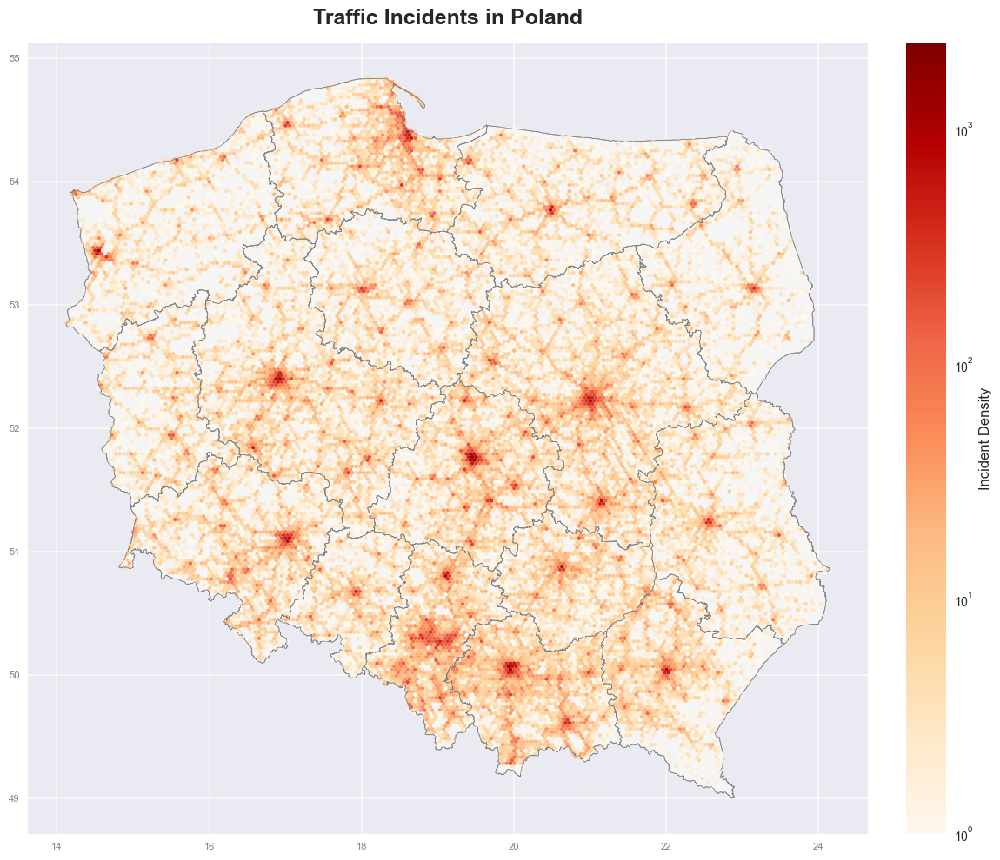

In [15]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import numpy as np
from matplotlib.colors import LinearSegmentedColormap, LogNorm, Normalize
import matplotlib.patheffects as pe

geometry = [Point(xy) for xy in zip(df_incidents.longitude, df_incidents.latitude)]
geo_df = gpd.GeoDataFrame(df_incidents, geometry=geometry)
geo_df.crs = "EPSG:4326"

poland = gpd.read_file('data/locations/PRG_jednostki_administracyjne_2017/województwa.shp', encoding='windows-1250')
poland = poland.to_crs("EPSG:4326")

# Set style consistent with other charts
plt.style.use('seaborn-v0_8')



# Create figure and axis first with a light gray background
fig, ax = plt.subplots(figsize=(15, 10), facecolor='white')

ax.set_facecolor('#eaeaf2')

# Add grid lines before plotting data
ax.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
ax.set_axisbelow(True)  # Put grid behind other elements

# Plot Poland boundaries
poland.boundary.plot(ax=ax, edgecolor='gray', linewidth=0.5)
poland.plot(ax=ax, color='whitesmoke', edgecolor='gray', linewidth=0.5)

# Better colormap with more differentiation in mid-ranges
# custom_cmap = LinearSegmentedColormap.from_list(
#     "heat_density", ['#FFFFFF00', '#FEF0D9', '#FDCC8A', '#FC8D59', '#E34A33', '#B30000'],
#     N=256,
#     gamma=0.75  # Gamma < 1 makes the progression faster in lower values
# )

# Filter out any outliers in the data - using less aggressive filtering
x_coords = geo_df.geometry.x.values
y_coords = geo_df.geometry.y.values

# Calculate IQR for coordinates to detect outliers
x_q1, x_q3 = np.percentile(x_coords, [25, 75])
y_q1, y_q3 = np.percentile(y_coords, [25, 75])
x_iqr = x_q3 - x_q1
y_iqr = y_q3 - y_q1

# Less aggressive filtering (1.5 IQR)
iqr_param = 1.5  # IQR parameter for filtering outliers
x_mask = (x_coords >= x_q1 - iqr_param * x_iqr) & (x_coords <= x_q3 + iqr_param * x_iqr)
y_mask = (y_coords >= y_q1 - iqr_param * y_iqr) & (y_coords <= y_q3 + iqr_param * y_iqr)
valid_mask = x_mask & y_mask

# Plot hexbin with filtered data and logarithmic normalization for better distribution
hb = ax.hexbin(
    x_coords[valid_mask], 
    y_coords[valid_mask], 
    gridsize=200,         # Reduced for larger bins
    cmap='OrRd',
    alpha=1.0,
    # linewidths=0.2,       # Small outline makes bins more visible
    linewidths=0.0,       # Small outline makes bins more visible
    mincnt=1,
    edgecolor='face',
    norm=LogNorm()        # Use logarithmic scaling for better mid-range visibility
)

# Title and styling
plt.title('Traffic Incidents in Poland', 
         pad=15, 
         fontsize=18,
         fontweight='bold')

# Add a colorbar with improved styling
cbar = fig.colorbar(hb, ax=ax, pad=0.03, shrink=1.0)
cbar.set_label('Incident Density', fontsize=12)

# Instead of turning off axis completely, customize it to show the grid
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Keep ticks visible for reference but make them more subtle
ax.tick_params(axis='both', colors='gray', labelsize=8)

plt.tight_layout()
plt.show()

## By county / voivodeship

In [16]:
# Extract year from datetime
df_incidents['year'] = df_incidents['datetime'].dt.year

# First aggregate by county/voivodeship to get total counts
county_total = df_incidents.groupby(['county', 'voivodeship']).size().reset_index(name='incident_count')
voivodeship_total = df_incidents.groupby('voivodeship').size().reset_index(name='incident_count')

county_yearly = df_incidents.groupby(['year', 'county', 'voivodeship']).size().reset_index(name='incident_count_yearly')
voivodeship_yearly = df_incidents.groupby(['year', 'voivodeship']).size().reset_index(name='incident_count_yearly')

In [17]:
# Add incident counts to df_counties
df_counties = df_counties.merge(
    county_yearly,
    left_on=['name', 'voivodeship', 'year'],
    right_on=['county', 'voivodeship', 'year'],
    how='left'
)


df_counties = df_counties.merge(
    county_total,
    left_on=['name', 'voivodeship'],
    right_on=['county', 'voivodeship'],
    how='left'
)

# Add incident counts to df_voivodeships
df_voivodeships = df_voivodeships.merge(
    voivodeship_yearly,
    left_on=['name', 'year'],
    right_on=['voivodeship', 'year'],
    how='left'
)

df_voivodeships = df_voivodeships.merge(
    voivodeship_total,
    left_on=['name'],
    right_on=['voivodeship'],
    how='left'
)

df_voivodeships.drop(columns=['voivodeship_x', 'voivodeship_y'], inplace=True)
df_counties.drop(columns=['county_x', 'county_y'], inplace=True)

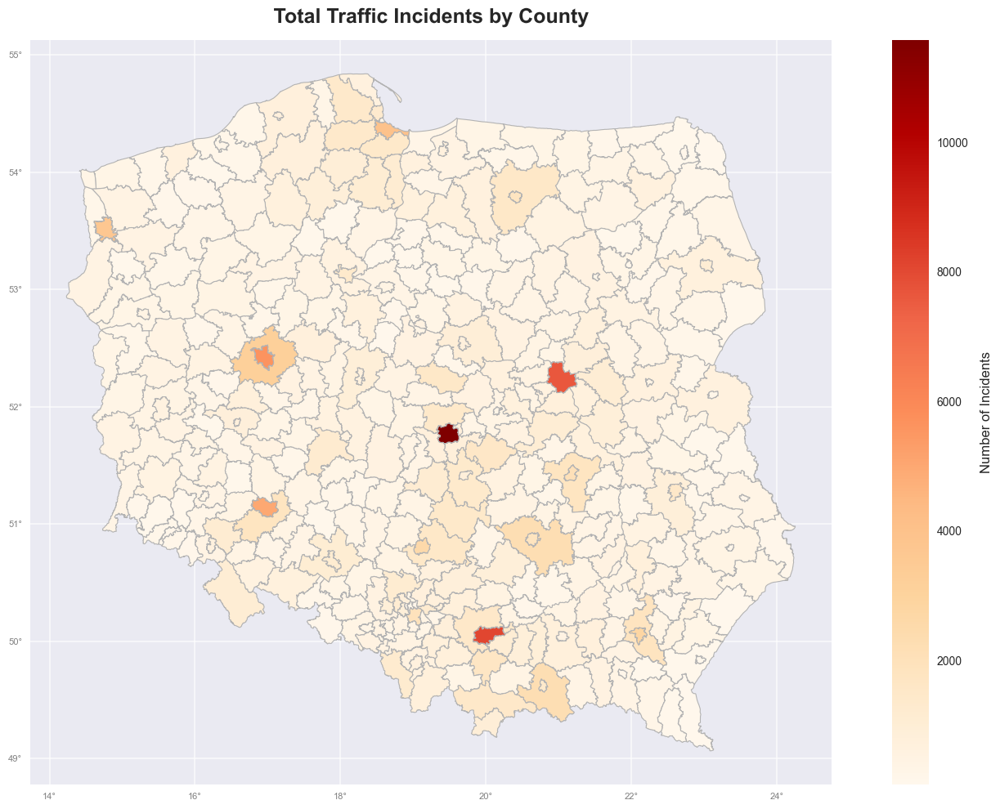

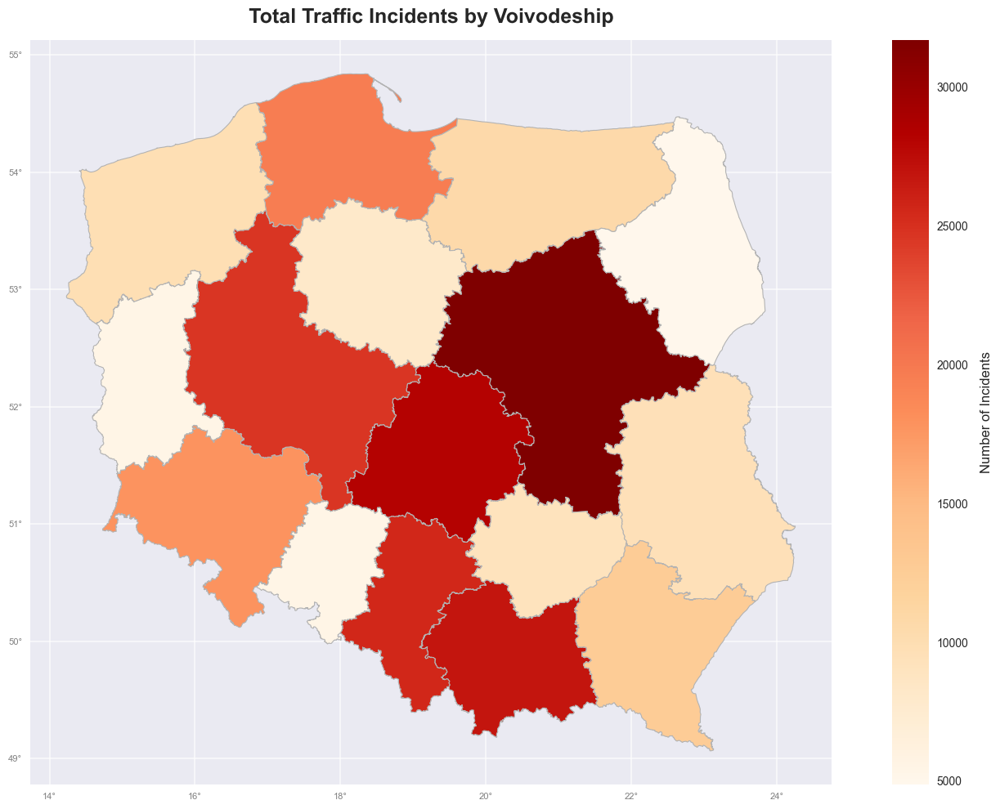

In [18]:
def plot_geodataframe(df, title='', colorbar_title='', figsize=(15, 10), 
                      **kwargs):
    """
    Create a styled map with coordinate grid lines from any GeoDataFrame.
    
    Parameters:
    -----------
    df : GeoDataFrame
        The GeoDataFrame to plot
    title : str, optional
        Map title
    colorbar_title : str, optional
        Title for the colorbar (overrides automatic generation from column name)
    figsize : tuple, optional
        Figure size (width, height)
    background_color : str, optional
        Background color for the map
    **kwargs : dict
        Additional arguments passed directly to GeoDataFrame.plot()
        (column, cmap, legend, etc.)
    
    Returns:
    --------
    fig : matplotlib figure
    ax : matplotlib axis
    """
    import matplotlib.pyplot as plt
    import matplotlib.patheffects as pe
    import numpy as np
    from pyproj import Transformer
    
    # Create figure and axis
    fig, ax = plt.subplots(1, 1, figsize=figsize, facecolor='white')
    
    # Set background color
    ax.set_facecolor('#eaeaf2')
    
    # Add grid lines
    ax.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
    ax.set_axisbelow(True)
    

    kwargs = dict(
        linewidth=0.8,
        edgecolor='0.7',
        legend=True,
    ) | kwargs
    # Plot the GeoDataFrame
    plot = df.plot(
        ax=ax,
        **kwargs  # Pass all kwargs directly to plot
    )
    
    # Add label to the colorbar if it exists
    if 'column' in kwargs:
        cbar = plt.gcf().axes[-1]  # Get the colorbar axes
        
        # Use provided colorbar title or format from column name
        cb_title = colorbar_title if colorbar_title else kwargs['column'].replace('_', ' ').title()
        cbar.set_ylabel(cb_title, fontsize=12, labelpad=10)
    
    # Title and styling
    if title:
        ax.set_title(title, 
                    pad=15, 
                    fontsize=18, 
                    fontweight='bold',
                    path_effects=[pe.withStroke(linewidth=2, foreground='white')])
    
    # Customize axis - keep ticks but make them subtle
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.tick_params(axis='both', colors='gray', labelsize=8)
    
    # Add coordinate grid lines
    # Get current map bounds
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Transform coordinates to lat/long if needed
    if df.crs.to_epsg() != 4326:  # If not in WGS84 lat/long
        # Create transformer from current CRS to WGS84
        transformer = Transformer.from_crs(df.crs, "EPSG:4326", always_xy=True)
        
        # Find the lat/lon bounds of the map
        corners = [(xmin, ymin), (xmin, ymax), (xmax, ymin), (xmax, ymax)]
        lons, lats = zip(*[transformer.transform(x, y) for x, y in corners])
        lon_min, lon_max = min(lons), max(lons)
        lat_min, lat_max = min(lats), max(lats)
        
        # Create evenly spaced coordinates in lat/lon space
        lon_ticks = np.array([i for i in range(int(np.floor(lon_min)), int(np.ceil(lon_max)) + 1) if i % 2 == 0])
        lat_ticks = np.array([i for i in range(int(np.floor(lat_min)), int(np.ceil(lat_max)) + 1)])
        
        # Transform these lat/lon positions back to the map's coordinate system
        reverse_transformer = Transformer.from_crs("EPSG:4326", df.crs, always_xy=True)
        
        # Get x positions for longitude lines
        x_pos = []
        x_labels = []
        for lon in lon_ticks:
            x, _ = reverse_transformer.transform(lon, (lat_min + lat_max) / 2)
            if xmin <= x <= xmax:  # Only use if in bounds
                x_pos.append(x)
                x_labels.append(f"{lon}°")
        
        # Get y positions for latitude lines
        y_pos = []
        y_labels = []
        for lat in lat_ticks:
            _, y = reverse_transformer.transform((lon_min + lon_max) / 2, lat)
            if ymin <= y <= ymax:  # Only use if in bounds
                y_pos.append(y)
                y_labels.append(f"{lat}°")
        
        # Set the tick positions and labels
        ax.set_xticks(x_pos)
        ax.set_yticks(y_pos)
        ax.set_xticklabels(x_labels)
        ax.set_yticklabels(y_labels)
    # else:
    #     # If already in lat/long format
    #     lon_ticks = np.array([i for i in range(int(np.floor(xmin)), int(np.ceil(xmax)) + 1) if i % 2 == 0])
    #     lat_ticks = np.array([i for i in range(int(np.floor(ymin)), int(np.ceil(ymax)) + 1)])
        
    #     # Filter to only ticks within plot bounds
    #     lon_ticks = lon_ticks[(lon_ticks >= xmin) & (lon_ticks <= xmax)]
    #     lat_ticks = lat_ticks[(lat_ticks >= ymin) & (lat_ticks <= ymax)]
        
    #     # Set tick positions and format labels
    #     ax.set_xticks(lon_ticks)
    #     ax.set_yticks(lat_ticks)
    #     ax.set_xticklabels([f"{int(x)}°" for x in lon_ticks])
    #     ax.set_yticklabels([f"{int(y)}°" for y in lat_ticks])
    
    plt.tight_layout()
    return fig, ax

    
fig, ax = plot_geodataframe(
    df_counties[df_counties.year == 2022], 
    title='Total Traffic Incidents by County',
    colorbar_title='Number of Incidents',
    column='incident_count',
    cmap='OrRd',
)
plt.show()



fig, ax = plot_geodataframe(
    df_voivodeships[df_voivodeships.year == 2022], 
    title='Total Traffic Incidents by Voivodeship',
    colorbar_title='Number of Incidents',
    column='incident_count',
    cmap='OrRd',
)
plt.show()

## Datetime etc.

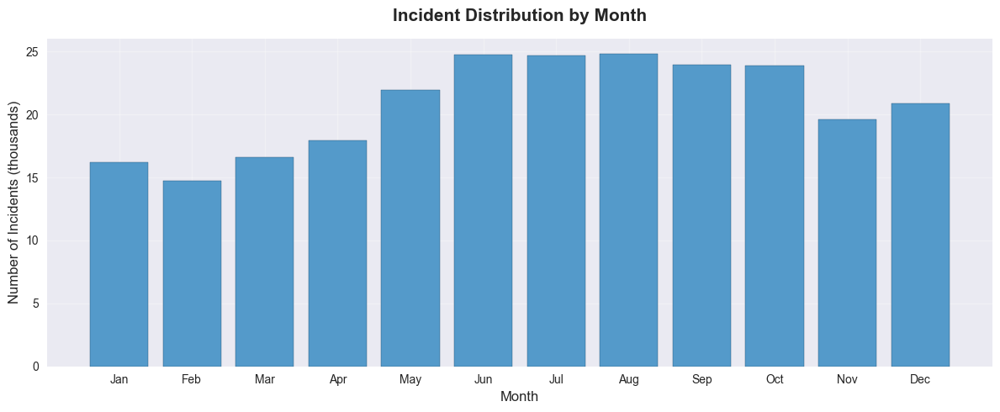

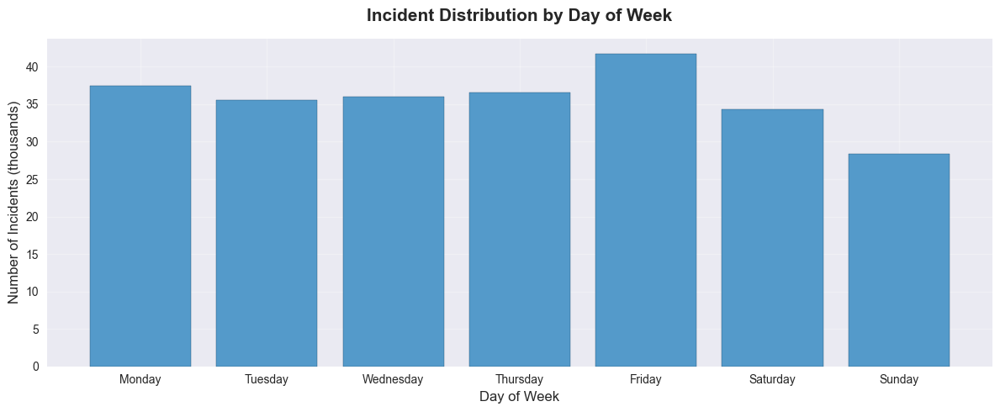

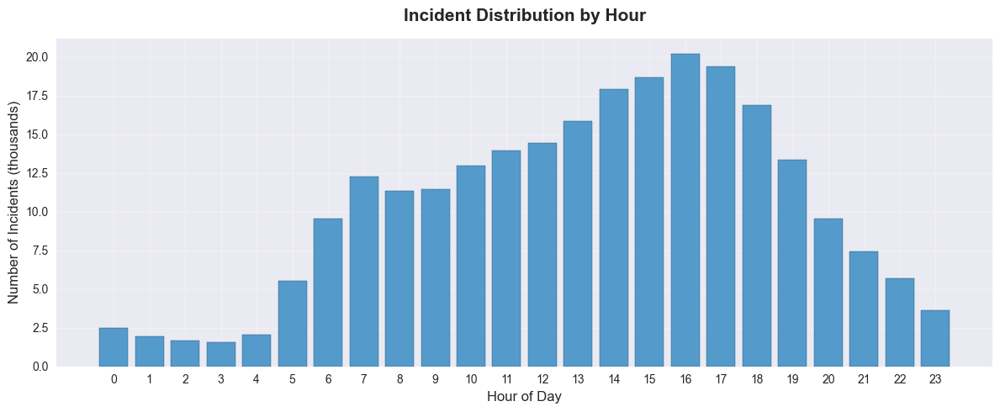

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from calendar import month_abbr

# Convert datetime column to datetime type if not already
df_incidents['datetime'] = pd.to_datetime(df_incidents['datetime'])

# Extract time components
df_incidents['month'] = df_incidents['datetime'].dt.month
df_incidents['day_of_week'] = df_incidents['datetime'].dt.dayofweek
df_incidents['hour'] = df_incidents['datetime'].dt.hour

# Set style
plt.style.use('seaborn-v0_8')

# Colors consistent with your other visualizations
bar_color = '#549ACA'
edge_color = '#1B4F72'

# 1. Monthly distribution
plt.figure(figsize=(12, 5))
monthly_counts = df_incidents['month'].value_counts().sort_index()
monthly_counts_thousands = monthly_counts / 1000  # Convert to thousands
month_names = [month_abbr[i] for i in range(1, 13)]
plt.bar(month_names, monthly_counts_thousands, color=bar_color, edgecolor=edge_color)
plt.title('Incident Distribution by Month', pad=15, fontsize=15, fontweight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Incidents (thousands)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Day of week distribution
plt.figure(figsize=(12, 5))
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_counts = df_incidents['day_of_week'].value_counts().sort_index()
daily_counts_thousands = daily_counts / 1000  # Convert to thousands
plt.bar(day_names, daily_counts_thousands, color=bar_color, edgecolor=edge_color)
plt.title('Incident Distribution by Day of Week', pad=15, fontsize=15, fontweight='bold')
plt.xlabel('Day of Week', fontsize=12)
plt.ylabel('Number of Incidents (thousands)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 3. Hourly distribution
plt.figure(figsize=(12, 5))
hourly_counts = df_incidents['hour'].value_counts().sort_index()
hourly_counts_thousands = hourly_counts / 1000  # Convert to thousands
plt.bar(range(24), hourly_counts_thousands, color=bar_color, edgecolor=edge_color)
plt.title('Incident Distribution by Hour', pad=15, fontsize=15, fontweight='bold')
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Number of Incidents (thousands)', fontsize=12)
plt.xticks(range(24))
# plt.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Socioeconomic data

## Stats per county

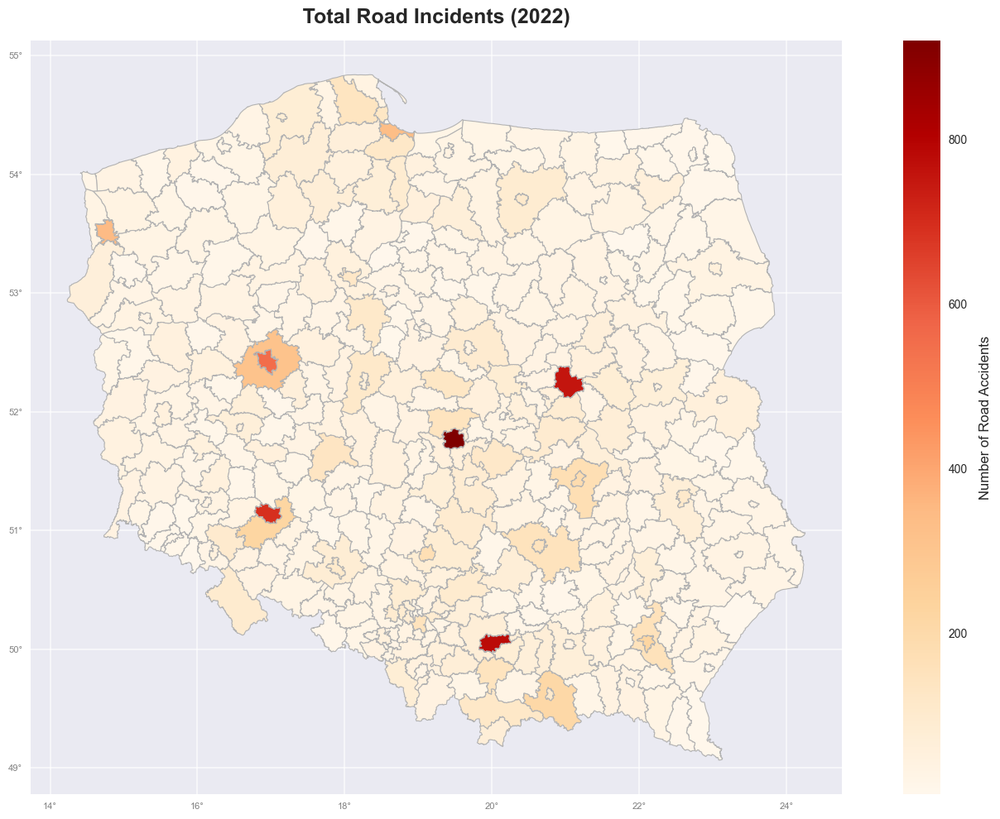

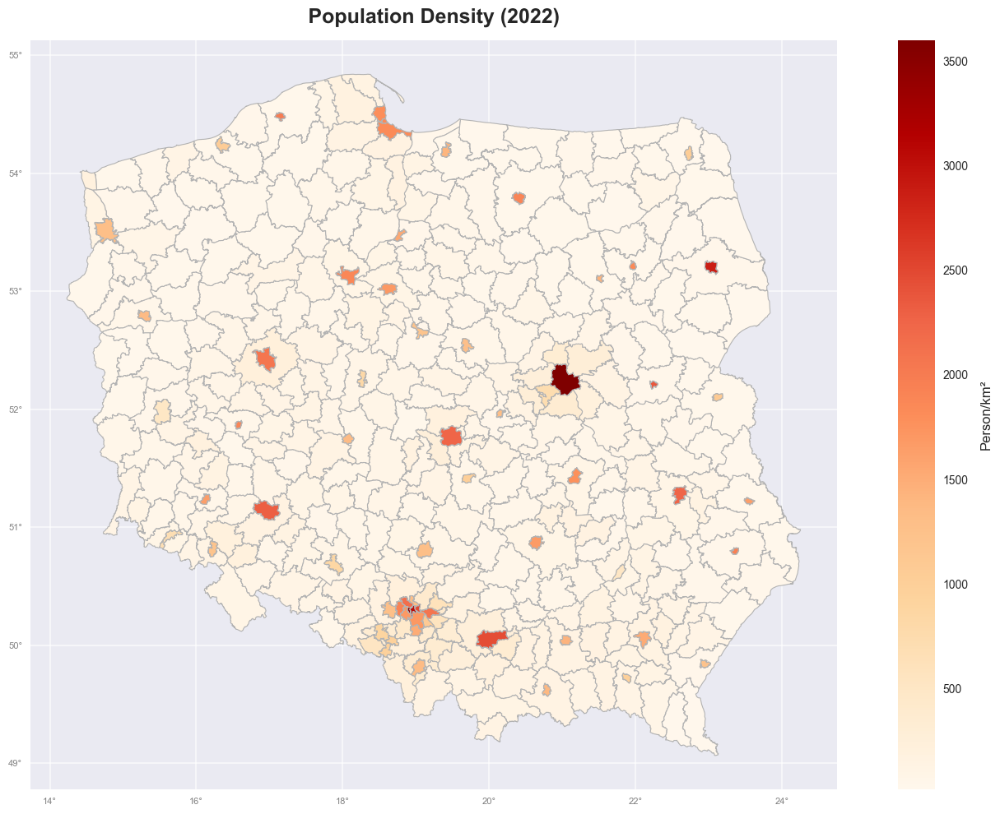

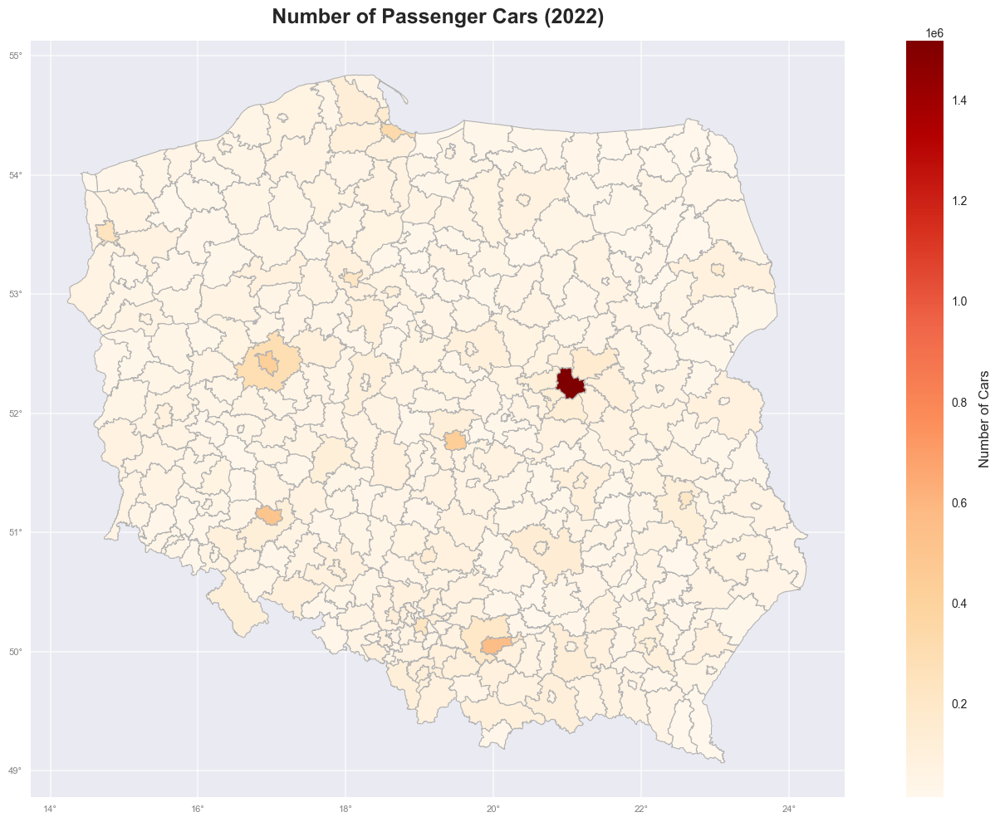

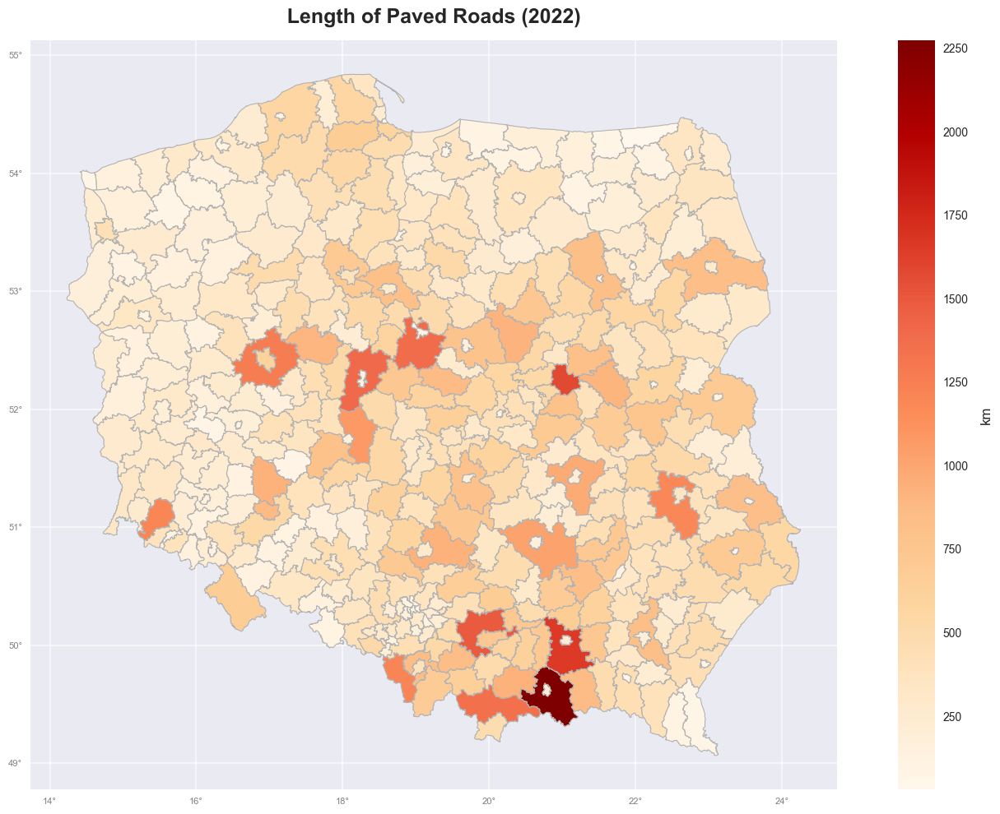

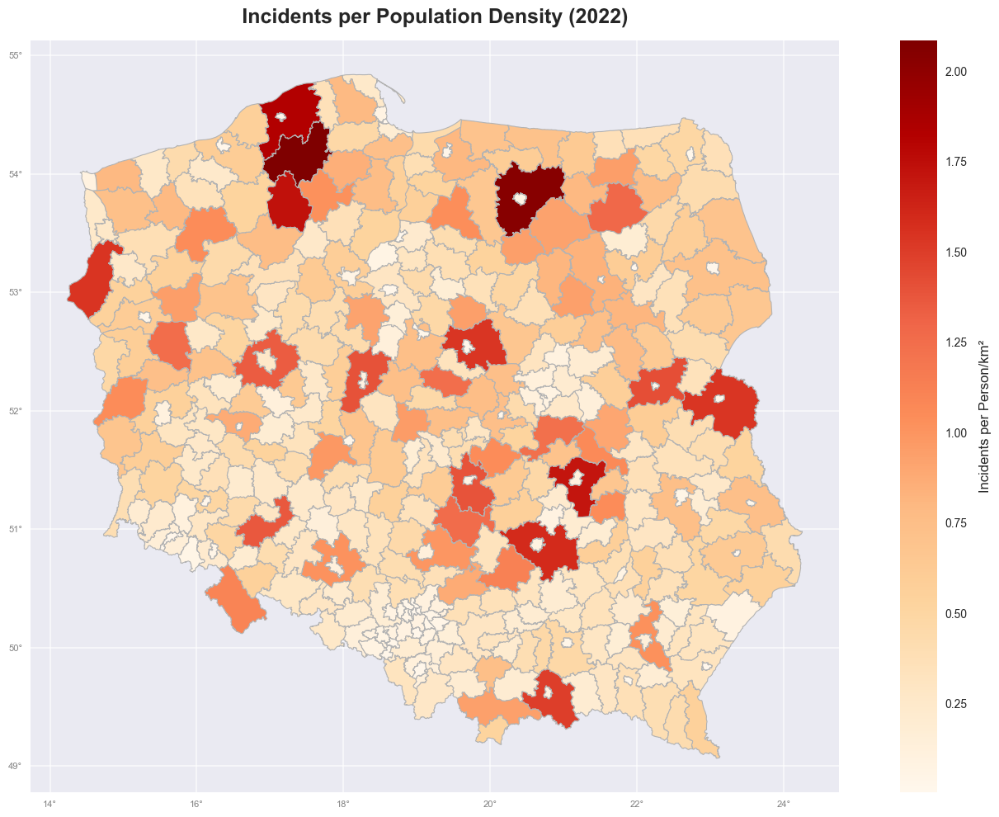

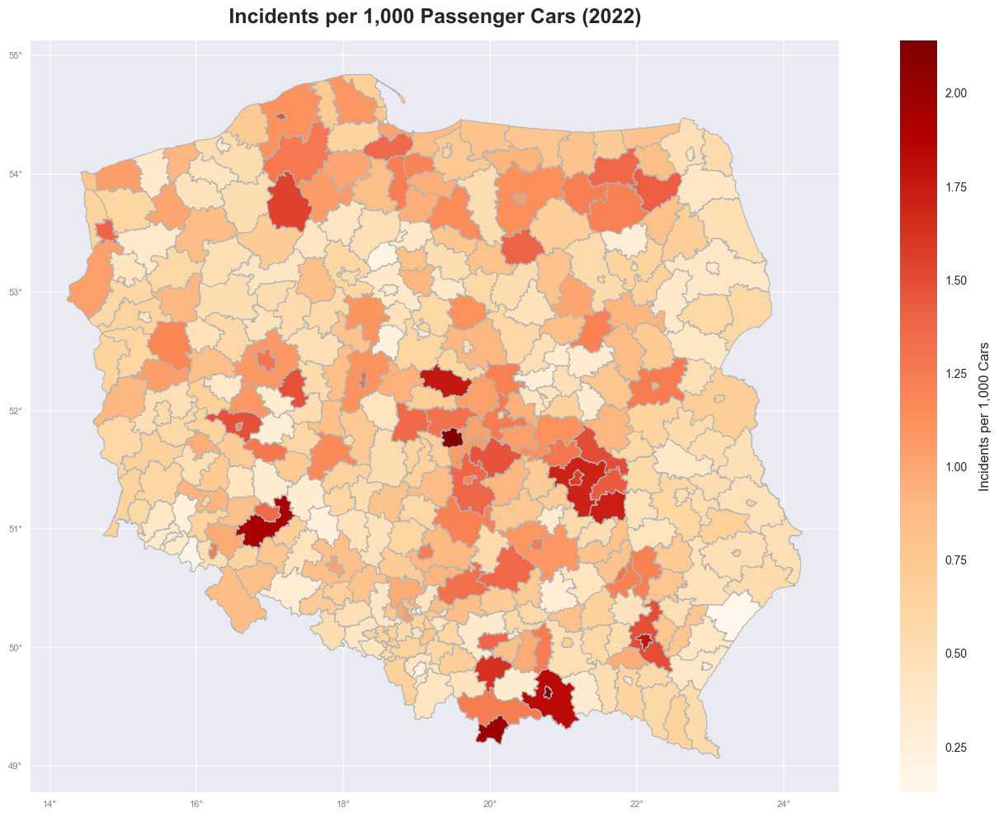

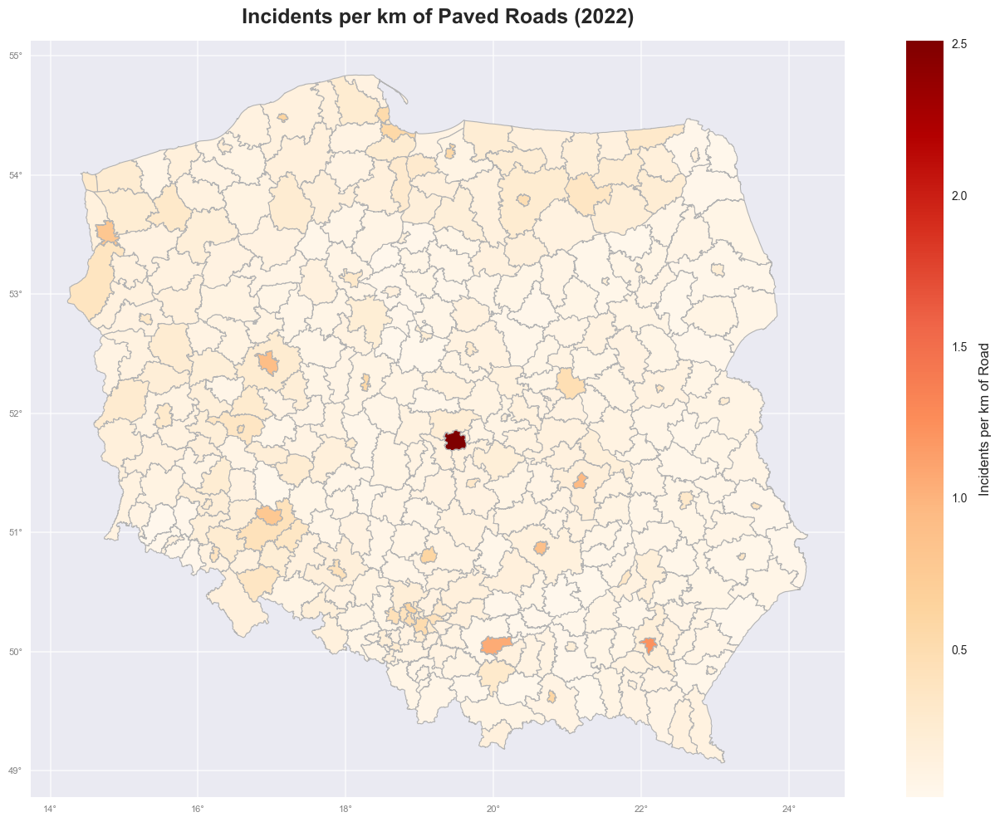

In [20]:
# Create a copy of the filtered dataframe
df_plot = df_counties[df_counties.year == 2022].copy()


plot_geodataframe(df_plot, 
                  column='Road accidents: total accidents (units)', 
                  title="Total Road Incidents (2022)", 
                  colorbar_title='Number of Road Accidents', 
                  cmap='OrRd')
plt.show()


# Plot raw statistics for the factors used in normalization

# 1. Population density
plot_geodataframe(df_plot, 
                  column='Indicators: population per 1 km2 (person)', 
                  title="Population Density (2022)", 
                  colorbar_title='Person/km²', 
                  cmap='OrRd')
plt.show()

# 2. Number of passenger cars
plot_geodataframe(df_plot, 
                  column='Vehicle types: passenger cars (units)', 
                  title="Number of Passenger Cars (2022)", 
                  colorbar_title='Number of Cars', 
                  cmap='OrRd')
plt.show()

# 3. Length of paved roads
plot_geodataframe(df_plot, 
                  column='Road types: paved surface (km)', 
                  title="Length of Paved Roads (2022)", 
                  colorbar_title='km', 
                  cmap='OrRd')
plt.show()


# Calculate normalized values by dividing incident count by each factor
# 1. Normalize by population density
df_plot['incidents_per_population_density'] = df_plot['incident_count_yearly'] / df_plot['Indicators: population per 1 km2 (person)']

# Pass the normalized column to plot
plot_geodataframe(df_plot, 
                  column='incidents_per_population_density', 
                  title="Incidents per Population Density (2022)", 
                  colorbar_title='Incidents per Person/km²', 
                  cmap='OrRd')
plt.show()

# 2. Normalize by vehicle count (multiply by 1000 for better scale)
df_plot['incidents_per_1000_cars'] = 1000 * df_plot['incident_count_yearly'] / df_plot['Vehicle types: passenger cars (units)']

plot_geodataframe(df_plot, 
                  column='incidents_per_1000_cars', 
                  title="Incidents per 1,000 Passenger Cars (2022)", 
                  colorbar_title='Incidents per 1,000 Cars', 
                  cmap='OrRd')
plt.show()

# 3. Normalize by road length
df_plot['incidents_per_km_road'] = df_plot['incident_count_yearly'] / df_plot['Road types: paved surface (km)']

plot_geodataframe(df_plot, 
                  column='incidents_per_km_road', 
                  title="Incidents per km of Paved Roads (2022)", 
                  colorbar_title='Incidents per km of Road', 
                  cmap='OrRd')
plt.show()






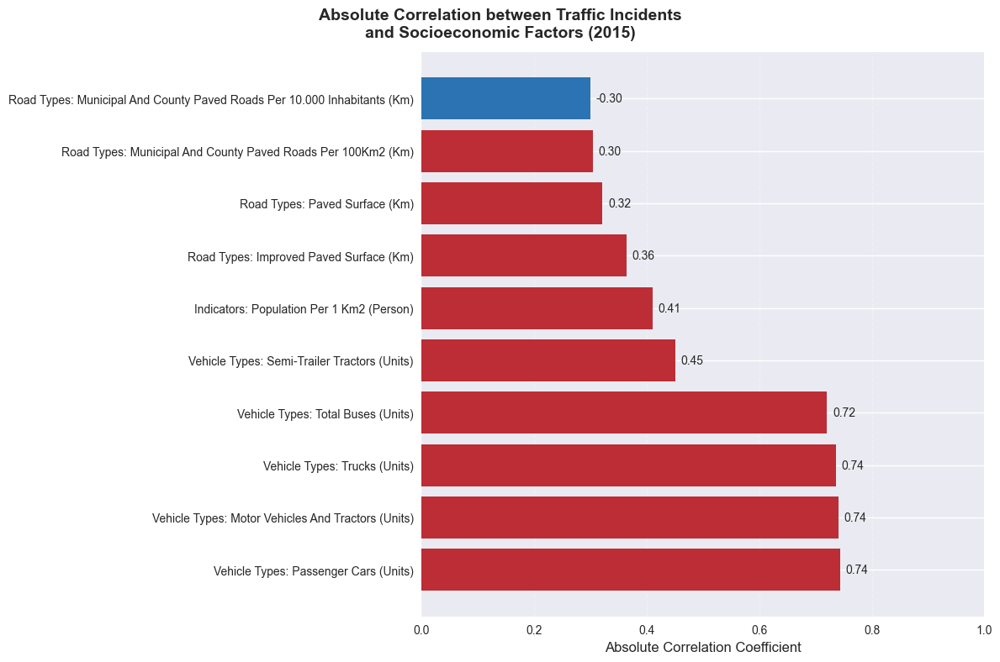

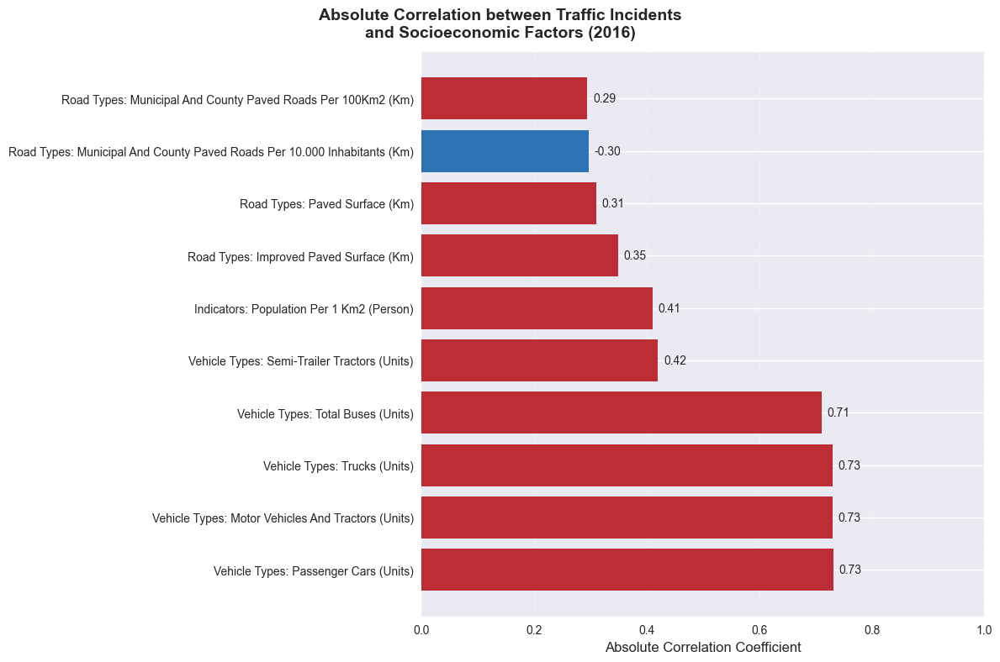

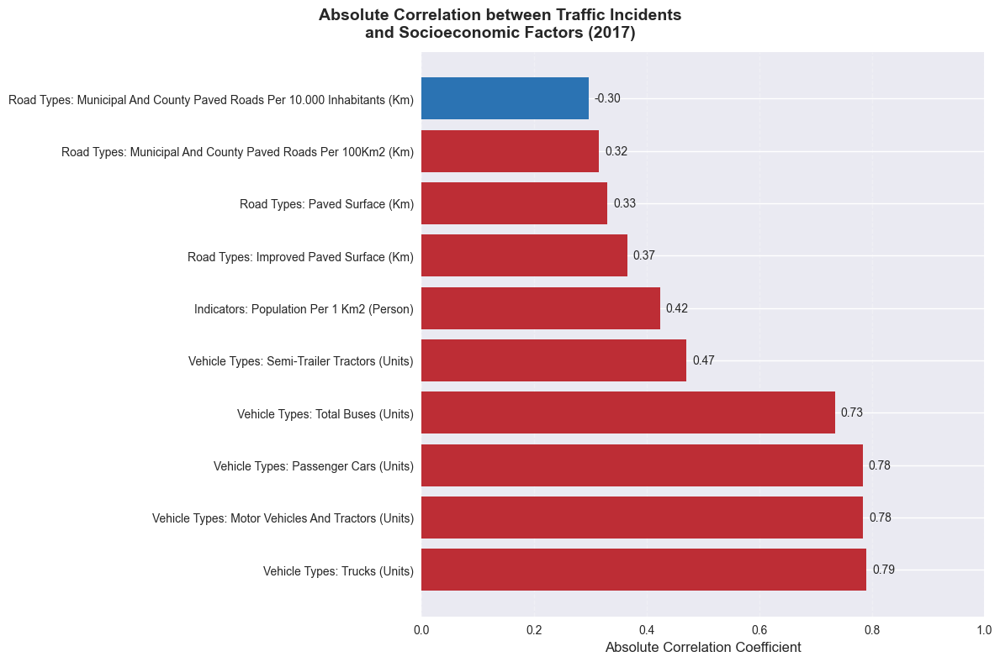

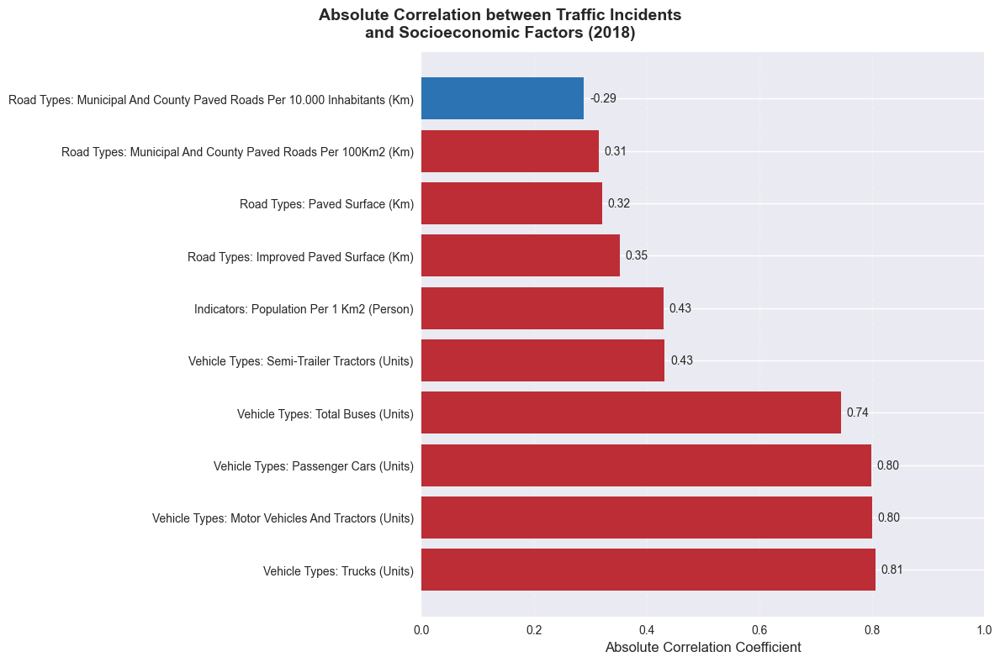

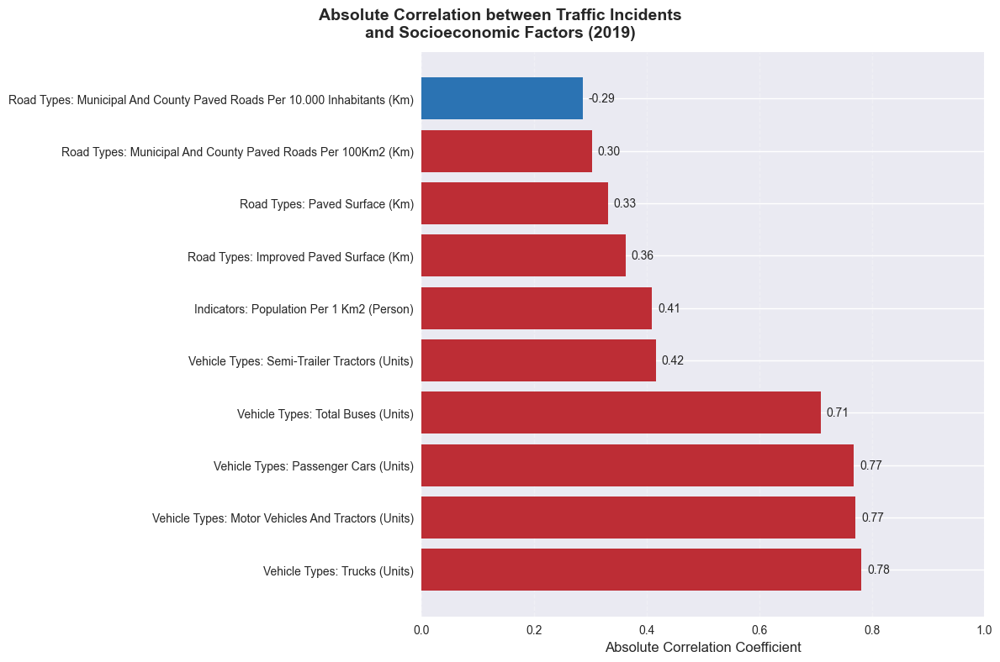

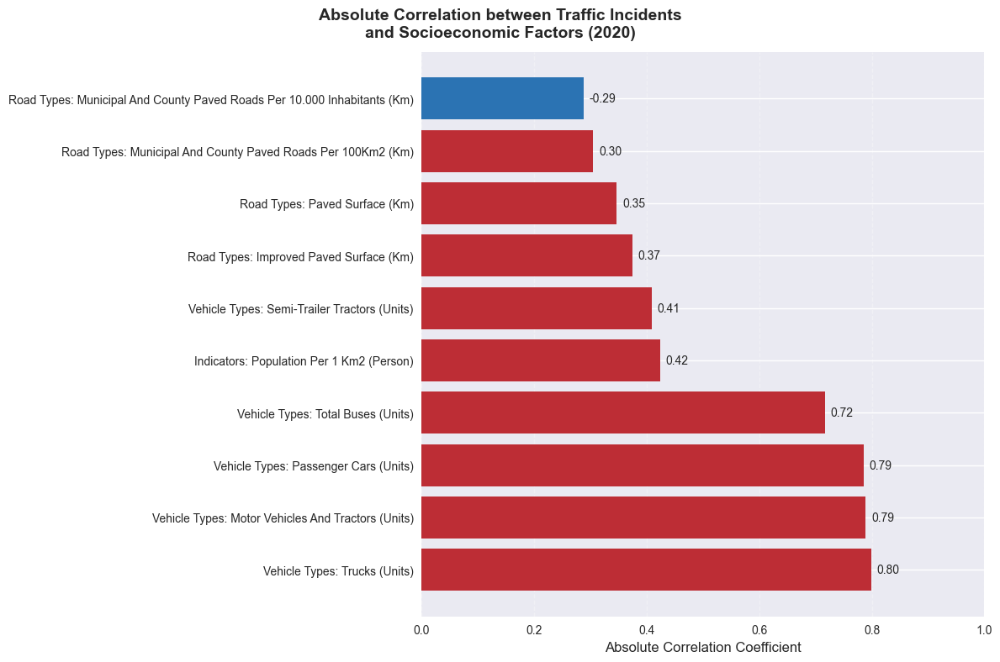

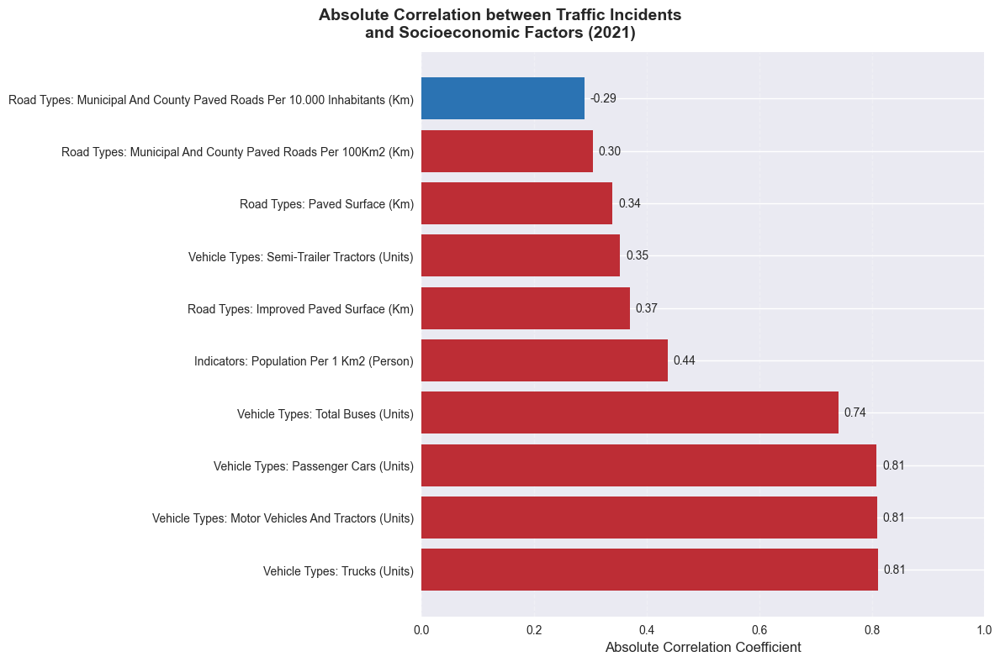

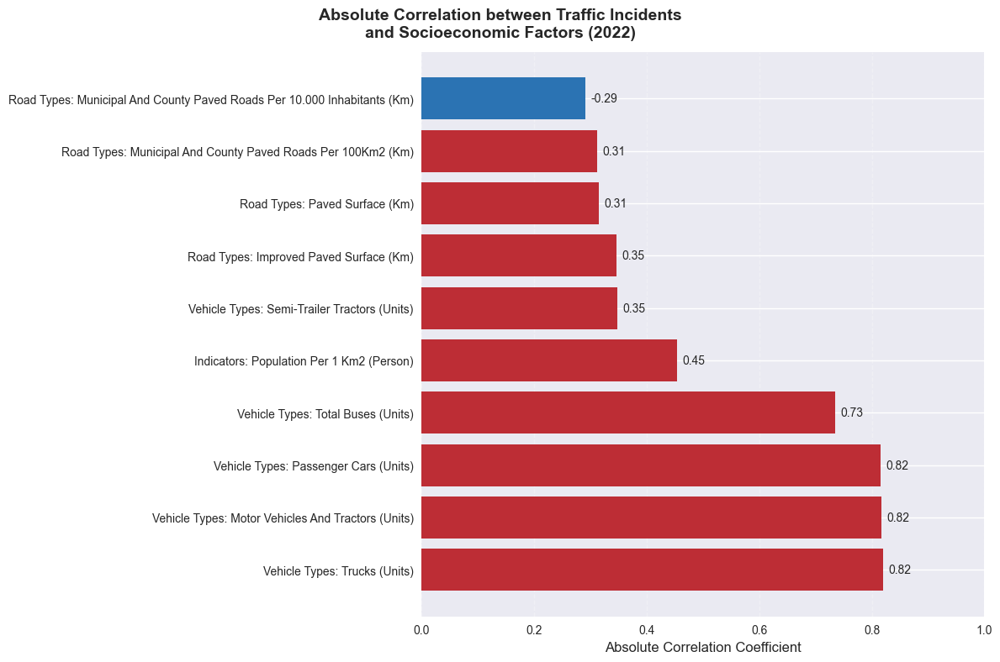

In [21]:
socioeconomic_cols = df_counties.columns[-16:-2].tolist()
socioeconomic_cols = [item for item in socioeconomic_cols if 'Road accidents' not in item]

for year in range(2015, 2023):
    # Calculate correlations between incident count and each socioeconomic factor
    correlations = []
    for factor in socioeconomic_cols:
        corr = df_counties[df_counties.year == year]['incident_count_yearly'].corr(df_counties[factor])
        correlations.append({
            'factor': factor,
            'correlation': corr,
            'abs_correlation': abs(corr)
        })

    # Convert to DataFrame and sort by absolute correlation
    corr_df = pd.DataFrame(correlations)
    corr_df = corr_df.sort_values(by='abs_correlation', ascending=False)

    # Create figure
    plt.figure(figsize=(12, 8))

    # Add title before creating the plot
    plt.suptitle(f'Absolute Correlation between Traffic Incidents\nand Socioeconomic Factors ({year})',
                fontsize=14, fontweight='bold', y=0.98)

    # Create horizontal bar plot using absolute values but keep original correlation colors
    bars = plt.barh(
        range(len(corr_df)),
        corr_df['abs_correlation'],
        color=[plt.cm.RdBu_r(0.13) if x < 0 else plt.cm.RdBu_r(0.87) for x in corr_df['correlation']]
    )

    # Customize the plot
    plt.yticks(
        range(len(corr_df)),
        [factor.replace('_', ' ').title() for factor in corr_df['factor']],
        fontsize=10
    )
    plt.xlabel('Absolute Correlation Coefficient', fontsize=12)

    # Add value labels with signs
    for i, bar in enumerate(bars):
        original_value = corr_df['correlation'].iloc[i]
        abs_value = corr_df['abs_correlation'].iloc[i]
        sign = ' ' if original_value >= 0 else '-'
        plt.text(abs_value + 0.01,
                i,
                f'{sign}{abs_value:.2f}'.lstrip(),
                va='center',
                ha='left')

    # Set x-axis limits with some padding
    plt.xlim(0, 1)

    # Add grid
    plt.grid(axis='x', linestyle='--', alpha=0.3)

    # Adjust margins to accommodate the title
    plt.subplots_adjust(top=0.85)

    # Adjust layout
    plt.tight_layout()
    plt.show()

## Top Counties

In [29]:
socioeconomic_cols = df_counties.columns[-16:-2].tolist()
socioeconomic_cols

['Indicators: population per 1 km2 (person)',
 'Road types: paved surface (km)',
 'Road types: improved paved surface (km)',
 'Vehicle types: motor vehicles and tractors (units)',
 'Vehicle types: passenger cars (units)',
 'Vehicle types: total buses (units)',
 'Vehicle types: trucks (units)',
 'Vehicle types: semi-trailer tractors (units)',
 'Road accidents: total accidents (units)',
 'Road accidents: total casualties (person)',
 'Road accidents: fatalities (person)',
 'Road accidents: injured (person)',
 'Road types: municipal and county paved roads per 100km2 (km)',
 'Road types: municipal and county paved roads per 10.000 inhabitants (km)']

In [38]:
def get_top_counties_by_factors(year=2022, top_n=5):
    """
    Creates a DataFrame showing the top counties for each socioeconomic factor.
    
    Parameters:
    -----------
    year : int
        Year to filter data for
    top_n : int
        Number of top counties to include
    
    Returns:
    --------
    DataFrame with socioeconomic factors as columns and rankings as rows
    """
    # Filter data for specified year
    counties_year = df_counties[df_counties['year'] == year].copy()
    
    # Create empty DataFrame for results
    result_df = pd.DataFrame(index=[f"{i+1}" for i in range(top_n)])
    
    # Fill DataFrame with top counties for each factor
    for col in socioeconomic_cols:
        # Sort by current socioeconomic factor
        top_counties = counties_year.sort_values(by=col, ascending=False)[['name', col]].head(top_n)
        
        # Create a series with index=rank and values=county names
        county_series = pd.Series(
            top_counties['name'].values,
            index=[f"{i+1}" for i in range(top_n)],
            name=col
        )
        
        # Add to result DataFrame
        result_df[col] = county_series
    
    return result_df

# Example usage with default parameters (year=2022, top_n=5)
top_counties_df = get_top_counties_by_factors(top_n=10)
print(top_counties_df)

# Example with custom parameters
# top_counties_df = get_top_counties_by_factors(year=2021, top_n=3)

   Indicators: population per 1 km2 (person) Road types: paved surface (km)  \
1                                   Warszawa                    nowosądecki   
2                             Świętochłowice                      tarnowski   
3                                    Chorzów                       Warszawa   
4                                  Białystok                      krakowski   
5                       Siemianowice Śląskie                       koniński   
6                                     Kraków                     włocławski   
7                                    Siedlce                     nowotarski   
8                                    Wrocław                      poznański   
9                                     Lublin                     cieszyński   
10                                      Łódź                       lwówecki   

   Road types: improved paved surface (km)  \
1                              nowosądecki   
2                                 Wars

# Weather

## Kriging

In [ ]:
from shapely.strtree import STRtree
import geopandas as gpd
from shapely import Point
import numpy as np

from shapely.prepared import prep

def create_mask_with_prepared_geometry(grid_lon, grid_lat, poland_union):
    # Create a prepared geometry for much faster operations
    prepared_poland = prep(poland_union)
    
    # Create points for all grid coordinates - but process in batches
    mask = np.zeros(grid_lon.shape, dtype=bool)
    
    # Process in batches to avoid memory issues
    batch_size = 1000
    for i in range(0, grid_lon.shape[0], batch_size):
        i_end = min(i + batch_size, grid_lon.shape[0])
        for j in range(0, grid_lon.shape[1], batch_size):
            j_end = min(j + batch_size, grid_lon.shape[1])
            
            # Create points for this batch
            points = [Point(grid_lon[x, y], grid_lat[x, y]) 
                     for x in range(i, i_end) 
                     for y in range(j, j_end)]
            
            # Test all points in this batch against prepared geometry
            results = [prepared_poland.contains(point) for point in points]
            
            # Assign results back to mask
            for idx, (x, y) in enumerate([(x, y) 
                                         for x in range(i, i_end) 
                                         for y in range(j, j_end)]):
                mask[x, y] = results[idx]
    
    return mask

In [ ]:
import matplotlib.colors as mcolors

def create_lighter_ylgn():
    # Get the standard YlGn colormap colors
    ylgn = plt.get_cmap('YlGn')
    
    # Use only the first 80% of the YlGn colormap (0.0 to 0.8 range)
    # This avoids the darkest greens at the high end
    colors = [
        ylgn(0.0),  # Start with lightest yellow
        ylgn(0.2),
        ylgn(0.4),
        ylgn(0.6),
        # ylgn(0.8)   # End with medium green, not dark green
    ]
    
    return mcolors.LinearSegmentedColormap.from_list('YlGn_modified', colors)


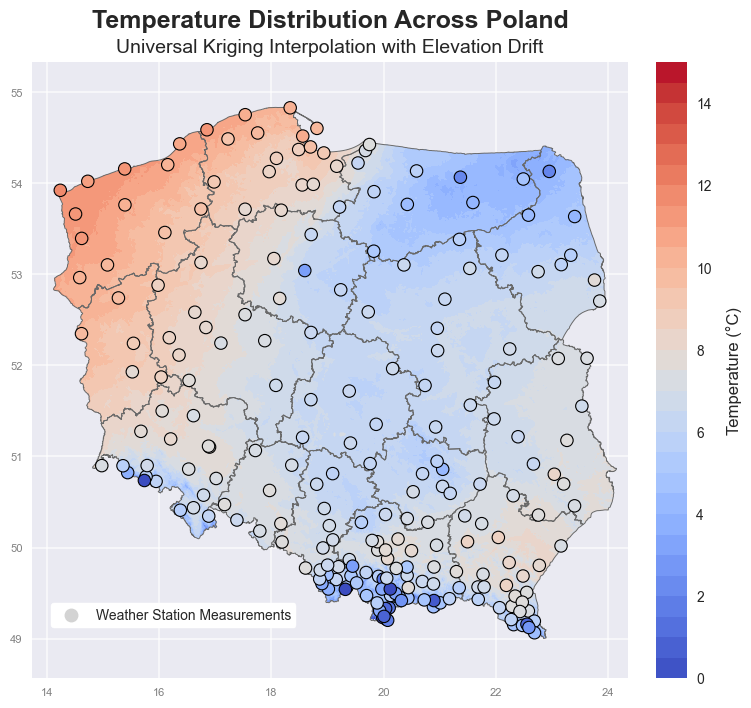

/var/folders/yp/gjwvp9611c96kbtrz5ssff_h0000gn/T/ipykernel_98304/1281109621.py:42: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_measurements = pd.read_csv(


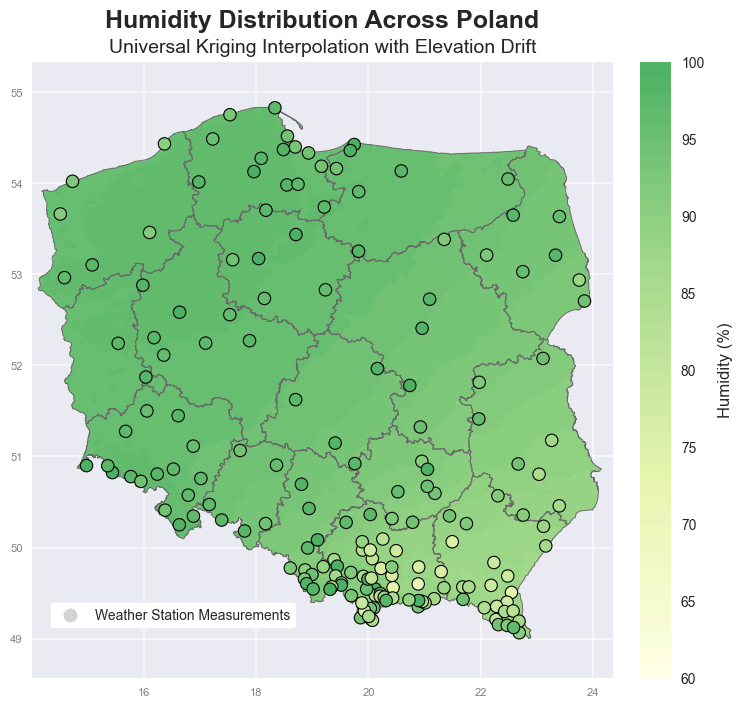

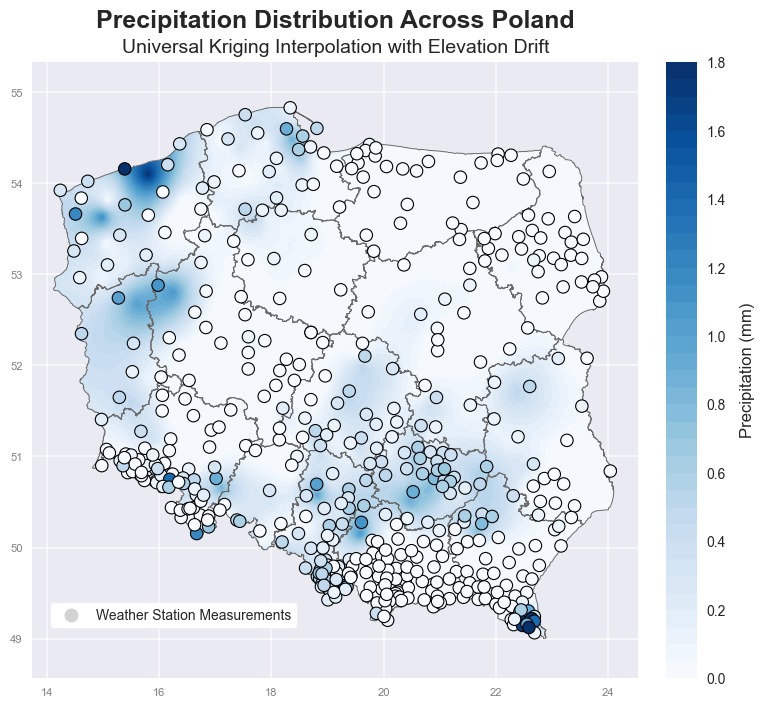

In [327]:
import matplotlib.pyplot as plt

def plot_kriging_multiple(
    params=['B00606S', 'B00802A', 'B00300S'],   # Temperature, Humidity, Precipitation
    year=2020,
    month=10,
    chosen_timestamp=None,
    vmin_dict={'B00606S': 0, 'B00802A': 0, 'B00300S': 0},
    vmax_dict={'B00606S': 25, 'B00802A': 100, 'B00300S': 20},
    steps_dict={'B00606S': 26, 'B00802A': 21, 'B00300S': 21},
    cmap_dict={'B00606S': 'coolwarm', 'B00802A': 'YlGnBu', 'B00300S': 'Blues'},
    param_dict={'B00606S': 'Temperature', 'B00802A': 'Humidity', 'B00300S': 'Precipitation'}
):
    import pandas as pd
    import numpy as np
    from pykrige.uk import UniversalKriging
    import matplotlib.pyplot as plt
    import pyproj
    import geopandas as gpd
    import rasterio
    import os
    import matplotlib.patheffects as pe
    from matplotlib.colors import ListedColormap
    import matplotlib.patches as mpatches
    from shapely.geometry import Point

    def get_elevation_for_point(lat, lon, elevation_data, transform):
        row, col = ~transform * (lon, lat)
        row, col = int(row), int(col)
        if 0 <= row < elevation_data.shape[0] and 0 <= col < elevation_data.shape[1]:
            return elevation_data[col, row]
        return np.nan

    df_stations = pd.read_csv('../data/intermediate/weather_stations.csv')

    for param in params:
        measurement_path = os.path.join(
            '..', 'data', 'input', 'weather', str(year), str(month).zfill(2),
            f'{param}_{year}_{str(month).zfill(2)}.csv'
        )
        columns = ['station_id', 'measurement', 'datetime', 'value']
        df_measurements = pd.read_csv(
            measurement_path, sep=';', encoding='windows-1250',
            names=columns, header=None, index_col=False
        )
        df_measurements['value'] = df_measurements['value'].str.replace(',', '.').astype(float)
        df_measurements['datetime'] = pd.to_datetime(df_measurements['datetime'])
        df_measurements['station_id'] = pd.to_numeric(
            df_measurements['station_id'], errors='coerce').astype('Int64')
        df_measurements.dropna(subset=['station_id'], inplace=True)

        df_measurements = df_measurements.merge(
            df_stations[['id', 'latitude', 'longitude', 'elevation']],
            left_on='station_id', right_on='id'
        )

        # Either use user-chosen timestamp or the first available
        if chosen_timestamp is not None:
            chosen_timestamp = pd.to_datetime(chosen_timestamp)
            weather_snapshot = df_measurements[df_measurements['datetime']
                                               == chosen_timestamp].copy()
            if weather_snapshot.empty:
                print(f"No data found for param '{param}' at timestamp {chosen_timestamp}")
                continue
        else:
            first_ts = df_measurements['datetime'].iloc[0]
            weather_snapshot = df_measurements[df_measurements['datetime'] == first_ts].copy()

        weather_snapshot = weather_snapshot.dropna(
            subset=['value', 'latitude', 'longitude', 'elevation'])

        # utm_proj = pyproj.Proj(proj='utm', zone=34, ellps='WGS84')
        # x, y = utm_proj(weather_snapshot['longitude'].values, weather_snapshot['latitude'].values)
        utm_proj = pyproj.Proj("EPSG:2180")
        x, y = utm_proj(weather_snapshot['longitude'].values, weather_snapshot['latitude'].values)

        grid_lon = np.linspace(weather_snapshot['longitude'].min() - 0.5,
                               weather_snapshot['longitude'].max() + 0.5, 500)
        grid_lat = np.linspace(weather_snapshot['latitude'].min() - 0.5,
                               weather_snapshot['latitude'].max() + 0.5, 500)
        grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
        grid_x, grid_y = utm_proj(grid_lon, grid_lat)

        with rasterio.open('../data/input/geographic/poland_dem.tif') as dem:
            elevation_data = dem.read(1)
            elevation_transform = dem.transform

        grid_elevation = np.zeros_like(grid_lon)
        for i in range(grid_lon.shape[0]):
            for j in range(grid_lon.shape[1]):
                grid_elevation[i, j] = get_elevation_for_point(
                    grid_lat[i, j],
                    grid_lon[i, j],
                    elevation_data,
                    elevation_transform
                )

        UK = UniversalKriging(
            x, y,
            weather_snapshot['value'].values,
            variogram_model='linear' if param != 'B00606S' else 'spherical',
            drift_terms=['specified'],
            specified_drift=[weather_snapshot['elevation'].values.reshape(-1, 1)]
        )

        z, ss = UK.execute(
            'grid',
            grid_x[0, :],
            grid_y[:, 0],
            specified_drift_arrays=[grid_elevation]
        )

        # Create figure and axis with improved styling
        fig, ax = plt.subplots(figsize=(12, 8), facecolor='white')
        plt.style.use('seaborn-v0_8')

        # Set background color to match plot_geodataframe
        ax.set_facecolor('#eaeaf2')

        # Add grid lines with improved styling
        ax.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
        ax.set_axisbelow(True)  # Grid behind other elements

        # Load Poland boundary data
        poland = gpd.read_file('data/locations/PRG_jednostki_administracyjne_2017/województwa.shp', encoding='windows-1250')
        poland = poland.to_crs("EPSG:4326")

        # Instead of using Path for masking, we'll create a clip mask using GeoPandas
        # First, create a unified Poland polygon (dissolve all voivodeships)
        poland_union = poland.union_all()

        # Create a mask array for the grid points
        mask = np.zeros(grid_lon.shape, dtype=bool)

        # More efficient approach using vectorization where possible
        # But still need some iteration to handle point-in-polygon checks
        # mask = create_mask_with_spatial_index(grid_lon, grid_lat, poland_union)
        mask = create_mask_with_prepared_geometry(grid_lon, grid_lat, poland_union)
        # for i in range(grid_lon.shape[0]):
        #     for j in range(grid_lon.shape[1]):
        #         point = Point(grid_lon[i, j], grid_lat[i, j])
        #         mask[i, j] = poland_union.contains(point) or poland_union.intersects(point)

        # Apply the mask to the kriging results
        z_masked = np.ma.array(z, mask=~mask)

        vmin = vmin_dict.get(param, 0)
        vmax = vmax_dict.get(param, 25)
        steps = steps_dict.get(param, 26)
        cmap = cmap_dict.get(param, 'coolwarm')
        levels = np.linspace(vmin, vmax, steps)

        if param == 'B00802A':
            z_masked = np.ma.clip(z_masked, 0, 100)
        elif param == 'B00606S':
            z_masked = np.ma.clip(z_masked, 0, np.inf)

        # First plot Poland with a background color
        poland.plot(ax=ax, color='#eaeaf2', edgecolor='none')

        # Plot contours with mask applied - using pcolormesh for better control
        contour = ax.contourf(
            grid_lon, grid_lat, z_masked, cmap=cmap,
            levels=levels, vmin=vmin, vmax=vmax,
            alpha=1.0, extend='neither'
        )

        # Plot boundary on top with improved styling
        poland.boundary.plot(
            ax=ax,
            color='dimgray',
            linewidth=0.7,
            alpha=1.0,
            zorder=5
        )

        # Plot stations with improved styling
        scatter = ax.scatter(
            weather_snapshot['longitude'], weather_snapshot['latitude'],
            c=weather_snapshot['value'], cmap=cmap, vmin=vmin, vmax=vmax,
            s=80, edgecolor='black', linewidth=0.8, zorder=10
        )

        # Format timestamp
        chosen_ts_str = (chosen_timestamp if chosen_timestamp is not None
                         else df_measurements['datetime'].iloc[0])
        formatted_ts = pd.to_datetime(chosen_ts_str).strftime('%Y-%m-%d %H:%M')

        # Title with improved styling and date information
        # ax.set_title(
        #     f"{param_dict[param]} Distribution Across Poland",
        #     pad=15,
        #     fontsize=18,
        #     fontweight='bold'
        # )

        ax.set_title(
            f"{param_dict[param]} Distribution Across Poland",
            pad=25,
            fontsize=18,
            fontweight='bold'
        )

        # Add subtitle with smaller font
        ax.text(
            0.5, 1.015, 
            "Universal Kriging Interpolation with Elevation Drift", 
            transform=ax.transAxes, 
            ha='center', 
            fontsize=14, 
            # alpha=0.8
        )
        # Hide spines to match plot_geodataframe style
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)

        # Style tick parameters
        ax.tick_params(axis='both', colors='gray', labelsize=8)

        # Create colorbar with improved styling
        cbar = fig.colorbar(contour, ax=ax, pad=0.03)
        cbar.set_label(
            f"{param_dict[param]} ({get_unit_for_param(param)})",
            fontsize=12,
            labelpad=10
        )

        # Replace the existing legend code with this:
        from matplotlib.lines import Line2D

        # Create a legend with a proper circular marker
        legend_elements = [Line2D([0], [0], marker='o', color='white',
                                  markerfacecolor='lightgray', markeredgecolor='black',
                                  markersize=10, alpha=1.0, label='Weather Station Measurements')]

        ax.legend(handles=legend_elements,
                  frameon=True,
                  framealpha=1.0,
                  edgecolor='white',
                  facecolor='white',
                  loc='lower left',
                  bbox_to_anchor=(0.02, 0.07),
                  )
        plt.show()


def get_unit_for_param(param):
    """Return the appropriate unit for each parameter"""
    units = {
        'B00300S': '°C',     # Temperature
        'B00802A': '%',      # Humidity
        'B00606S': 'mm'      # Precipitation
    }
    return units.get(param, '')


plot_kriging_multiple(
    params=['B00300S', 'B00802A', 'B00606S'],
    # params=['B00606S'], # Precipitation
    year=2020,
    month=10,
    # chosen_timestamp='2020-06-19 12:00',
    # chosen_timestamp='2020-11-29 17:00',
    # chosen_timestamp='2020-10-01 00:00', # this one is for humidity
    chosen_timestamp='2020-10-15 01:00', # this one is for precipitation & temp
    # chosen_timestamp='2020-10-17 14:00',
    # vmin_dict={'B00606S': 0, 'B00802A': 60, 'B00300S': 0},
    # vmax_dict={'B00606S': 1.7, 'B00802A': 100, 'B00300S': 23},
    # steps_dict={'B00606S': 35, 'B00802A': 21, 'B00300S': 24},
    vmin_dict={'B00606S': 0, 'B00802A': 60, 'B00300S': 0},
    vmax_dict={'B00606S': 1.8, 'B00802A': 100, 'B00300S': 15},
    steps_dict={'B00606S': 37, 'B00802A': 41, 'B00300S': 31},
    cmap_dict={'B00606S': 'Blues', 'B00802A': create_lighter_ylgn(), 'B00300S': 'coolwarm'},
    param_dict={'B00606S': 'Precipitation', 'B00802A': 'Humidity', 'B00300S': 'Temperature'}
)

## Ordinary Kriging

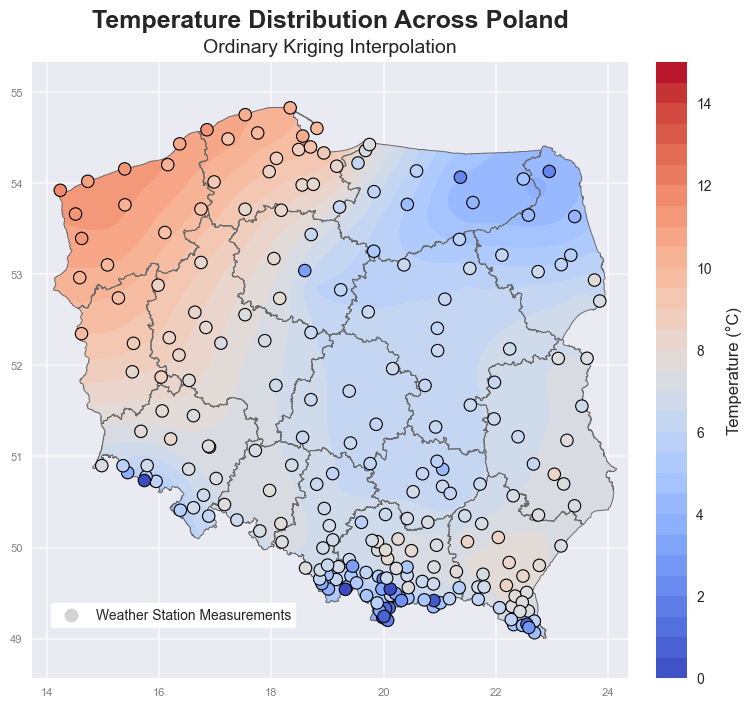

/var/folders/yp/gjwvp9611c96kbtrz5ssff_h0000gn/T/ipykernel_98304/2533475338.py:45: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_measurements = pd.read_csv(


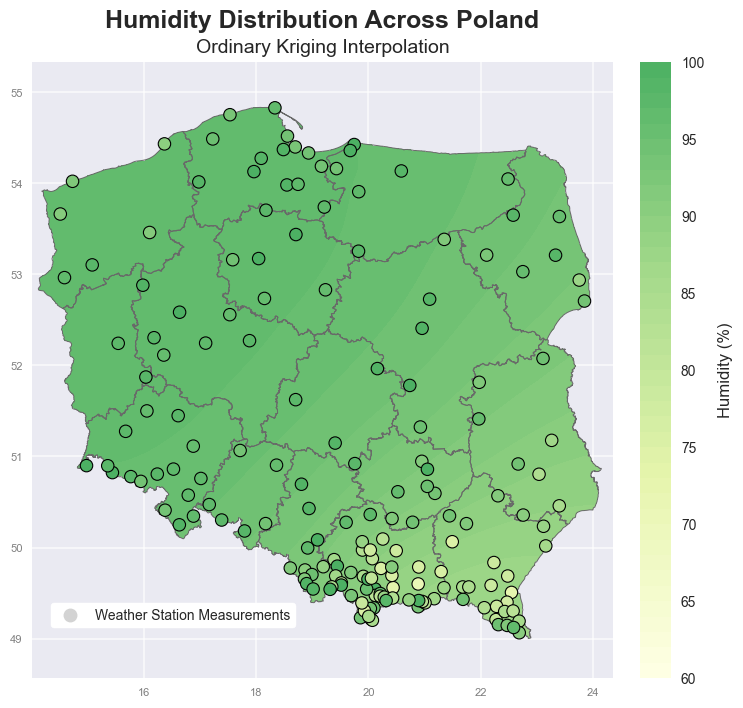

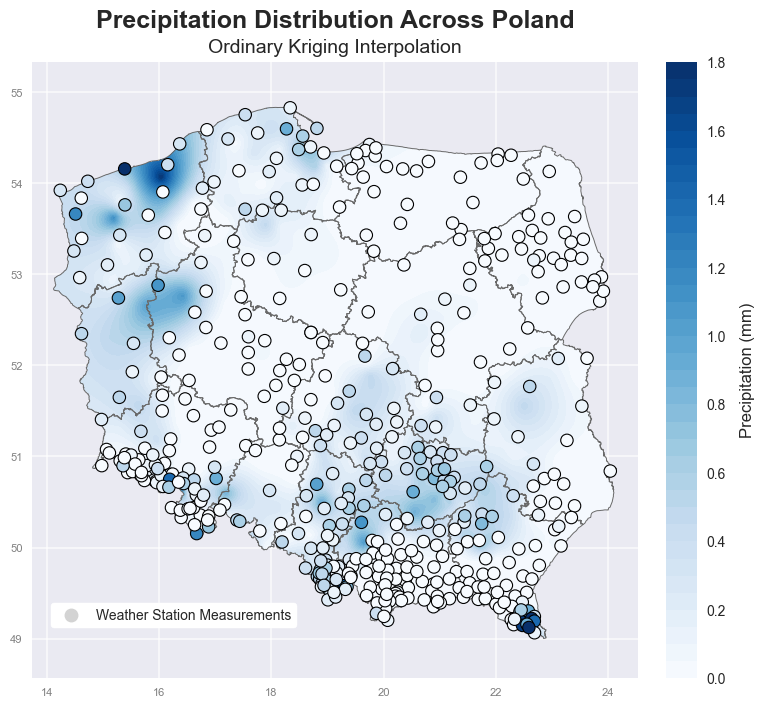

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_kriging_multiple(
    params=['B00606S', 'B00802A', 'B00300S'],   # Temperature, Humidity, Precipitation
    year=2020,
    month=10,
    chosen_timestamp=None,
    vmin_dict={'B00606S': 0, 'B00802A': 0, 'B00300S': 0},
    vmax_dict={'B00606S': 25, 'B00802A': 100, 'B00300S': 20},
    steps_dict={'B00606S': 26, 'B00802A': 21, 'B00300S': 21},
    cmap_dict={'B00606S': 'coolwarm', 'B00802A': 'YlGnBu', 'B00300S': 'Blues'},
    param_dict={'B00606S': 'Temperature', 'B00802A': 'Humidity', 'B00300S': 'Precipitation'}
):
    import pandas as pd
    import numpy as np
    from pykrige.ok import OrdinaryKriging  # Changed to OrdinaryKriging
    import matplotlib.pyplot as plt
    import pyproj
    import geopandas as gpd
    import rasterio
    import os
    import matplotlib.patheffects as pe
    from matplotlib.colors import ListedColormap
    import matplotlib.patches as mpatches
    from shapely.geometry import Point

    # We don't need the elevation function since we're not using it
    # But keeping it for backwards compatibility
    def get_elevation_for_point(lat, lon, elevation_data, transform):
        row, col = ~transform * (lon, lat)
        row, col = int(row), int(col)
        if 0 <= row < elevation_data.shape[0] and 0 <= col < elevation_data.shape[1]:
            return elevation_data[col, row]
        return np.nan

    df_stations = pd.read_csv('../data/intermediate/weather_stations.csv')

    for param in params:
        measurement_path = os.path.join(
            '..', 'data', 'input', 'weather', str(year), str(month).zfill(2),
            f'{param}_{year}_{str(month).zfill(2)}.csv'
        )
        columns = ['station_id', 'measurement', 'datetime', 'value']
        df_measurements = pd.read_csv(
            measurement_path, sep=';', encoding='windows-1250',
            names=columns, header=None, index_col=False
        )
        df_measurements['value'] = df_measurements['value'].str.replace(',', '.').astype(float)
        df_measurements['datetime'] = pd.to_datetime(df_measurements['datetime'])
        df_measurements['station_id'] = pd.to_numeric(
            df_measurements['station_id'], errors='coerce').astype('Int64')
        df_measurements.dropna(subset=['station_id'], inplace=True)

        df_measurements = df_measurements.merge(
            df_stations[['id', 'latitude', 'longitude', 'elevation']],
            left_on='station_id', right_on='id'
        )

        # Either use user-chosen timestamp or the first available
        if chosen_timestamp is not None:
            chosen_timestamp = pd.to_datetime(chosen_timestamp)
            weather_snapshot = df_measurements[df_measurements['datetime']
                                               == chosen_timestamp].copy()
            if weather_snapshot.empty:
                print(f"No data found for param '{param}' at timestamp {chosen_timestamp}")
                continue
        else:
            first_ts = df_measurements['datetime'].iloc[0]
            weather_snapshot = df_measurements[df_measurements['datetime'] == first_ts].copy()

        # We still drop rows with NaN values but we only need lat/lon and value
        # (elevation not needed for ordinary kriging)
        weather_snapshot = weather_snapshot.dropna(
            subset=['value', 'latitude', 'longitude'])

        utm_proj = pyproj.Proj(proj='utm', zone=34, ellps='WGS84')
        x, y = utm_proj(weather_snapshot['longitude'].values, weather_snapshot['latitude'].values)

        grid_lon = np.linspace(weather_snapshot['longitude'].min() - 0.5,
                               weather_snapshot['longitude'].max() + 0.5, 500)
        grid_lat = np.linspace(weather_snapshot['latitude'].min() - 0.5,
                               weather_snapshot['latitude'].max() + 0.5, 500)
        grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
        grid_x, grid_y = utm_proj(grid_lon, grid_lat)

        # Load elevation data for masking purposes only (not used in kriging)
        with rasterio.open('../data/input/geographic/poland_dem.tif') as dem:
            elevation_data = dem.read(1)
            elevation_transform = dem.transform

        # Replace Universal Kriging with Ordinary Kriging
        OK = OrdinaryKriging(
            x, y,
            weather_snapshot['value'].values,
            variogram_model='linear' if param != 'B00606S' else 'spherical',  # Use the same variogram model
        )

        # Execute Ordinary Kriging (no elevation data needed)
        z, ss = OK.execute(
            'grid',
            grid_x[0, :],
            grid_y[:, 0]
        )

        # Create figure and axis with improved styling
        fig, ax = plt.subplots(figsize=(12, 8), facecolor='white')
        plt.style.use('seaborn-v0_8')

        # Set background color to match plot_geodataframe
        ax.set_facecolor('#eaeaf2')

        # Add grid lines with improved styling
        ax.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
        ax.set_axisbelow(True)  # Grid behind other elements

        # Load Poland boundary data
        poland = gpd.read_file('data/locations/PRG_jednostki_administracyjne_2017/województwa.shp', encoding='windows-1250')
        poland = poland.to_crs("EPSG:4326")

        # Instead of using Path for masking, we'll create a clip mask using GeoPandas
        # First, create a unified Poland polygon (dissolve all voivodeships)
        poland_union = poland.union_all()

        # Create a mask array for the grid points
        # mask = np.ones(grid_lon.shape, dtype=bool)
        # mask = np.zeros(grid_lon.shape, dtype=bool)
        mask = create_mask_with_prepared_geometry(grid_lon, grid_lat, poland_union)

        # More efficient approach using vectorization where possible
        # But still need some iteration to handle point-in-polygon checks
        # for i in range(grid_lon.shape[0]):
        #     for j in range(grid_lon.shape[1]):
        #         point = Point(grid_lon[i, j], grid_lat[i, j])
        #         mask[i, j] = poland_union.contains(point) or poland_union.intersects(point)

        # Apply the mask to the kriging results
        z_masked = np.ma.array(z, mask=~mask)

        vmin = vmin_dict.get(param, 0)
        vmax = vmax_dict.get(param, 25)
        steps = steps_dict.get(param, 26)
        cmap = cmap_dict.get(param, 'coolwarm')
        levels = np.linspace(vmin, vmax, steps)

        if param == 'B00802A':
            z_masked = np.ma.clip(z_masked, 0, 100)
        elif param == 'B00606S':
            z_masked = np.ma.clip(z_masked, 0, np.inf)

        # First plot Poland with a background color
        poland.plot(ax=ax, color='#eaeaf2', edgecolor='none')

        # Plot contours with mask applied - using pcolormesh for better control
        contour = ax.contourf(
            grid_lon, grid_lat, z_masked, cmap=cmap,
            levels=levels, vmin=vmin, vmax=vmax,
            alpha=1.0, extend='neither'
        )

        # Plot boundary on top with improved styling
        poland.boundary.plot(
            ax=ax,
            color='dimgray',
            linewidth=0.7,
            alpha=1.0,
            zorder=5
        )

        # Plot stations with improved styling
        scatter = ax.scatter(
            weather_snapshot['longitude'], weather_snapshot['latitude'],
            c=weather_snapshot['value'], cmap=cmap, vmin=vmin, vmax=vmax,
            s=80, edgecolor='black', linewidth=0.8, zorder=10
        )

        # Format timestamp
        chosen_ts_str = (chosen_timestamp if chosen_timestamp is not None
                         else df_measurements['datetime'].iloc[0])
        formatted_ts = pd.to_datetime(chosen_ts_str).strftime('%Y-%m-%d %H:%M')

        # Title with improved styling and date information
        # ax.set_title(
        #     f"{param_dict[param]} Distribution Across Poland",
        #     pad=15,
        #     fontsize=18,
        #     fontweight='bold'
        # )

        # Modify the title styling in the plot_kriging_multiple function
        ax.set_title(
            f"{param_dict[param]} Distribution Across Poland",
            pad=25,
            fontsize=18,
            fontweight='bold'
        )

        # Add subtitle with smaller font
        ax.text(
            0.5, 1.015, 
            "Ordinary Kriging Interpolation", 
            transform=ax.transAxes, 
            ha='center', 
            fontsize=14, 
            # alpha=0.8
        )

        # Hide spines to match plot_geodataframe style
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)

        # Style tick parameters
        ax.tick_params(axis='both', colors='gray', labelsize=8)

        # Create colorbar with improved styling
        cbar = fig.colorbar(contour, ax=ax, pad=0.03)
        cbar.set_label(
            f"{param_dict[param]} ({get_unit_for_param(param)})",
            fontsize=12,
            labelpad=10
        )

        # Replace the existing legend code with this:
        from matplotlib.lines import Line2D

        # Create a legend with a proper circular marker
        legend_elements = [Line2D([0], [0], marker='o', color='white',
                                  markerfacecolor='lightgray', markeredgecolor='black',
                                  markersize=10, alpha=1.0, label='Weather Station Measurements')]

        ax.legend(handles=legend_elements,
                  frameon=True,
                  framealpha=1.0,
                  edgecolor='white',
                  facecolor='white',
                  loc='lower left',
                  bbox_to_anchor=(0.02, 0.07),
                  )
        plt.show()


def create_lighter_ylgn():
    # Get the standard YlGn colormap colors
    ylgn = plt.get_cmap('YlGn')
    
    # Use only the first 80% of the YlGn colormap (0.0 to 0.8 range)
    # This avoids the darkest greens at the high end
    colors = [
        ylgn(0.0),  # Start with lightest yellow
        ylgn(0.2),
        ylgn(0.4),
        ylgn(0.6),
        # ylgn(0.8)   # End with medium green, not dark green
    ]
    
    return mcolors.LinearSegmentedColormap.from_list('YlGn_modified', colors)

def get_unit_for_param(param):
    """Return the appropriate unit for each parameter"""
    units = {
        'B00300S': '°C',     # Temperature
        'B00802A': '%',      # Humidity
        'B00606S': 'mm'      # Precipitation
    }
    return units.get(param, '')


plot_kriging_multiple(
    params=['B00300S', 'B00802A', 'B00606S'],
    # params=['B00802A'],
    # params=['B00606S'],
    year=2020,
    month=10,
    # chosen_timestamp='2020-06-19 12:00',
    # chosen_timestamp='2020-11-29 17:00',
    # chosen_timestamp='2020-10-01 00:00', # this one
    chosen_timestamp='2020-10-15 01:00',
    # chosen_timestamp='2020-10-17 14:00',
    vmin_dict={'B00606S': 0, 'B00802A': 60, 'B00300S': 0},
    vmax_dict={'B00606S': 1.8, 'B00802A': 100, 'B00300S': 15},
    steps_dict={'B00606S': 37, 'B00802A': 41, 'B00300S': 31},
    cmap_dict={'B00606S': 'Blues', 'B00802A': create_lighter_ylgn(), 'B00300S': 'coolwarm'},
    param_dict={'B00606S': 'Precipitation', 'B00802A': 'Humidity', 'B00300S': 'Temperature'}
)

## Kriging Comparison in mountain regions

In [ ]:
df_counties2 = pd.read_csv('../data/intermediate/counties.csv')
df_counties2.sort_values(by=['elevation'], ascending=False).head(10)

,voivodeship,county,seat,latitude,longitude,elevation
134,małopolskie,tatrzański,Zakopane,49.298047,19.983115,869.61676
124,małopolskie,limanowski,Limanowa,49.678712,20.285422,714.90393
288,śląskie,żywiecki,Żywiec,49.608019,19.193348,617.41020
128,małopolskie,nowotarski,Nowy Targ,49.480392,20.020195,596.45150
195,podkarpackie,bieszczadzki,Ustrzyki Dolne,49.317863,22.624097,592.46967
126,małopolskie,myślenicki,Myślenice,49.805943,19.974128,568.52750
24,dolnośląskie,wałbrzyski,Wałbrzych,50.744592,16.258824,550.20483
10,dolnośląskie,kamiennogórski,Kamienna Góra,50.754716,16.001131,547.56850
202,podkarpackie,leski,Lesko,49.315121,22.374848,532.71686
212,podkarpackie,sanocki,Sanok,49.459592,22.136455,525.57007


In [ ]:
df_counties['jpt_nazwa_'].str.replace('powiat ', '')

0        bolesławiecki
1        bolesławiecki
2        bolesławiecki
3        bolesławiecki
4        bolesławiecki
             ...      
11065      Świnoujście
11066      Świnoujście
11067      Świnoujście
11068      Świnoujście
11069      Świnoujście
Name: jpt_nazwa_, Length: 11070, dtype: object

In [ ]:
df_counties['county'] = df_counties['jpt_nazwa_'].str.replace('powiat ', '')
df_counties = df_counties.merge(df_counties2[['county', 'voivodeship', 'elevation']], on=['county', 'voivodeship'], how='left')

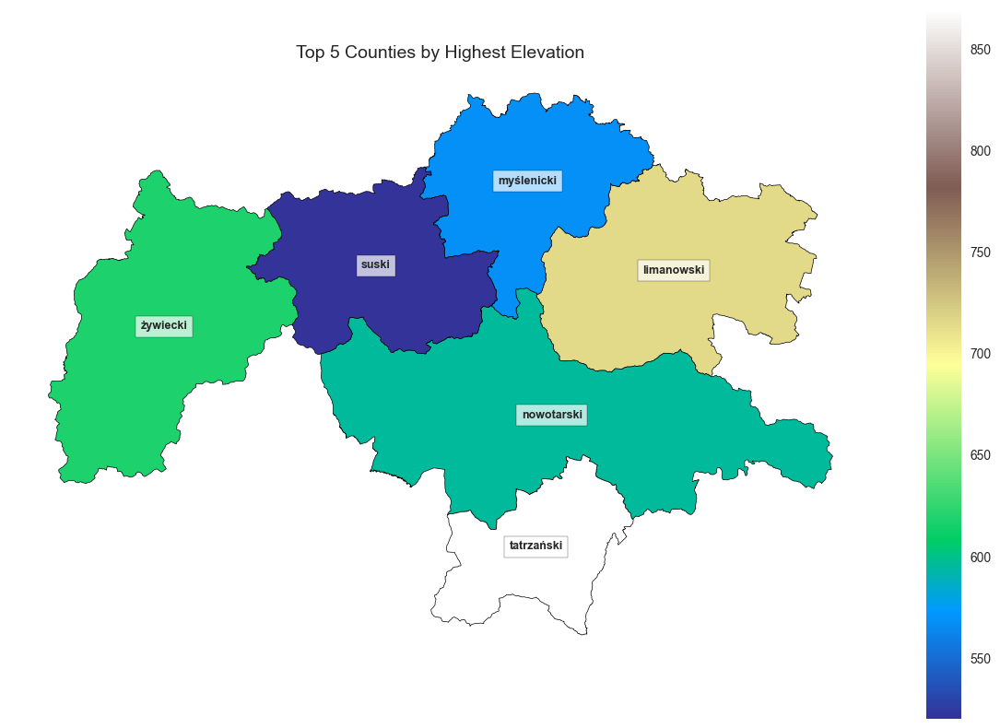

In [ ]:
import matplotlib.pyplot as plt

# Get the top 5 counties by elevation
top5_counties = df_counties[df_counties.year == 2022].sort_values(by='elevation', ascending=False).head(14)
top5_counties = df_counties[(df_counties.year == 2022) & df_counties['county'].isin(['tatrzański', 'nowotarski', 'suski','żywiecki', 'limanowski', 'myślenicki'])]

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the top 5 counties
top5_counties.plot(
    ax=ax,
    column='elevation',  # Color the counties by elevation
    cmap='terrain',      # A colormap appropriate for elevation
    legend=True,
    edgecolor='black',
    linewidth=0.5
)

# Add title and remove axis
ax.set_title('Top 5 Counties by Highest Elevation', fontsize=14)
ax.set_axis_off()

# Optional: Add county names as labels
for idx, row in top5_counties.iterrows():
    # Adjust this based on how county names are stored in your GeoDataFrame
    county_name = row.name if isinstance(row.name, str) else str(idx)
    if 'name' in row:
        county_name = row['name']
    elif 'county' in row:
        county_name = row['county']
    
    # Place text at the centroid of each county polygon
    centroid = row.geometry.centroid
    ax.text(centroid.x, centroid.y, county_name, 
            fontsize=9, ha='center', fontweight='bold',
            bbox=dict(facecolor='white', alpha=0.7))

plt.tight_layout()
plt.show()

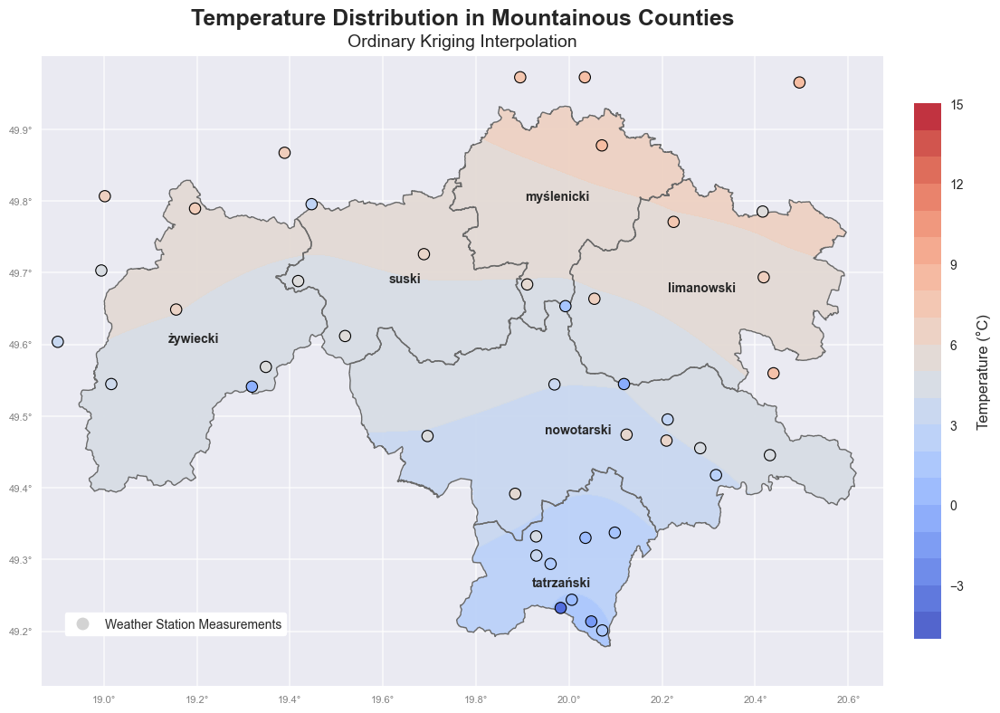

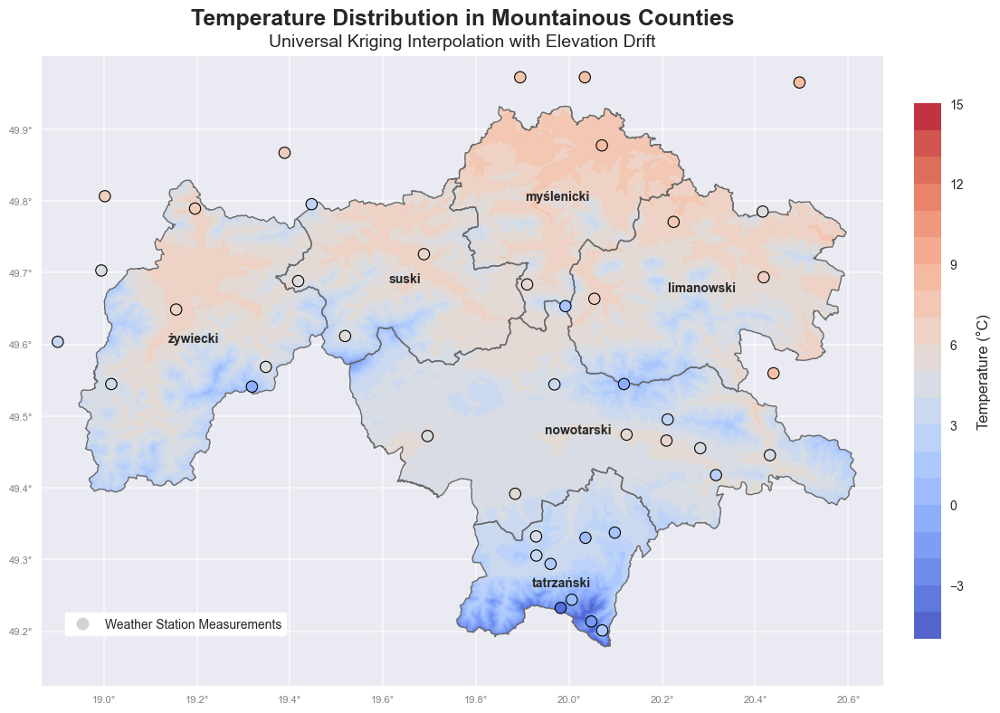

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import pyproj
from pykrige.ok import OrdinaryKriging
from pykrige.uk import UniversalKriging
import matplotlib.colors as mcolors
import rasterio
import os
from matplotlib.gridspec import GridSpec
from shapely.prepared import prep
from matplotlib.lines import Line2D

def create_lighter_ylgn():
    # Get the standard YlGn colormap colors
    ylgn = plt.get_cmap('YlGn')
    
    # Use only the first 80% of the YlGn colormap (0.0 to 0.8 range)
    colors = [
        ylgn(0.0),  # Start with lightest yellow
        ylgn(0.2),
        ylgn(0.4),
        ylgn(0.6),
    ]
    
    return mcolors.LinearSegmentedColormap.from_list('YlGn_modified', colors)

def get_unit_for_param(param):
    # Dummy implementation; update units accordingly.
    unit_map = {'B00606S': 'mm', 'B00802A': '%', 'B00300S': '°C'}
    return unit_map.get(param, '')

def inverse_distance_weighting(x, y, z, xi, yi, power=2):
    """Simple inverse distance weighting implementation."""
    out = np.zeros(xi.shape)
    for i in range(xi.shape[0]):
        for j in range(xi.shape[1]):
            dx = x - xi[i, j]
            dy = y - yi[i, j]
            dist = np.sqrt(dx**2 + dy**2)
            # Avoid division by zero
            dist[dist == 0] = 1e-12
            weights = 1 / (dist**power)
            out[i, j] = np.sum(z * weights) / np.sum(weights)
    return out

def compare_kriging_methods(
    params=['B00300S', 'B00802A', 'B00606S'],  # Temperature, Humidity, Precipitation
    year=2020,
    month=10,
    chosen_timestamp='2020-10-15 01:00',
    county_names=['tatrzański', 'nowotarski', 'suski','żywiecki', 'limanowski', 'myślenicki'],
    voivodeship_names=['małopolskie', 'małopolskie', 'małopolskie', 'śląskie', 'małopolskie', 'małopolskie'],
    vmin_dict={'B00606S': 0, 'B00802A': 60, 'B00300S': 0},
    vmax_dict={'B00606S': 1.8, 'B00802A': 100, 'B00300S': 15},
    steps_dict={'B00606S': 37, 'B00802A': 41, 'B00300S': 31},
    cmap_dict={'B00606S': 'Blues', 'B00802A': create_lighter_ylgn(), 'B00300S': 'coolwarm'},
    param_dict={'B00606S': 'Precipitation', 'B00802A': 'Humidity', 'B00300S': 'Temperature'}
):
    # Load weather stations data
    df_stations = pd.read_csv('../data/intermediate/weather_stations.csv')
    
    # Get all requested counties
    counties = []
    for i, county_name in enumerate(county_names):
        county = df_counties[(df_counties['county'] == county_name) & 
                          (df_counties['voivodeship'] == voivodeship_names[i]) & 
                          (df_counties['year'] == 2022)].to_crs("EPSG:4326")
        if not county.empty:
            counties.append(county)
        else:
            print(f"County {county_name} not found in data.")
    
    if not counties:
        print("No valid counties found.")
        return
    
    # Combine counties into a single GeoDataFrame
    selected_counties = pd.concat(counties)

    # Get boundary of the entire area (union of all counties)
    combined_boundary = selected_counties.union_all()
    
    # Create prepared geometry for faster calculations
    prepared_boundary = prep(combined_boundary)
    
    for param in params:
        measurement_path = os.path.join(
            '..', 'data', 'input', 'weather', str(year), str(month).zfill(2),
            f'{param}_{year}_{str(month).zfill(2)}.csv'
        )
        columns = ['station_id', 'measurement', 'datetime', 'value']
        df_measurements = pd.read_csv(
            measurement_path, sep=';', encoding='windows-1250',
            names=columns, header=None, index_col=False
        )
        
        df_measurements['value'] = df_measurements['value'].str.replace(',', '.').astype(float)
        df_measurements['datetime'] = pd.to_datetime(df_measurements['datetime'])
        df_measurements['station_id'] = pd.to_numeric(
            df_measurements['station_id'], errors='coerce').astype('Int64')
        df_measurements.dropna(subset=['station_id'], inplace=True)

        df_measurements = df_measurements.merge(
            df_stations[['id', 'latitude', 'longitude', 'elevation']],
            left_on='station_id', right_on='id'
        )
        
        # Filter to chosen timestamp
        chosen_timestamp_dt = pd.to_datetime(chosen_timestamp)
        weather_snapshot = df_measurements[df_measurements['datetime'] == chosen_timestamp_dt].copy()
        
        if weather_snapshot.empty:
            print(f"No data found for param '{param}' at timestamp {chosen_timestamp}")
            continue
            
        # Clean data
        weather_snapshot = weather_snapshot.dropna(subset=['value', 'latitude', 'longitude', 'elevation'])
        
        # Use lon/lat directly for calculation
        x, y = weather_snapshot['longitude'].values, weather_snapshot['latitude'].values
        
        # Create grid focused on the combined area
        bounds = combined_boundary.bounds
        buffer = 0.055
        
        grid_lon = np.linspace(bounds[0] - buffer, bounds[2] + buffer, 500)
        grid_lat = np.linspace(bounds[1] - buffer, bounds[3] + buffer, 500)
        grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
        grid_x, grid_y = grid_lon, grid_lat
        
        # Load DEM data for elevation-aware kriging
        with rasterio.open('../data/input/geographic/poland_dem.tif') as dem:
            elevation_data = dem.read(1)
            elevation_transform = dem.transform
        
        # Create elevation grid
        grid_elevation = np.zeros_like(grid_lon)
        for i in range(grid_lon.shape[0]):
            for j in range(grid_lon.shape[1]):
                row, col = ~elevation_transform * (grid_lon[i, j], grid_lat[i, j])
                row, col = int(row), int(col)
                if 0 <= row < elevation_data.shape[0] and 0 <= col < elevation_data.shape[1]:
                    grid_elevation[i, j] = elevation_data[col, row]
                else:
                    grid_elevation[i, j] = np.nan
        
        # Create mask for all counties
        mask = np.zeros(grid_lon.shape, dtype=bool)
        for i in range(grid_lon.shape[0]):
            for j in range(grid_lon.shape[1]):
                point = Point(grid_lon[i, j], grid_lat[i, j])
                mask[i, j] = prepared_boundary.contains(point)
        
        # Perform Ordinary Kriging
        z = weather_snapshot['value'].values
        OK = OrdinaryKriging(
            x, y, z,
            variogram_model='linear' if param != 'B00606S' else 'spherical',
        )
        z_ok, ss_ok = OK.execute('grid', grid_x[0, :], grid_y[:, 0])
        
        # Perform Universal Kriging with elevation drift
        UK = UniversalKriging(
            x, y, z,
            variogram_model='linear' if param != 'B00606S' else 'spherical',
            drift_terms=['specified'],
            specified_drift=[weather_snapshot['elevation'].values.reshape(-1, 1)]
        )
        z_uk, ss_uk = UK.execute('grid', grid_x[0, :], grid_y[:, 0], 
                                 specified_drift_arrays=[grid_elevation])
        
        # Apply county mask to results
        z_ok_masked = np.ma.array(z_ok, mask=~mask)
        z_uk_masked = np.ma.array(z_uk, mask=~mask)
        
        # Apply clipping if needed
        if param == 'B00802A':
            z_ok_masked = np.ma.clip(z_ok_masked, 0, 100)
            z_uk_masked = np.ma.clip(z_uk_masked, 0, 100)
        elif param == 'B00606S':
            z_ok_masked = np.ma.clip(z_ok_masked, 0, np.inf)
            z_uk_masked = np.ma.clip(z_uk_masked, 0, np.inf)
            
        # Set up plotting parameters
        vmin = vmin_dict.get(param, 0)
        vmax = vmax_dict.get(param, 25)
        steps = steps_dict.get(param, 26)
        cmap = cmap_dict.get(param, 'coolwarm')
        levels = np.linspace(vmin, vmax, steps)
        
        # Create separate figures for each method
        methods = [
            ("Ordinary Kriging Interpolation", z_ok_masked),
            ("Universal Kriging Interpolation with Elevation Drift", z_uk_masked)
        ]
        
        for title_suffix, z_masked in methods:
            # Create figure with improved styling
            fig = plt.figure(figsize=(12, 8), facecolor='white')
            plt.style.use('seaborn-v0_8')
            ax = fig.add_subplot(111)
            
            # Set background color
            ax.set_facecolor('#eaeaf2')
            
            # Plot all counties
            selected_counties.plot(ax=ax, color='#eaeaf2', alpha=0.5, edgecolor='none')
            
            # Add grid lines with improved styling (visible above county plots)
            ax.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2, zorder=1)
            
            # Plot contours with mask applied
            contour = ax.contourf(
                grid_lon, grid_lat, z_masked, cmap=cmap,
                levels=levels, vmin=vmin, vmax=vmax,
                alpha=0.9, zorder=2
            )
            
            # Add county boundaries on top
            selected_counties.boundary.plot(ax=ax, color='dimgray', linewidth=1.0, alpha=1.0, zorder=5)
            
            # Delete selected stations from the frame
            weather_snapshot = weather_snapshot[~weather_snapshot['station_id'].isin([249180230, 249180160, 249180010, 249180550])]

            # Plot stations on top of everything
            ax.scatter(
                weather_snapshot['longitude'], weather_snapshot['latitude'],
                c=weather_snapshot['value'], cmap=cmap, vmin=vmin, vmax=vmax,
                s=80, edgecolor='black', linewidth=0.8, zorder=10
            )
            
            # Add county labels
            for idx, row in selected_counties.iterrows():
                offset = 0 if row['county'] != 'tatrzański' else -0.03
                centroid = row.geometry.centroid
                ax.text(centroid.x, centroid.y + offset, row['county'],
                       fontsize=10, ha='center', va='center', fontweight='bold',
                       zorder=15)
            
            # Set main title
            ax.set_title(
                f"{param_dict[param]} Distribution in Mountainous Counties",
                pad=25, fontsize=18, fontweight='bold'
            )
            
            # Add subtitle with method
            ax.text(
                0.5, 1.015,
                title_suffix,
                transform=ax.transAxes,
                ha='center',
                fontsize=14
            )
            
            # Set up longitude and latitude ticks
            bounds = combined_boundary.bounds
            buffer = 0.055
            
            # Set longitude ticks (x-axis)
            lon_min, lon_max = bounds[0] - buffer, bounds[2] + buffer
            lon_ticks = np.arange(np.floor(lon_min * 10) / 10, np.ceil(lon_max * 10) / 10, 0.2)
            ax.set_xticks(lon_ticks)
            ax.set_xticklabels([f"{x:.1f}°" for x in lon_ticks], fontsize=8, color='gray')
            
            # Set latitude ticks (y-axis)
            lat_min, lat_max = bounds[1] - buffer, bounds[3] + buffer + 0.005
            lat_ticks = np.arange(np.floor(lat_min * 10) / 10, np.ceil(lat_max * 10) / 10, 0.1)
            ax.set_yticks(lat_ticks)
            ax.set_yticklabels([f"{y:.1f}°" for y in lat_ticks], fontsize=8, color='gray')
            
            # Style tick parameters and remove spines
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.tick_params(axis='both', colors='gray', labelsize=8)
            
            # Ensure the map is properly centered on the counties
            ax.set_xlim(bounds[0] - buffer - 0.025, bounds[2] + buffer + 0.003)
            ax.set_ylim(bounds[1] - buffer, bounds[3] + buffer + 0.015)
            
            # Add a colorbar
            cbar = fig.colorbar(contour, pad=0.03, shrink=0.8)
            cbar.set_label(
                f"{param_dict[param]} ({get_unit_for_param(param)})",
                fontsize=12,
                labelpad=10
            )
            
            # Add legend
            legend_elements = [Line2D([0], [0], marker='o', color='white',
                                     markerfacecolor='lightgray', markeredgecolor='black',
                                     markersize=10, alpha=1.0, label='Weather Station Measurements')]
            
            ax.legend(handles=legend_elements,
                     frameon=True,
                     framealpha=1.0,
                     edgecolor='white',
                     facecolor='white',
                     loc='lower left',
                     bbox_to_anchor=(0.02, 0.07))
            
            plt.tight_layout()
            plt.show()

# Run the comparison
compare_kriging_methods(
    params=['B00300S'],  # Just temperature for this example
    # params=['B00300S', 'B00802A'],
    year=2020,
    month=10,
    chosen_timestamp='2020-10-15 01:00',
    county_names=['tatrzański', 'nowotarski', 'suski', 'żywiecki', 'limanowski', 'myślenicki'],
    voivodeship_names=['małopolskie', 'małopolskie', 'małopolskie', 'śląskie', 'małopolskie', 'małopolskie'],
    vmin_dict={'B00606S': 0, 'B00802A': 60, 'B00300S': -5},
    vmax_dict={'B00606S': 1.8, 'B00802A': 100, 'B00300S': 15},
    steps_dict={'B00606S': 37, 'B00802A': 41, 'B00300S': 21},
    cmap_dict={'B00606S': 'Blues', 'B00802A': create_lighter_ylgn(), 'B00300S': 'coolwarm'},
    param_dict={'B00606S': 'Precipitation', 'B00802A': 'Humidity', 'B00300S': 'Temperature'}
)

## Weather stations vs counties

## Weather stations 

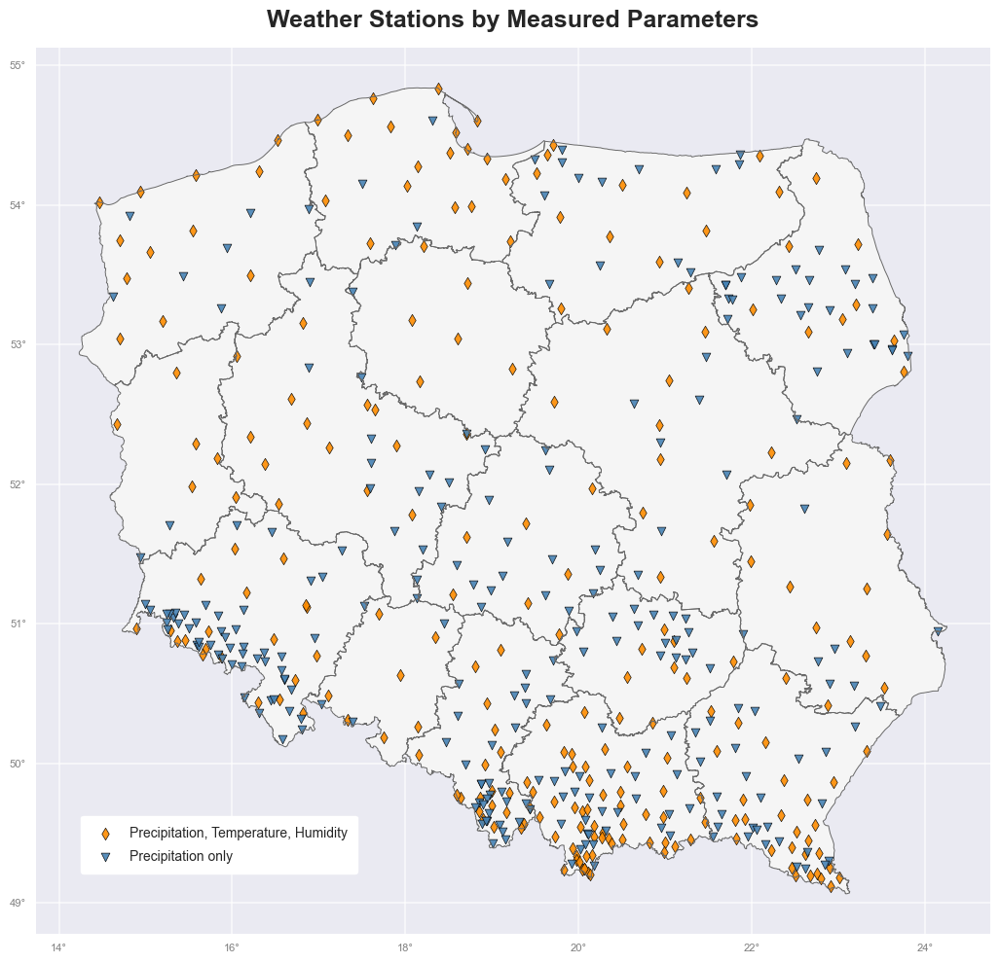

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
from pyproj import Transformer

df_weather_stations = pd.read_csv('../data/intermediate/weather_stations.csv')

# Create geometry for weather stations
geometry = [Point(xy) for xy in zip(df_weather_stations['longitude'], df_weather_stations['latitude'])]
gdf_stations = gpd.GeoDataFrame(df_weather_stations, geometry=geometry, crs="EPSG:4326")

# Filter out stations with 'No data' category
gdf_stations = gdf_stations[gdf_stations['category'] != 'No data']

# Ensure correct CRS for proper plotting
if geodata_voivodeships.crs != gdf_stations.crs:
    gdf_stations = gdf_stations.to_crs(geodata_voivodeships.crs)

# Set up plot
fig, ax = plt.subplots(1, 1, figsize=(15, 10), facecolor='white')

# Set background color to match plot_geodataframe style
ax.set_facecolor('#eaeaf2')

# Add grid lines before plotting data
ax.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)
ax.set_axisbelow(True)  # Put grid behind other elements

# Plot base map (voivodeships) - fill first
geodata_voivodeships.plot(
    ax=ax,
    color='whitesmoke',
    edgecolor='none',  # remove edges for the fill layer
    alpha=1.0,
)

# Add borders as a separate layer without transparency
geodata_voivodeships.boundary.plot(
    ax=ax,
    color='dimgray',
    linewidth=0.7
)

# Define marker styles for station categories
marker_map = {
    'Precipitation, Temperature, Humidity': 'd',     # diamond
    'Precipitation only': 'v',     # triangle
}

# Define color map for station categories
color_map = {
    'Precipitation, Temperature, Humidity': 'darkorange',  # orange color for stations with all 3 params
    'Precipitation only': 'steelblue'
}

# Plot weather stations by category
for category, marker in marker_map.items():
    subset = gdf_stations[gdf_stations['category'] == category]
    subset.plot(
        ax=ax,
        marker=marker,
        color=color_map[category],  # use category-specific color
        markersize=40,
        label=category,
        alpha=0.9,
        edgecolor='black',
        linewidth=0.5,
    )

# Add title with styling from plot_geodataframe
ax.set_title('Weather Stations by Measured Parameters', 
             pad=15, 
             fontsize=18, 
             fontweight='bold')

# Style the legend to match
ax.legend(
    fontsize=10,
    frameon=True,
    framealpha=1.0,
    edgecolor='white',
    facecolor='white',
    loc='lower left',
    bbox_to_anchor=(0.04, 0.06),
    borderpad=0.8,  # Add more padding inside the legend box
    labelspacing=0.7  # Increase space between legend items
)

# Customize spines - similar to plot_geodataframe
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Keep ticks visible but subtle - similar to plot_geodataframe
ax.tick_params(axis='both', colors='gray', labelsize=8)

# Add coordinate grid labels using Transformer approach
# Get current map bounds
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

# Create evenly spaced coordinates in lat/lon space
lon_ticks = np.array([i for i in range(int(np.floor(xmin)), int(np.ceil(xmax)) + 1) if i % 2 == 0])
lat_ticks = np.array([i for i in range(int(np.floor(ymin)), int(np.ceil(ymax)) + 1)])

# Filter to only ticks within plot bounds
lon_ticks = lon_ticks[(lon_ticks >= xmin) & (lon_ticks <= xmax)]
lat_ticks = lat_ticks[(lat_ticks >= ymin) & (lat_ticks <= ymax)]

# Using Transformer approach for coordinate labels
if geodata_voivodeships.crs != "EPSG:4326":  # If not in WGS84 lat/long
    # Create transformer from current CRS to WGS84
    transformer = Transformer.from_crs(geodata_voivodeships.crs, "EPSG:4326", always_xy=True)
    
    # Find the lat/lon bounds of the map
    corners = [(xmin, ymin), (xmin, ymax), (xmax, ymin), (xmax, ymax)]
    lons, lats = zip(*[transformer.transform(x, y) for x, y in corners])
    lon_min, lon_max = min(lons), max(lons)
    lat_min, lat_max = min(lats), max(lats)
    
    # Create evenly spaced coordinates in lat/lon space
    lon_ticks = np.array([i for i in range(int(np.floor(lon_min)), int(np.ceil(lon_max)) + 1) if i % 2 == 0])
    lat_ticks = np.array([i for i in range(int(np.floor(lat_min)), int(np.ceil(lat_max)) + 1)])
    
    # Transform these lat/lon positions back to the map's coordinate system
    reverse_transformer = Transformer.from_crs("EPSG:4326", geodata_voivodeships.crs, always_xy=True)
    
    # Get x positions for longitude lines
    x_pos = []
    x_labels = []
    for lon in lon_ticks:
        x, _ = reverse_transformer.transform(lon, (lat_min + lat_max) / 2)
        if xmin <= x <= xmax:  # Only use if in bounds
            x_pos.append(x)
            x_labels.append(f"{lon}°")
    
    # Get y positions for latitude lines
    y_pos = []
    y_labels = []
    for lat in lat_ticks:
        _, y = reverse_transformer.transform((lon_min + lon_max) / 2, lat)
        if ymin <= y <= ymax:  # Only use if in bounds
            y_pos.append(y)
            y_labels.append(f"{lat}°")
    
    # Set tick positions and labels
    ax.set_xticks(x_pos)
    ax.set_yticks(y_pos)
    ax.set_xticklabels(x_labels)
    ax.set_yticklabels(y_labels)

# Show plot
plt.tight_layout()
plt.show()

## Weather Histogram

In [ ]:
df_incidents[df_incidents.datetime.dt.year >= 2020].precipation.isna().sum()

np.int64(30460)

In [95]:
df_incidents = pd.read_csv('../data/intermediate/accidents_with_weather.csv')
# df_incidents = pd.read_csv('../data/intermediate/incidents_all.csv')
# df_incidents = pd.read_csv('../data/intermediate/data_all.csv')
df_incidents['datetime'] = pd.to_datetime(df_incidents['datetime'])
df_incidents

,id,datetime,longitude,latitude,voivodeship,county,municipality,city,incident_type,other_cause,...,surface_condition,surface_marking,intersection_type,traffic_lights,built_up_area,elevation,temperature,precipation,humidity,precipation_24h
0,98772347,2015-02-23 15:55:00,19.970528,50.079028,małopolskie,Kraków,Kraków,Kraków,Najechanie na pieszego,Brak,...,Sucha,Jest,Z drogą z pierwsz.,"Jest, działa",Obszar zabudowany,208.385100,NaN,NaN,NaN,NaN
1,110531047,2021-09-21 06:35:00,22.497722,52.911667,podlaskie,wysokomazowiecki,Wysokie Mazowieckie,Wysokie Mazowieckie,Najechanie na pieszego,Brak,...,Sucha,Jest,Brak,Brak,Obszar zabudowany,145.495540,6.43,0.0,82.05,0.1
2,104988338,2016-11-01 19:30:00,23.161944,53.137778,podlaskie,Białystok,Białystok,Białystok,Najechanie na pieszego,Brak,...,Mokra,Jest,Z drogą z pierwsz.,Brak,Obszar zabudowany,130.480960,NaN,NaN,NaN,NaN
3,124590550,2023-01-13 09:00:00,18.617166,54.375527,pomorskie,Gdańsk,Gdańsk,Gdańsk,Zderzenie pojazdów tylne,NaN,...,NaN,NaN,NaN,NaN,NaN,13.598199,8.30,0.0,92.00,0.2
4,104551628,2016-06-30 13:00:00,17.467750,50.856611,opolskie,brzeski,Brzeg,Brzeg,Zderzenie pojazdów boczne,Brak,...,Sucha,Jest,Z drogą z pierwsz.,Brak,Obszar zabudowany,151.008770,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249952,120878012,2022-07-05 13:24:00,22.051306,49.959167,podkarpackie,rzeszowski,Tyczyn,Tyczyn,Wywrócenie się pojazdu,Brak,...,Sucha,Jest,Brak,Brak,Obszar zabudowany,230.263030,22.60,0.0,62.00,0.0
249953,109491179,2020-10-26 18:25:00,18.595000,54.404444,pomorskie,Gdańsk,Gdańsk,Gdańsk,Zderzenie pojazdów boczne,Brak,...,Sucha,Nie ma,Brak,Brak,Obszar zabudowany,10.589193,12.30,0.0,86.00,0.0
249954,109259104,2020-07-03 17:32:00,17.067916,50.779471,dolnośląskie,strzeliński,Strzelin,Strzelin,Najechanie na pieszego,Brak,...,Sucha,Jest,Brak,Brak,Obszar zabudowany,165.091920,21.53,0.0,63.32,0.1
249955,106049857,2017-06-15 13:10:00,18.587500,54.358611,pomorskie,Gdańsk,Gdańsk,Gdańsk,Wypadek z pasażerem,Nieustalone,...,Sucha,Jest,Z drogą z pierwsz.,Brak,Obszar zabudowany,94.792970,NaN,NaN,NaN,NaN


In [61]:
df_weather = pd.read_csv('../data/intermediate/weather_daily.csv')
df_weather = pd.read_csv('../data/intermediate/weather_daily_kriging.csv')
df_weather

,date,county,voivodeship,seat,temperature,precipation,humidity
0,2019-01-01,Biała Podlaska,lubelskie,Biała Podlaska,2.334438,0.872903,91.083029
1,2019-01-01,Białystok,podlaskie,Białystok,2.441872,0.319412,92.226574
2,2019-01-01,Bielsko-Biała,śląskie,Bielsko-Biała,3.012782,0.941495,87.991469
3,2019-01-01,Bydgoszcz,kujawsko-pomorskie,Bydgoszcz,4.582066,0.227262,88.779192
4,2019-01-01,Bytom,śląskie,Bytom,3.009996,0.151493,88.634673
...,...,...,...,...,...,...,...
1249055,2018-12-31,żarski,lubuskie,Żary,3.078380,3.496512,90.482753
1249056,2018-12-31,żniński,kujawsko-pomorskie,Żnin,2.436609,3.025265,89.007494
1249057,2018-12-31,żuromiński,mazowieckie,Żuromin,2.397563,3.254790,88.654360
1249058,2018-12-31,żyrardowski,mazowieckie,Żyrardów,2.640164,3.436984,88.037757


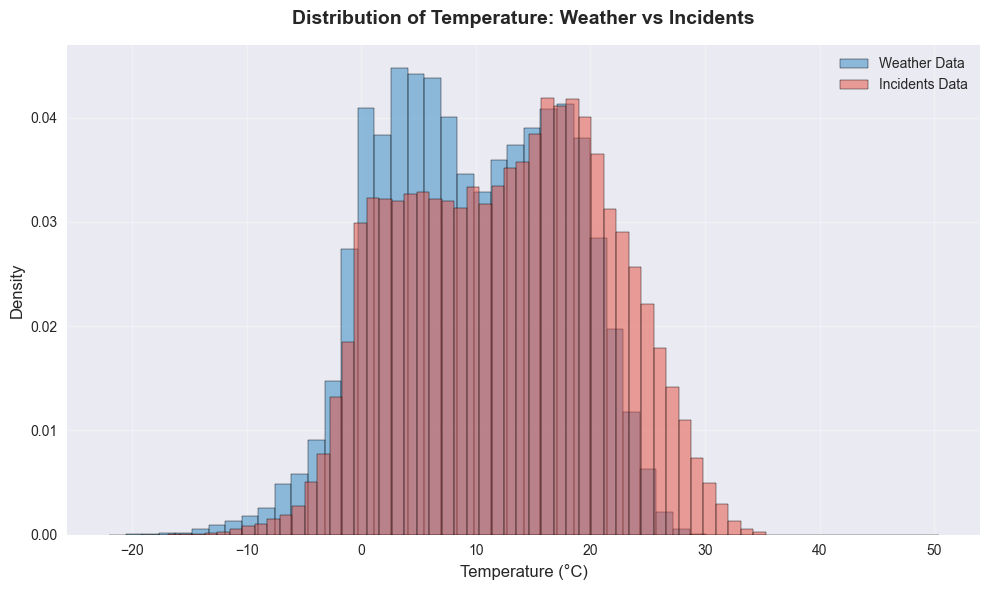

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Create figure with specific size
plt.figure(figsize=(10, 6))

# Create overlapping histograms with normalized data (stat='density')
sns.histplot(
    data=df_weather,
    x='temperature',
    bins=50,
    kde=False,
    stat='density',
    color='#2E86C1',
    alpha=0.5,
    label='Weather Data'
)

sns.histplot(
    data=df_incidents[
        (df_incidents.temperature > df_incidents.temperature.nsmallest(7).max()) &
        (df_incidents.temperature < df_incidents.temperature.nlargest(7).min())
    ],
    x='temperature',
    bins=50,
    kde=False,
    stat='density',
    color='#E74C3C',
    alpha=0.5,
    label='Incidents Data'
)

# Customize the plot
plt.title('Distribution of Temperature: Weather vs Incidents', pad=15, fontsize=14, fontweight='bold')
plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Density', fontsize=12)  # Changed to Density since we're using normalized values

# Add legend
plt.legend(fontsize=10)

# Add grid
plt.grid(True, alpha=0.3)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

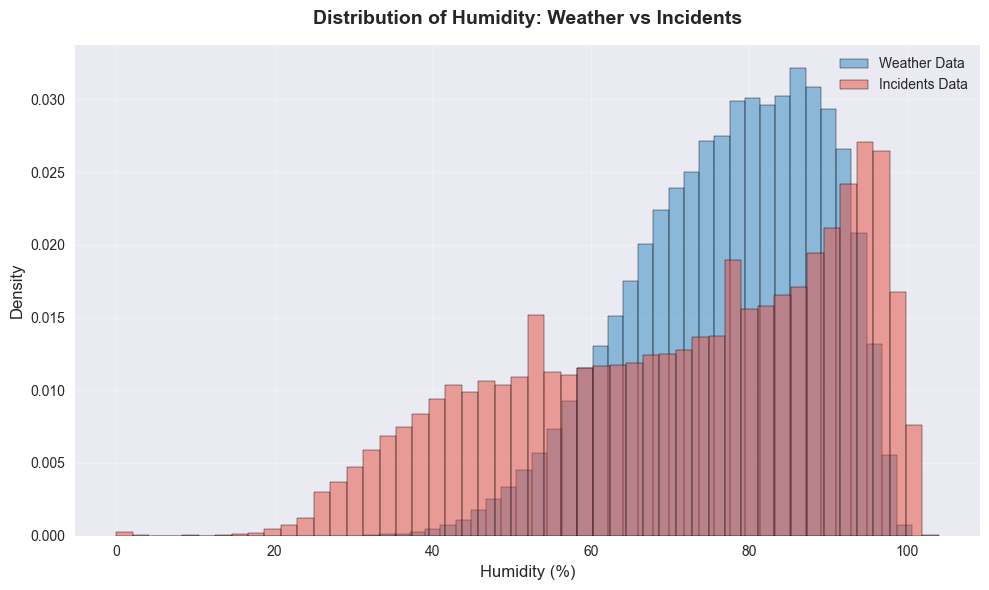

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Create figure with specific size
plt.figure(figsize=(10, 6))

# Create overlapping histograms with normalized data (stat='density')
sns.histplot(
    data=df_weather,
    x='humidity',
    bins=50,
    kde=False,
    stat='density',
    color='#2E86C1',
    alpha=0.5,
    label='Weather Data'
)

sns.histplot(
    data=df_incidents,
    x='humidity',
    bins=50,
    kde=False,
    stat='density',
    color='#E74C3C',
    alpha=0.5,
    label='Incidents Data'
)

# Customize the plot
plt.title('Distribution of Humidity: Weather vs Incidents', pad=15, fontsize=14, fontweight='bold')
plt.xlabel('Humidity (%)', fontsize=12)
plt.ylabel('Density', fontsize=12)  # Changed to Density since we're using normalized values

# Add legend
plt.legend(fontsize=10)

# Add grid
plt.grid(True, alpha=0.3)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Create figure with specific size
plt.figure(figsize=(10, 6))

# Create overlapping histograms with normalized data (stat='density')
sns.histplot(
    data=df_weather[(df_weather.precipation > 0.000001)],
    x='precipation',
    bins=50,
    kde=False,
    stat='density',
    color='#2E86C1',
    alpha=0.5,
    label='Weather Data',
    log_scale=True
)

sns.histplot(
    data=df_incidents[df_incidents.precipation_24h > 0.000001],
    x='precipation_24h',
    bins=50,
    kde=False,
    stat='density',
    color='#E74C3C',
    alpha=0.5,
    label='Incidents Data',
    log_scale=True
)

# Customize the plot
plt.title('Distribution of Precipitation: Weather vs Incidents', pad=15, fontsize=14, fontweight='bold')
plt.xlabel('Precipitation (mm)', fontsize=12)
plt.ylabel('Density', fontsize=12)  # Changed to Density since we're using normalized values

# Add legend
plt.legend(fontsize=10)

# Add grid
plt.grid(True, alpha=0.3)

# plt.grid(True, linestyle='-', alpha=0.7, color='white', linewidth=1.2)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## Weather no accidents vs accidents

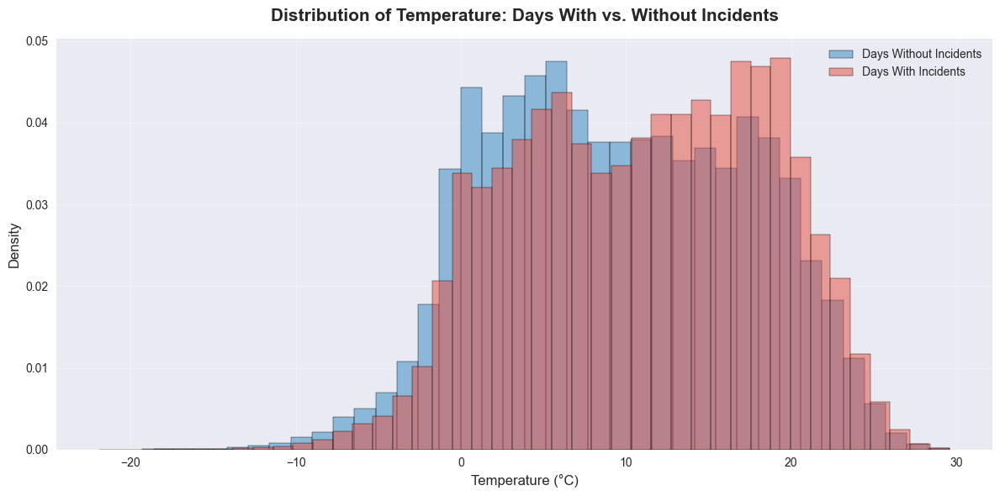

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Prepare data - group incidents by county and date
df_incidents['date'] = pd.to_datetime(df_incidents['datetime']).dt.date
incidents_by_county_date = df_incidents.groupby(['county', 'voivodeship', 'date']).size().reset_index(name='incident_count')

# Prepare weather data
df_weather['date'] = pd.to_datetime(df_weather['date']).dt.date

# Create a merged dataset to identify days with/without incidents per county
merged_data = pd.merge(
    df_weather, 
    incidents_by_county_date, 
    on=['county', 'voivodeship', 'date'], 
    how='left'
)
merged_data['has_incident'] = merged_data['incident_count'].notna()
merged_data.fillna({'incident_count': 0}, inplace=True)

# Set the style
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8')

# Create overlapping histograms for temperature
sns.histplot(
    data=merged_data[~merged_data['has_incident']],
    x='temperature',
    bins=40,
    kde=False,
    stat='density',
    color='#2E86C1',
    alpha=0.5,
    label='Days Without Incidents'
)

sns.histplot(
    data=merged_data[merged_data['has_incident']],
    x='temperature',
    bins=40,
    kde=False,
    stat='density',
    color='#E74C3C',
    alpha=0.5,
    label='Days With Incidents'
)

# Customize the plot
plt.title('Distribution of Temperature: Days With vs. Without Incidents', pad=15, fontsize=15, fontweight='bold')
plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

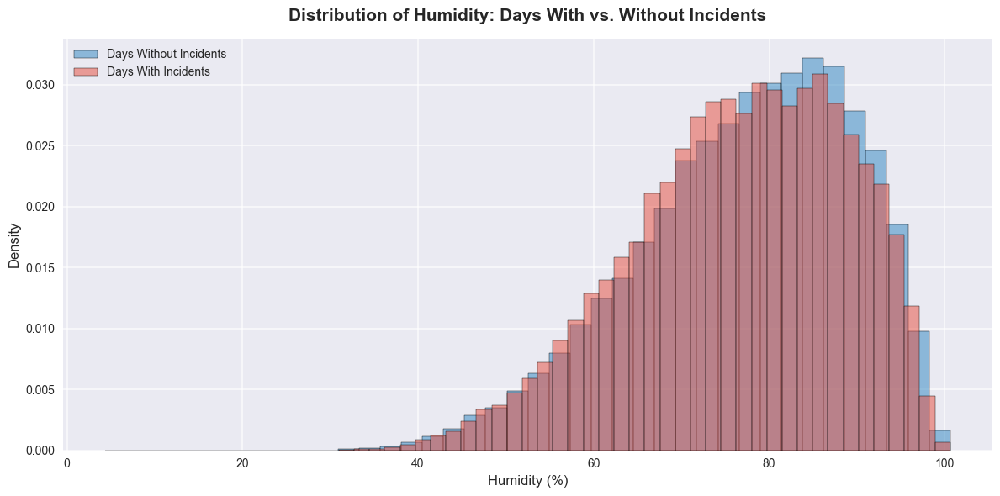

In [ ]:
# Create overlapping histograms for humidity
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8')

sns.histplot(
    data=merged_data[~merged_data['has_incident']],
    x='humidity',
    bins=40,
    kde=False,
    stat='density',
    color='#2E86C1',
    alpha=0.5,
    label='Days Without Incidents'
)

sns.histplot(
    data=merged_data[merged_data['has_incident']],
    x='humidity',
    bins=40,
    kde=False,
    stat='density',
    color='#E74C3C',
    alpha=0.5,
    label='Days With Incidents'
)

# Customize the plot
plt.title('Distribution of Humidity: Days With vs. Without Incidents', pad=15, fontsize=15, fontweight='bold')
plt.xlabel('Humidity (%)', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

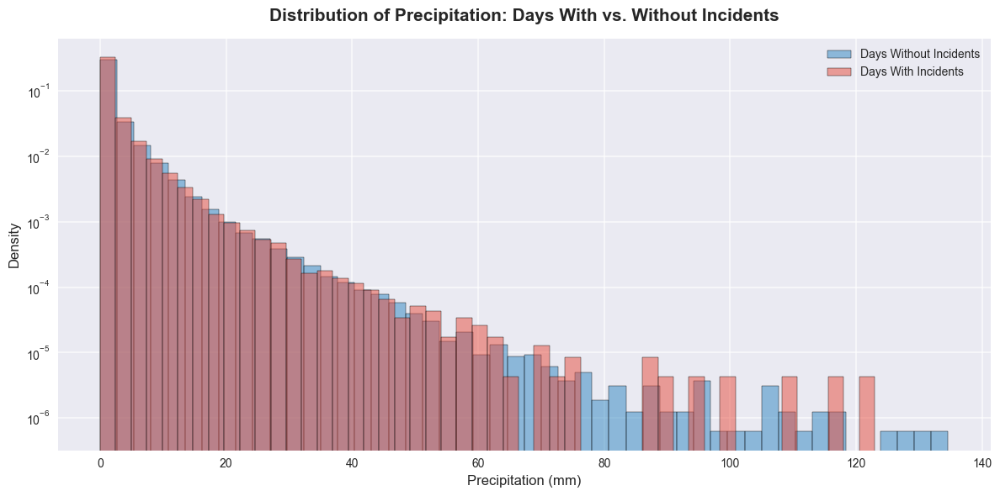

In [ ]:
# Find the threshold for excluding the 5 largest precipitation values
precip_threshold = merged_data['precipation'].nlargest(10).min()

# Create a filtered dataset excluding the 5 largest precipitation values
filtered_data = merged_data[merged_data['precipation'] < precip_threshold]

# Precipitation histogram
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8')

# Create overlapping histograms for precipitation using filtered data
sns.histplot(
    data=filtered_data[~filtered_data['has_incident']],
    x='precipation',
    bins=50,
    kde=False,
    stat='density',
    color='#2E86C1',
    alpha=0.5,
    label='Days Without Incidents'
)

sns.histplot(
    data=filtered_data[filtered_data['has_incident']],
    x='precipation',
    bins=50,
    kde=False,
    stat='density',
    color='#E74C3C',
    alpha=0.5,
    label='Days With Incidents'
)

# Customize the plot
plt.title('Distribution of Precipitation: Days With vs. Without Incidents', 
          pad=15, fontsize=15, fontweight='bold')
plt.xlabel('Precipitation (mm)', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
# plt.xscale('log')
plt.yscale('log')
plt.tight_layout()
plt.show()

## Weather standard vs majority of incidents days

In [33]:
county_date_incidents.sort_values(by=['daily_incidents'], ascending=False)

,county,voivodeship,date,daily_incidents
17076,Kraków,małopolskie,2016-12-01,16
180510,Łódź,łódzkie,2015-11-18,14
180713,Łódź,łódzkie,2016-06-15,14
181000,Łódź,łódzkie,2017-04-07,14
181189,Łódź,łódzkie,2017-10-16,13
...,...,...,...,...
76874,inowrocławski,kujawsko-pomorskie,2019-10-06,1
76875,inowrocławski,kujawsko-pomorskie,2019-10-19,1
76877,inowrocławski,kujawsko-pomorskie,2019-11-21,1
76879,inowrocławski,kujawsko-pomorskie,2019-11-23,1


Total unique days: 3287
Data points for high-incident days: 193475
Data points for normal days: 1055585


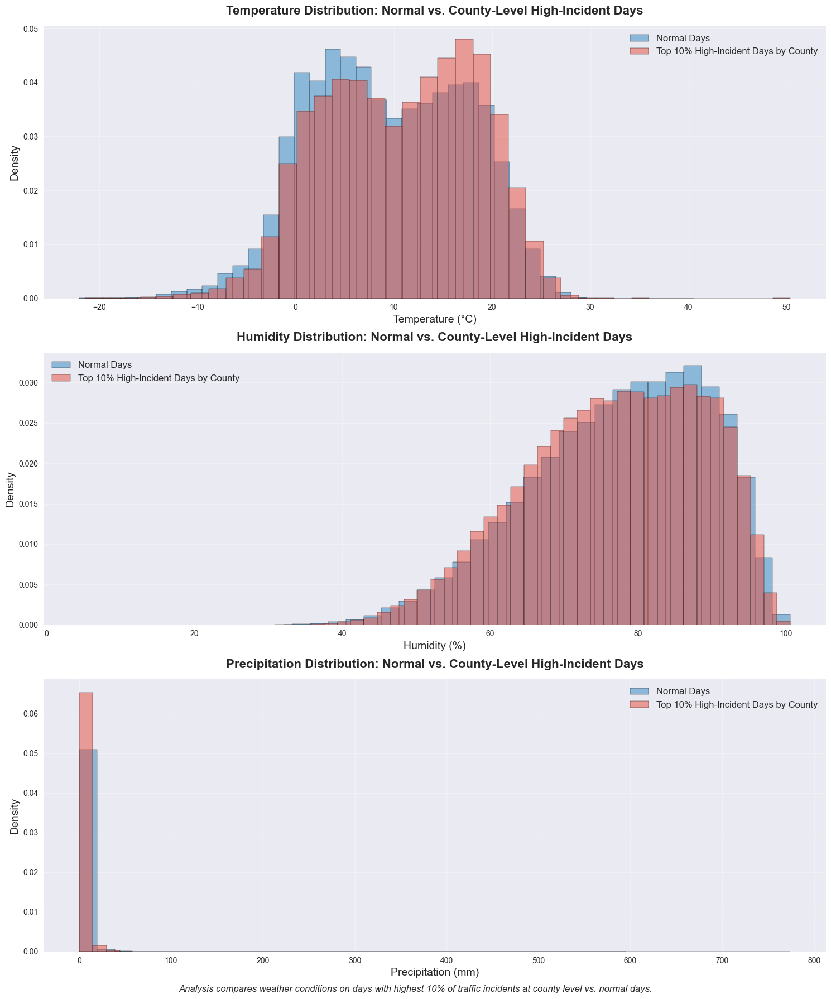


Statistical Summary:
             Variable  Normal Days - Mean  High-Incident Days - Mean  \
0    Temperature (°C)            9.390437                  10.709211   
1        Humidity (%)           77.519489                  76.876462   
2  Precipitation (mm)            1.801096                   1.875601   

   Difference (%)  
0       14.043792  
1       -0.829504  
2        4.136605  


In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec

# Set the style
plt.style.use('seaborn-v0_8')

# Define parameter for top percentage of high-incident days
p = 10  # top 20% of days with highest incident counts

# First, let's aggregate incidents by county and date
df_incidents['date'] = pd.to_datetime(df_incidents['datetime']).dt.date
county_date_incidents = df_incidents.groupby(['county', 'voivodeship', 'date']).size().reset_index(name='daily_incidents')

# For each county, identify the top p% days with most incidents
high_incident_dates = {}  # Dictionary to store high-incident dates by county

thresholds = []
for (county, voivodeship), group in county_date_incidents.groupby(['county', 'voivodeship']):
    if len(group) > 0:  # Only process counties with incident data
        # Calculate threshold for top p%
        threshold = np.percentile(group['daily_incidents'][group['daily_incidents'] > 0], 100-p)
        thresholds.append(threshold)
        threshold = 1
        # Get dates above threshold
        high_days = group[group['daily_incidents'] >= threshold]['date'].tolist()
        # Store in dictionary
        high_incident_dates[(county, voivodeship)] = high_days

# Prepare weather data
df_weather['date'] = pd.to_datetime(df_weather['date']).dt.date

# Create a function to check if a date is a high-incident day for a specific county
def is_high_incident_day(row):
    key = (row['county'], row['voivodeship'])
    if key in high_incident_dates:
        return row['date'] in high_incident_dates[key]
    return False

# Apply the function to create a new column
df_weather['high_incident_day'] = df_weather.apply(is_high_incident_day, axis=1)

# Print some statistics
total_days = len(df_weather['date'].unique())
high_days = df_weather[df_weather['high_incident_day']].shape[0]
normal_days = df_weather[~df_weather['high_incident_day']].shape[0]
print(f"Total unique days: {total_days}")
print(f"Data points for high-incident days: {high_days}")
print(f"Data points for normal days: {normal_days}")

# Create a figure with 3 rows for our histograms
fig = plt.figure(figsize=(15, 18))
gs = GridSpec(3, 1, figure=fig)

# Colors for consistency
normal_color = '#2E86C1'
high_color = '#E74C3C'

# 1. Temperature comparison
ax1 = fig.add_subplot(gs[0, 0])

sns.histplot(
    data=df_weather[~df_weather['high_incident_day']],
    x='temperature',
    bins=40,
    stat='density',
    color=normal_color,
    alpha=0.5,
    label='Normal Days',
    ax=ax1
)

sns.histplot(
    data=df_weather[df_weather['high_incident_day']],
    x='temperature',
    bins=40,
    stat='density',
    color=high_color,
    alpha=0.5,
    label=f'Top {p}% High-Incident Days by County',
    ax=ax1
)

ax1.set_title('Temperature Distribution: Normal vs. County-Level High-Incident Days', 
              pad=15, fontsize=16, fontweight='bold')
ax1.set_xlabel('Temperature (°C)', fontsize=14)
ax1.set_ylabel('Density', fontsize=14)
ax1.legend(fontsize=12)
ax1.grid(True, alpha=0.3)

# 2. Humidity comparison
ax2 = fig.add_subplot(gs[1, 0])

sns.histplot(
    data=df_weather[~df_weather['high_incident_day']],
    x='humidity',
    bins=40,
    stat='density',
    color=normal_color,
    alpha=0.5,
    label='Normal Days',
    ax=ax2
)

sns.histplot(
    data=df_weather[df_weather['high_incident_day']],
    x='humidity',
    bins=40,
    stat='density',
    color=high_color,
    alpha=0.5,
    label=f'Top {p}% High-Incident Days by County',
    ax=ax2
)

ax2.set_title('Humidity Distribution: Normal vs. County-Level High-Incident Days', 
              pad=15, fontsize=16, fontweight='bold')
ax2.set_xlabel('Humidity (%)', fontsize=14)
ax2.set_ylabel('Density', fontsize=14)
ax2.legend(fontsize=12)
ax2.grid(True, alpha=0.3)

# 3. Precipitation comparison (excluding zero values for better visibility)
ax3 = fig.add_subplot(gs[2, 0])

# Filter out zeros and extreme values for better visualization
precip_normal = df_weather[(~df_weather['high_incident_day']) & 
                           (df_weather['precipation'] > 0.01) & 
                           (df_weather['precipation'] < df_weather['precipation'].nlargest(5).min())]

precip_high = df_weather[(df_weather['high_incident_day']) & 
                        (df_weather['precipation'] > 0.01) & 
                        (df_weather['precipation'] < df_weather['precipation'].nlargest(5).min())]

sns.histplot(
    data=precip_normal,
    x='precipation',
    bins=40,
    stat='density',
    color=normal_color,
    alpha=0.5,
    label='Normal Days',
    ax=ax3
)

sns.histplot(
    data=precip_high,
    x='precipation',
    bins=40,
    stat='density',
    color=high_color,
    alpha=0.5,
    label=f'Top {p}% High-Incident Days by County',
    ax=ax3
)

ax3.set_title('Precipitation Distribution: Normal vs. County-Level High-Incident Days', 
              pad=15, fontsize=16, fontweight='bold')
ax3.set_xlabel('Precipitation (mm)', fontsize=14)
ax3.set_ylabel('Density', fontsize=14)
ax3.legend(fontsize=12)
ax3.grid(True, alpha=0.3)

# Add a note about the analysis approach
plt.figtext(0.5, 0.01, 
           f"Analysis compares weather conditions on days with highest {p}% of traffic incidents at county level vs. normal days.", 
           ha='center', fontsize=12, fontstyle='italic')

plt.tight_layout()
plt.subplots_adjust(bottom=0.05)
plt.show()

# Additionally, create statistical summary
weather_stats = pd.DataFrame({
    'Variable': ['Temperature (°C)', 'Humidity (%)', 'Precipitation (mm)'],
    'Normal Days - Mean': [
        df_weather[~df_weather['high_incident_day']]['temperature'].mean(),
        df_weather[~df_weather['high_incident_day']]['humidity'].mean(),
        df_weather[~df_weather['high_incident_day']]['precipation'].mean()
    ],
    'High-Incident Days - Mean': [
        df_weather[df_weather['high_incident_day']]['temperature'].mean(),
        df_weather[df_weather['high_incident_day']]['humidity'].mean(),
        df_weather[df_weather['high_incident_day']]['precipation'].mean()
    ],
    'Difference (%)': [
        100 * (df_weather[df_weather['high_incident_day']]['temperature'].mean() - 
              df_weather[~df_weather['high_incident_day']]['temperature'].mean()) / 
              df_weather[~df_weather['high_incident_day']]['temperature'].mean(),
        
        100 * (df_weather[df_weather['high_incident_day']]['humidity'].mean() - 
              df_weather[~df_weather['high_incident_day']]['humidity'].mean()) / 
              df_weather[~df_weather['high_incident_day']]['humidity'].mean(),
        
        100 * (df_weather[df_weather['high_incident_day']]['precipation'].mean() - 
              df_weather[~df_weather['high_incident_day']]['precipation'].mean()) / 
              df_weather[~df_weather['high_incident_day']]['precipation'].mean() if df_weather[~df_weather['high_incident_day']]['precipation'].mean() > 0 else float('nan')
    ]
})

print("\nStatistical Summary:")
print(weather_stats)

## Weather stats

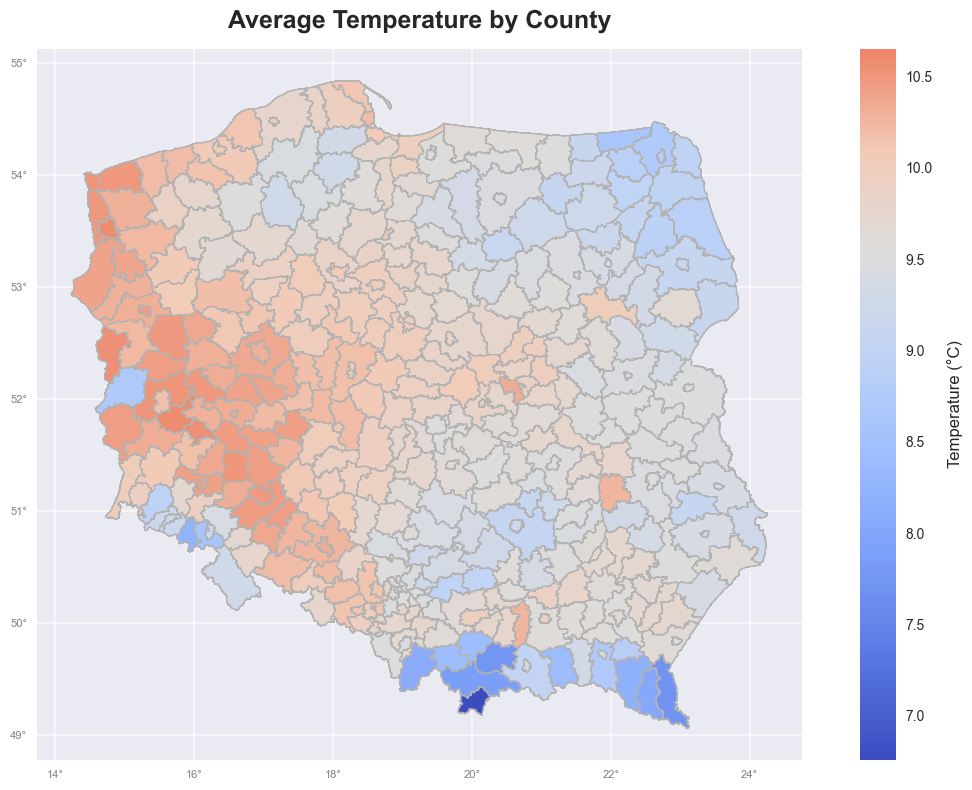

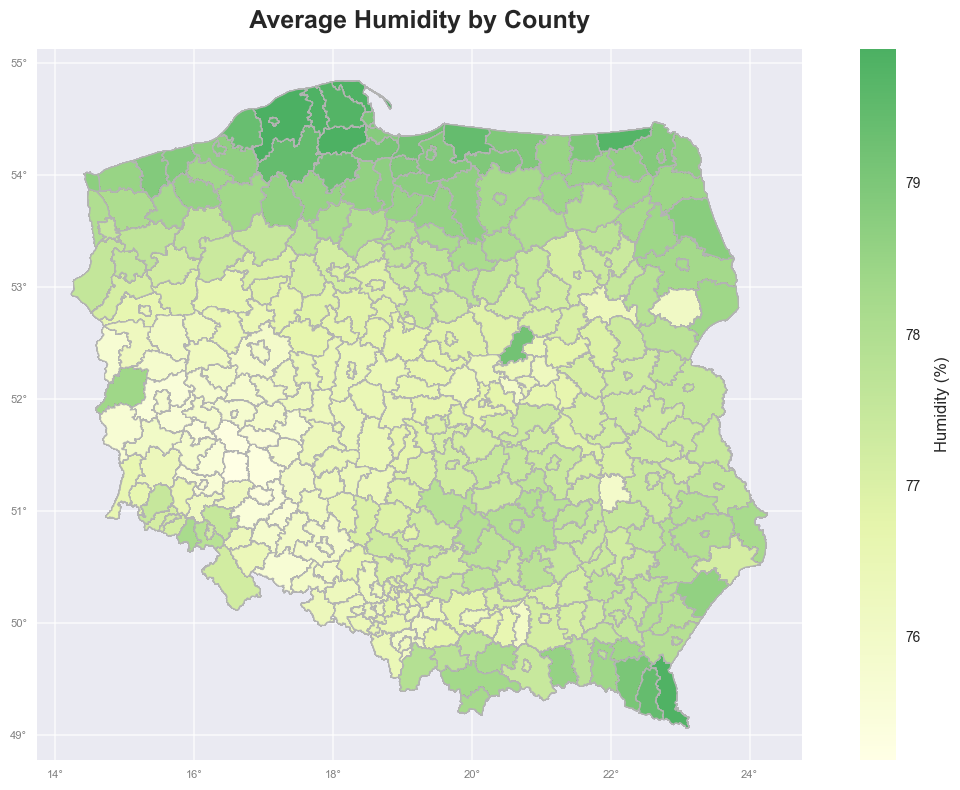

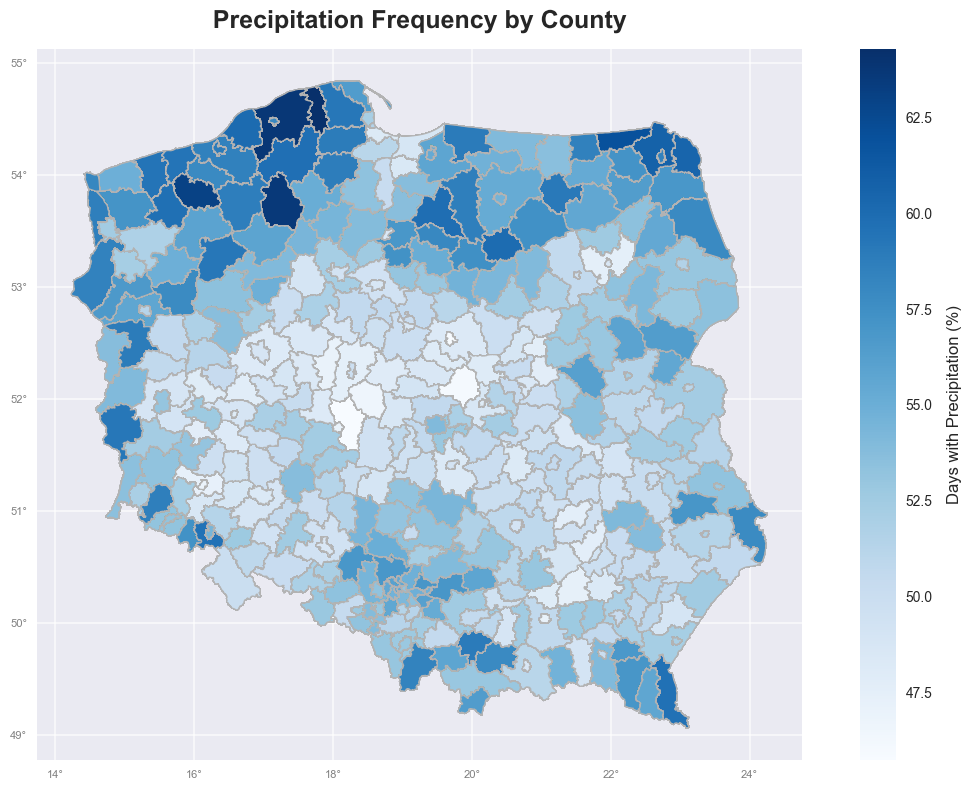

In [ ]:
# 1) First prepare the data (as you already have)
df_county_weather = (
    df_weather
    .groupby(['county', 'voivodeship'], as_index=False)
    .agg(
        avg_temp=('temperature', 'mean'), 
        avg_humidity=('humidity', 'mean'), 
        precip_freq=('precipation', lambda x: (x > 0.1).mean() * 100)
    )
)

# 2) Merge with county geometry 
df_counties_weather = df_counties.merge(
    df_county_weather,
    left_on='name',
    right_on='county',
    how='left'
)

def create_modified_coolwarm():
    # Get the standard coolwarm colormap
    coolwarm = plt.get_cmap('coolwarm')
    
    # Sample points with more detail
    # colors = [
    #     coolwarm(0.0),  # Start with full blue
    #     coolwarm(0.15),
    #     coolwarm(0.3),
    #     coolwarm(0.45),
    #     # coolwarm(0.6),
    #     coolwarm(0.75),
    #     coolwarm(0.85)  # End at 85% red
    # ]
    vals = list(range(0, 81, 10))
    del vals[-2]

    colors = [
        coolwarm(val * 0.01)
        for val in vals
    ]


    
    return mcolors.LinearSegmentedColormap.from_list('coolwarm_modified', colors)


# 3) Plot average temperature using plot_geodataframe
fig, ax = plot_geodataframe(
    df_counties_weather, 
    title='Average Temperature by County',
    colorbar_title='Temperature (°C)',
    column='avg_temp',
    cmap=create_modified_coolwarm(),
    figsize=(12, 8)
)
plt.show()

# 4) Plot average humidity using plot_geodataframe
fig, ax = plot_geodataframe(
    df_counties_weather, 
    title='Average Humidity by County',
    colorbar_title='Humidity (%)',
    column='avg_humidity',
    cmap=create_lighter_ylgn(),
    figsize=(12, 8)
)
plt.show()

# 5) Plot precipitation frequency using plot_geodataframe
fig, ax = plot_geodataframe(
    df_counties_weather, 
    title='Precipitation Frequency by County',
    colorbar_title='Days with Precipitation (%)',
    column='precip_freq',
    cmap='Blues',
    figsize=(12, 8)
)
plt.show()

## Distance to the closest weahter station

/var/folders/yp/gjwvp9611c96kbtrz5ssff_h0000gn/T/ipykernel_29953/2340528916.py:9: DtypeWarning: Columns (9,10,11,13,14,15,16,17,18,19,20) have mixed types. Specify dtype option on import or set low_memory=False.
  df_incidents = pd.read_csv('../data/intermediate/data_all.csv')


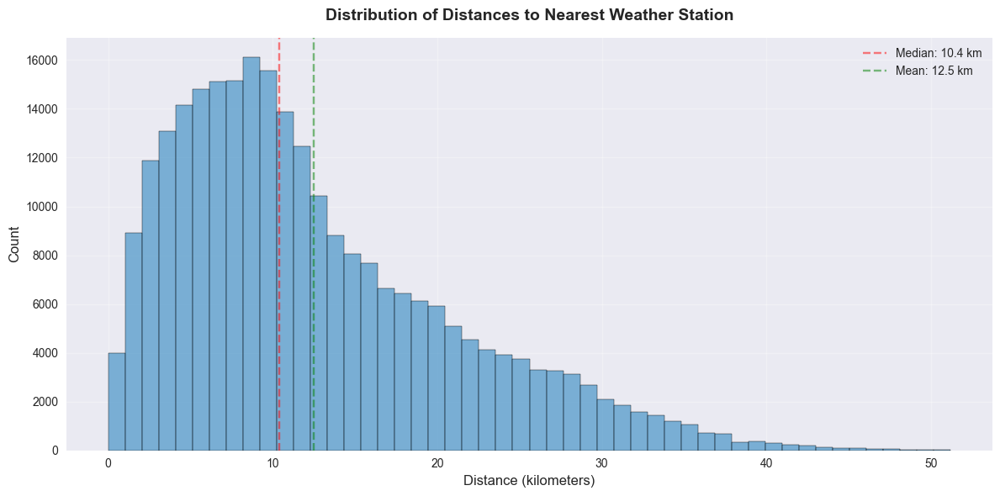


Summary Statistics (in kilometers):
Mean distance: 12.49
Median distance: 10.38
Min distance: 0.02
Max distance: 51.18
Standard deviation: 8.51

Percentage of incidents within certain distances:
Within 10 km: 47.8%
Within 25 km: 89.7%
Within 50 km: 100.0%


In [ ]:
import pandas as pd
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data
df_weather_stations = pd.read_csv('../data/intermediate/weather_stations.csv')
df_incidents = pd.read_csv('../data/intermediate/data_all.csv')

def haversine_distance_vectorized(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    Vectorized version for better performance
    """
    # Convert decimal degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6371 * c  # Earth's radius in kilometers
    return km

# Create KDTree for efficient nearest neighbor search
stations_coords = np.radians(df_weather_stations[['latitude', 'longitude']].values)
tree = cKDTree(stations_coords)

# Convert incident coordinates to radians for consistency
incidents_coords = np.radians(df_incidents[['latitude', 'longitude']].values)

# Find nearest station for each incident
distances, indices = tree.query(incidents_coords, k=1)

# Convert distances from radians to kilometers (Earth radius ≈ 6371 km)
distances_km = distances * 6371

# Create visualization
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8')

# Create histogram with KDE
sns.histplot(
    data=distances_km,
    bins=50,
    kde=False,
    color='#2E86C1',
    alpha=0.6
)

# Customize the plot
plt.title('Distribution of Distances to Nearest Weather Station', 
         pad=15, 
         fontsize=14, 
         fontweight='bold')
plt.xlabel('Distance (kilometers)', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Add grid
plt.grid(True, alpha=0.3)

# Add summary statistics
median_dist = np.median(distances_km)
mean_dist = np.mean(distances_km)
plt.axvline(median_dist, color='red', linestyle='--', alpha=0.5, label=f'Median: {median_dist:.1f} km')
plt.axvline(mean_dist, color='green', linestyle='--', alpha=0.5, label=f'Mean: {mean_dist:.1f} km')

# Add legend
plt.legend(fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Print summary statistics
print("\nSummary Statistics (in kilometers):")
print(f"Mean distance: {mean_dist:.2f}")
print(f"Median distance: {median_dist:.2f}")
print(f"Min distance: {np.min(distances_km):.2f}")
print(f"Max distance: {np.max(distances_km):.2f}")
print(f"Standard deviation: {np.std(distances_km):.2f}")
print(f"\nPercentage of incidents within certain distances:")
print(f"Within 10 km: {(distances_km <= 10).mean()*100:.1f}%")
print(f"Within 25 km: {(distances_km <= 25).mean()*100:.1f}%")
print(f"Within 50 km: {(distances_km <= 50).mean()*100:.1f}%")

/var/folders/yp/gjwvp9611c96kbtrz5ssff_h0000gn/T/ipykernel_98304/3848367728.py:9: DtypeWarning: Columns (9,10,11,13,14,15,16,17,18,19,20) have mixed types. Specify dtype option on import or set low_memory=False.
  df_incidents = pd.read_csv('../data/intermediate/data_all.csv')


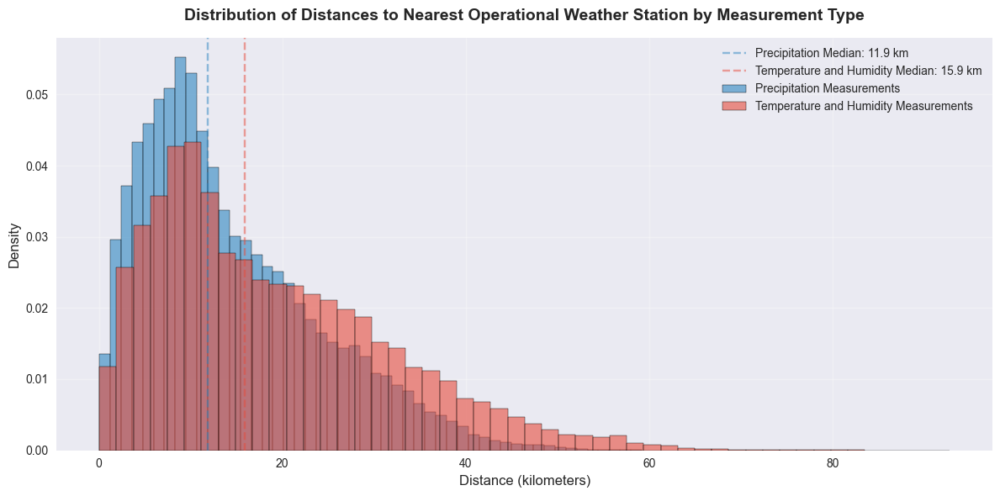


Summary Statistics for Temperature Measurements (in kilometers):
Mean distance: 18.81
Median distance: 15.87
Min distance: 0.04
Max distance: 92.81
Standard deviation: 12.77

Percentage of incidents within certain distances:
Within 10 km: 30.4%
Within 25 km: 71.2%
Within 50 km: 97.8%

Summary Statistics for Precipitation Measurements (in kilometers):
Mean distance: 14.34
Median distance: 11.85
Min distance: 0.03
Max distance: 59.20
Standard deviation: 9.72

Percentage of incidents within certain distances:
Within 10 km: 41.2%
Within 25 km: 84.6%
Within 50 km: 99.8%


In [ ]:
import pandas as pd
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data
df_weather_stations = pd.read_csv('../data/intermediate/weather_stations.csv')
df_incidents = pd.read_csv('../data/intermediate/data_all.csv')

# Separate stations by type
temp_stations = df_weather_stations[df_weather_stations['category'] == 'Precipitation, Temperature, Humidity']
all_stations = df_weather_stations[df_weather_stations['category'].isin(['Precipitation, Temperature, Humidity', 'Precipitation only'])]

def calculate_distances(stations, incidents):
    # Create KDTree for efficient nearest neighbor search
    stations_coords = np.radians(stations[['latitude', 'longitude']].values)
    tree = cKDTree(stations_coords)
    
    # Convert incident coordinates to radians
    incidents_coords = np.radians(incidents[['latitude', 'longitude']].values)
    
    # Find nearest station for each incident
    distances, indices = tree.query(incidents_coords, k=1)
    
    # Convert distances from radians to kilometers
    return distances * 6371  # Earth radius in km

# Calculate distances for temperature and precipitation measurements
distances_temp = calculate_distances(temp_stations, df_incidents)
distances_precip = calculate_distances(all_stations, df_incidents)

# Create visualization
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8')

# Create overlapping histograms
sns.histplot(
    data=distances_precip,
    bins=50,
    kde=False,
    color='#2E86C1',  # Blue for precipitation
    alpha=0.6,
    label='Precipitation Measurements',
    stat='density'
)

sns.histplot(
    data=distances_temp,
    bins=50,
    kde=False,
    color='#E74C3C',  # Red for temperature
    alpha=0.6,
    label='Temperature and Humidity Measurements',
    stat='density'
)


# Customize the plot
plt.title('Distribution of Distances to Nearest Operational Weather Station by Measurement Type', 
         pad=15, 
         fontsize=14, 
         fontweight='bold')
plt.xlabel('Distance (kilometers)', fontsize=12)
plt.ylabel('Density', fontsize=12)

# Add grid
plt.grid(True, alpha=0.3)

# Add summary statistics as vertical lines
for distances, color, name in [
    (distances_precip, '#2E86C1', 'Precipitation'),
    (distances_temp, '#E74C3C', 'Temperature and Humidity'),
]:
    median_dist = np.median(distances)
    plt.axvline(median_dist, color=color, linestyle='--', alpha=0.5,
                label=f'{name} Median: {median_dist:.1f} km')

# Add legend
plt.legend(fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Print summary statistics for both types
for name, distances in [('Temperature Measurements', distances_temp),
                       ('Precipitation Measurements', distances_precip)]:
    print(f"\nSummary Statistics for {name} (in kilometers):")
    print(f"Mean distance: {np.mean(distances):.2f}")
    print(f"Median distance: {np.median(distances):.2f}")
    print(f"Min distance: {np.min(distances):.2f}")
    print(f"Max distance: {np.max(distances):.2f}")
    print(f"Standard deviation: {np.std(distances):.2f}")
    print(f"\nPercentage of incidents within certain distances:")
    print(f"Within 10 km: {(distances <= 10).mean()*100:.1f}%")
    print(f"Within 25 km: {(distances <= 25).mean()*100:.1f}%")
    print(f"Within 50 km: {(distances <= 50).mean()*100:.1f}%")

/var/folders/yp/gjwvp9611c96kbtrz5ssff_h0000gn/T/ipykernel_29953/916992114.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geodata_counties['centroid'] = geodata_counties.geometry.centroid


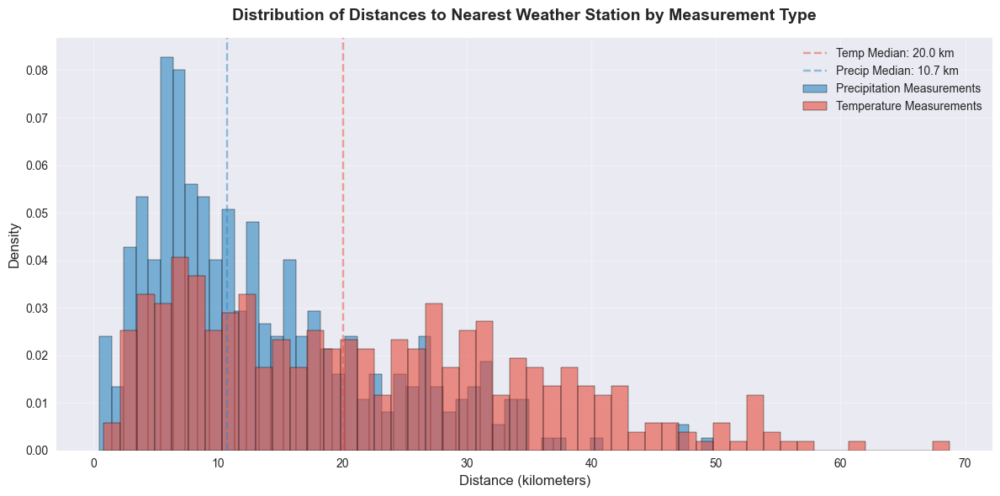


Summary Statistics for Temperature Measurements (in kilometers):
Mean distance: 21.82
Median distance: 20.01
Min distance: 0.80
Max distance: 68.78
Standard deviation: 13.88

Percentage of incidents within certain distances:
Within 10 km: 26.1%
Within 25 km: 59.2%
Within 50 km: 96.1%

Summary Statistics for Precipitation Measurements (in kilometers):
Mean distance: 13.37
Median distance: 10.72
Min distance: 0.46
Max distance: 49.78
Standard deviation: 9.27

Percentage of incidents within certain distances:
Within 10 km: 46.6%
Within 25 km: 85.5%
Within 50 km: 100.0%


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import cKDTree
from shapely.geometry import Point
import geopandas as gpd

geodata_counties = geodata_counties.to_crs(epsg=4326)

# Convert county geometry to centroid lat-lon before distance calculation
geodata_counties['centroid'] = geodata_counties.geometry.centroid
geodata_counties['latitude'] = geodata_counties['centroid'].y
geodata_counties['longitude'] = geodata_counties['centroid'].x
geodata_counties.drop(columns=['centroid'], inplace=True)

def calculate_distances(stations, counties):
    stations_coords = np.radians(stations[['latitude', 'longitude']].values)
    tree = cKDTree(stations_coords)
    counties_coords = np.radians(counties[['latitude', 'longitude']].values)
    distances, indices = tree.query(counties_coords, k=1)
    return distances * 6371  # Earth radius in km

# Calculate distances from stations to counties
distances_temp = calculate_distances(temp_stations, geodata_counties)
distances_precip = calculate_distances(all_stations, geodata_counties)

# Create visualization (unchanged style)
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8')


# Create overlapping histograms
sns.histplot(
    data=distances_precip,
    bins=50,
    kde=False,
    color='#2E86C1',  # Blue for precipitation
    alpha=0.6,
    label='Precipitation Measurements',
    stat='density'
)

sns.histplot(
    data=distances_temp,
    bins=50,
    kde=False,
    color='#E74C3C',  # Red for temperature
    alpha=0.6,
    label='Temperature Measurements',
    stat='density'
)

# Customize the plot
plt.title('Distribution of Distances to Nearest Weather Station by Measurement Type', 
         pad=15, 
         fontsize=14, 
         fontweight='bold')
plt.xlabel('Distance (kilometers)', fontsize=12)
plt.ylabel('Density', fontsize=12)

# Add grid
plt.grid(True, alpha=0.3)

# Add summary statistics as vertical lines
for distances, color, name in [
    (distances_temp, '#E74C3C', 'Temp'),
    (distances_precip, '#2E86C1', 'Precip')
]:
    median_dist = np.median(distances)
    plt.axvline(median_dist, color=color, linestyle='--', alpha=0.5,
                label=f'{name} Median: {median_dist:.1f} km')

# Add legend
plt.legend(fontsize=10)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

# Print summary statistics for both types
for name, distances in [('Temperature Measurements', distances_temp),
                       ('Precipitation Measurements', distances_precip)]:
    print(f"\nSummary Statistics for {name} (in kilometers):")
    print(f"Mean distance: {np.mean(distances):.2f}")
    print(f"Median distance: {np.median(distances):.2f}")
    print(f"Min distance: {np.min(distances):.2f}")
    print(f"Max distance: {np.max(distances):.2f}")
    print(f"Standard deviation: {np.std(distances):.2f}")
    print(f"\nPercentage of incidents within certain distances:")
    print(f"Within 10 km: {(distances <= 10).mean()*100:.1f}%")
    print(f"Within 25 km: {(distances <= 25).mean()*100:.1f}%")
    print(f"Within 50 km: {(distances <= 50).mean()*100:.1f}%")

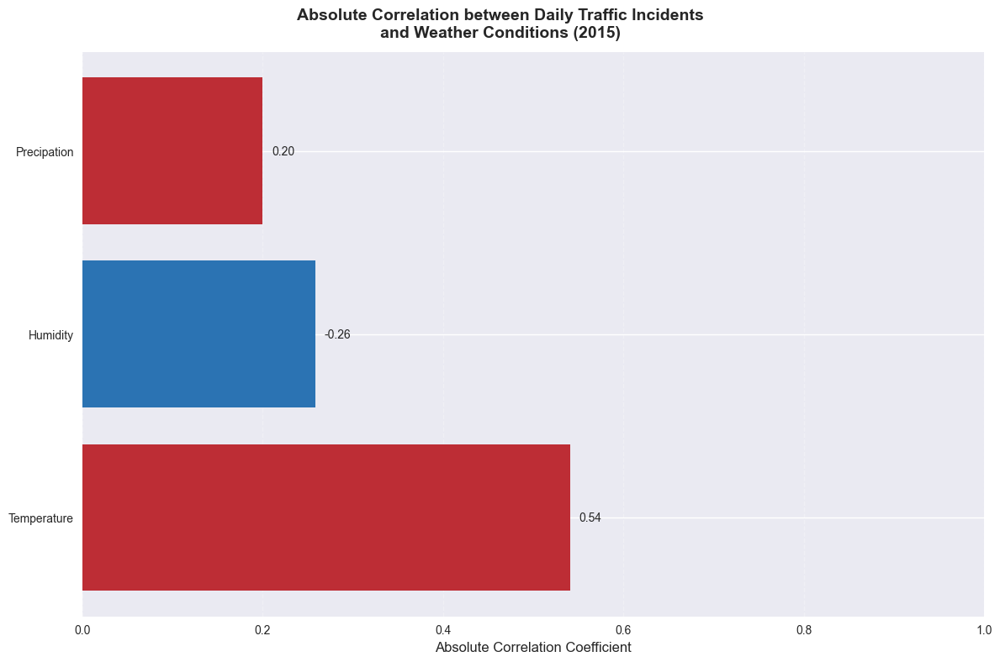

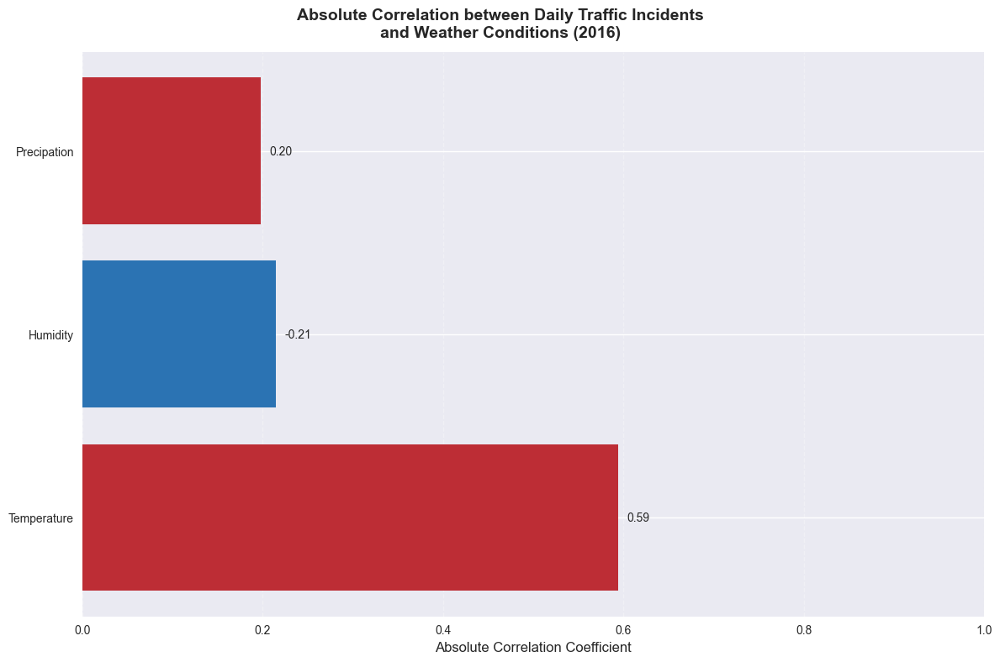

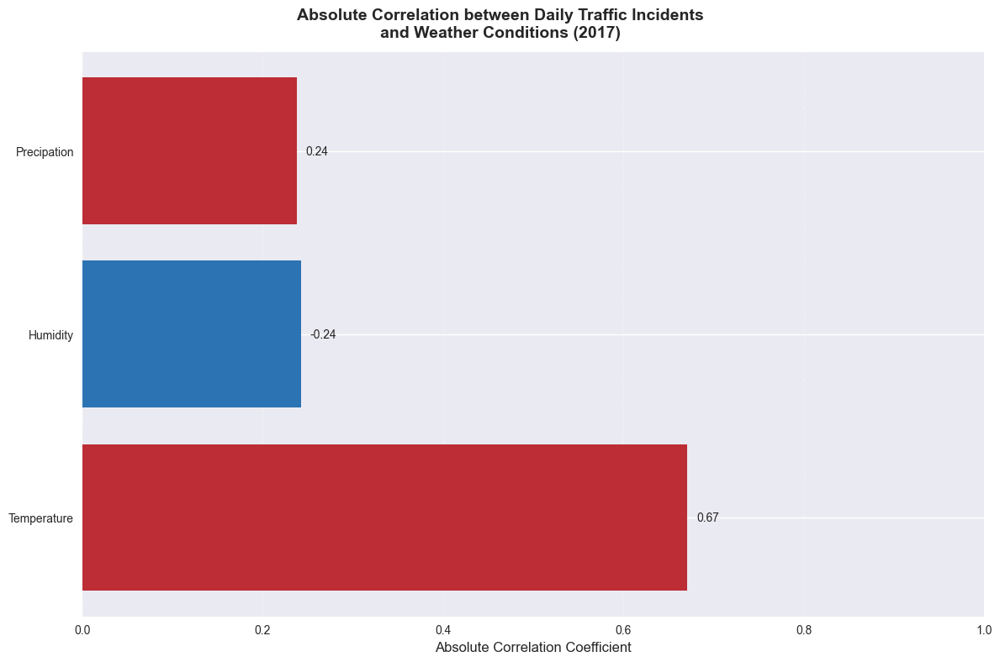

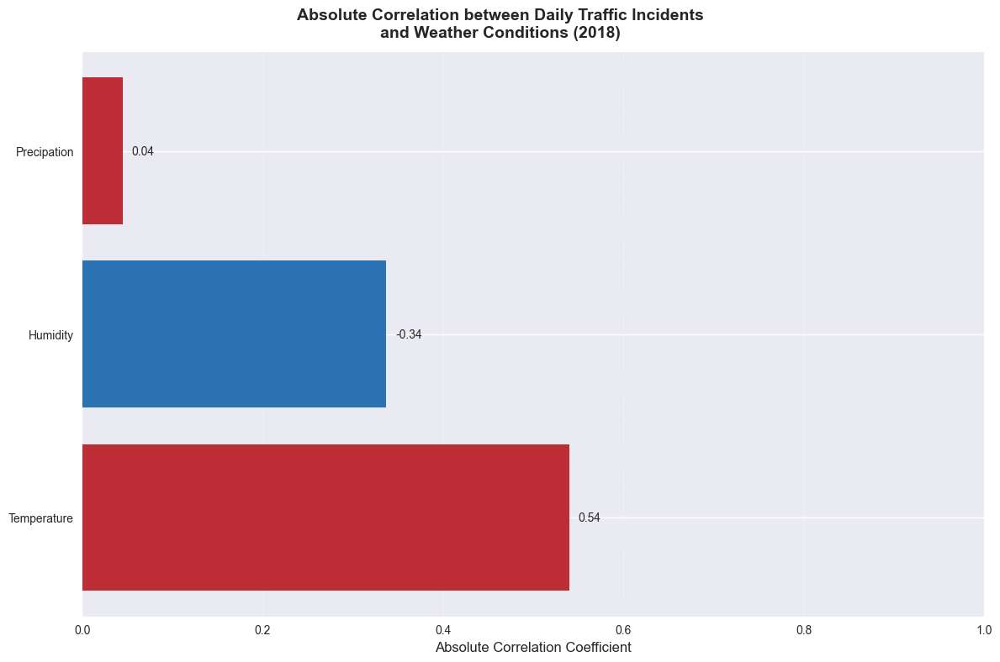

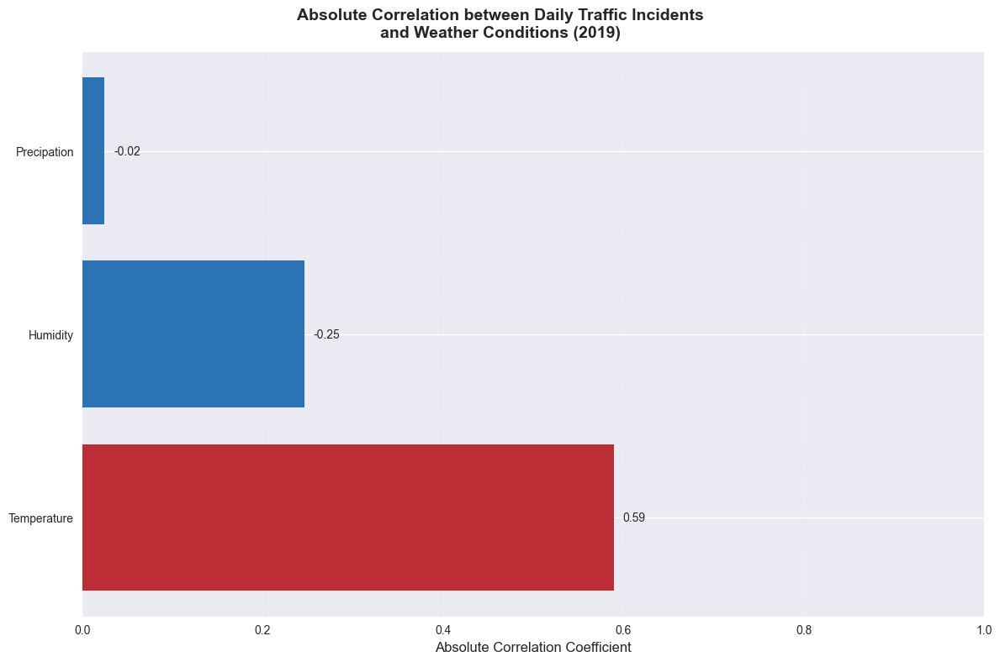

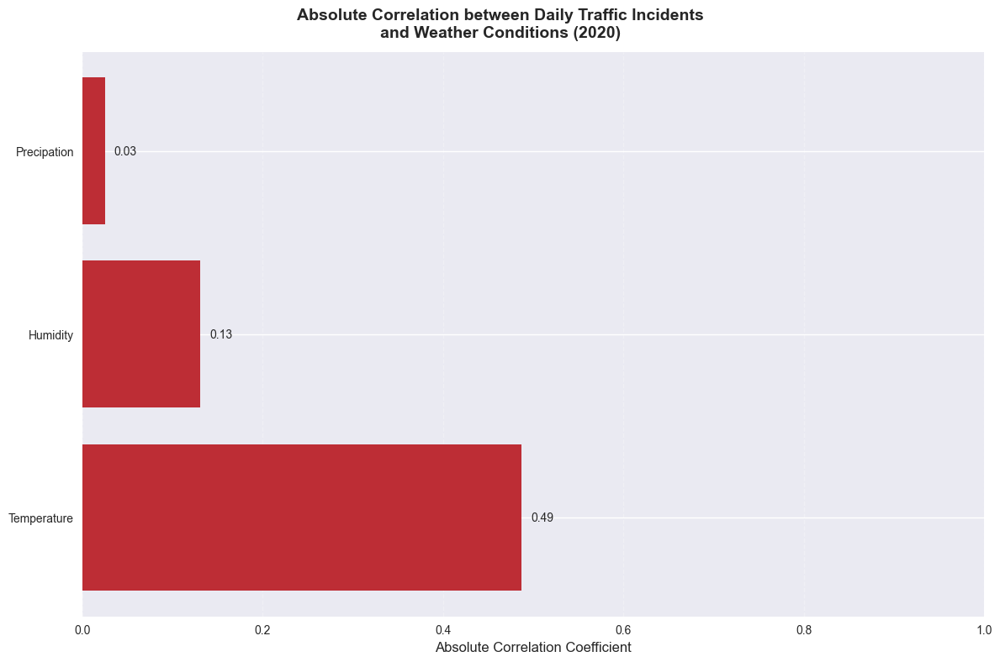

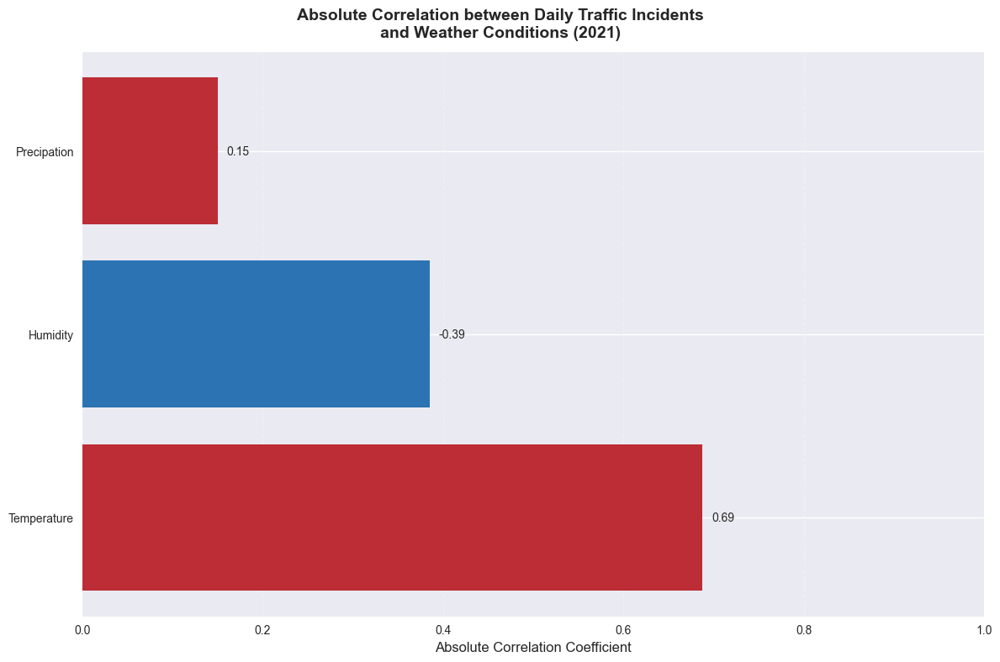

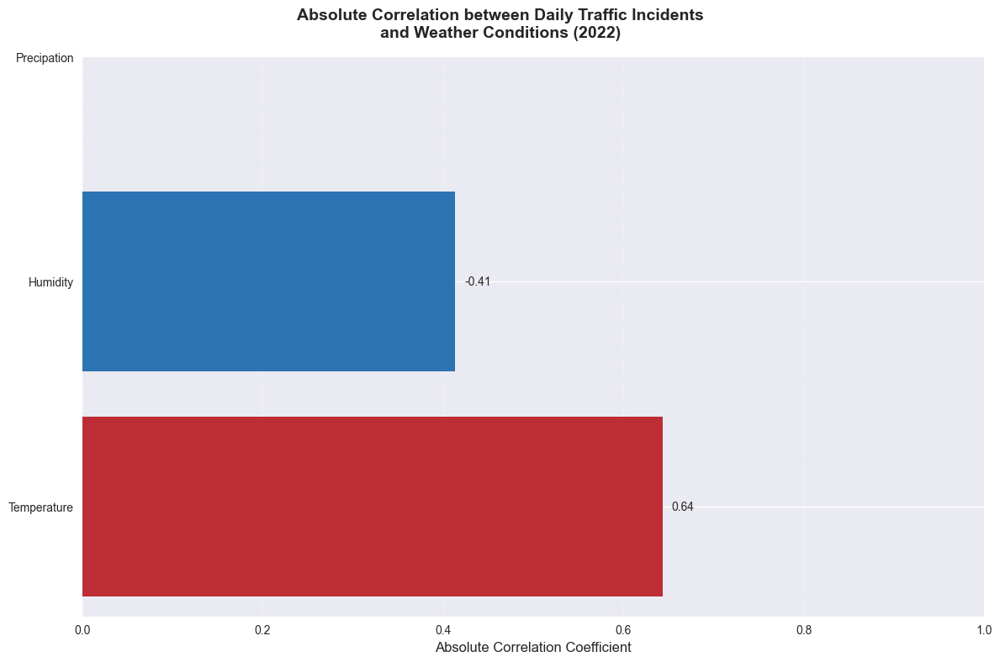

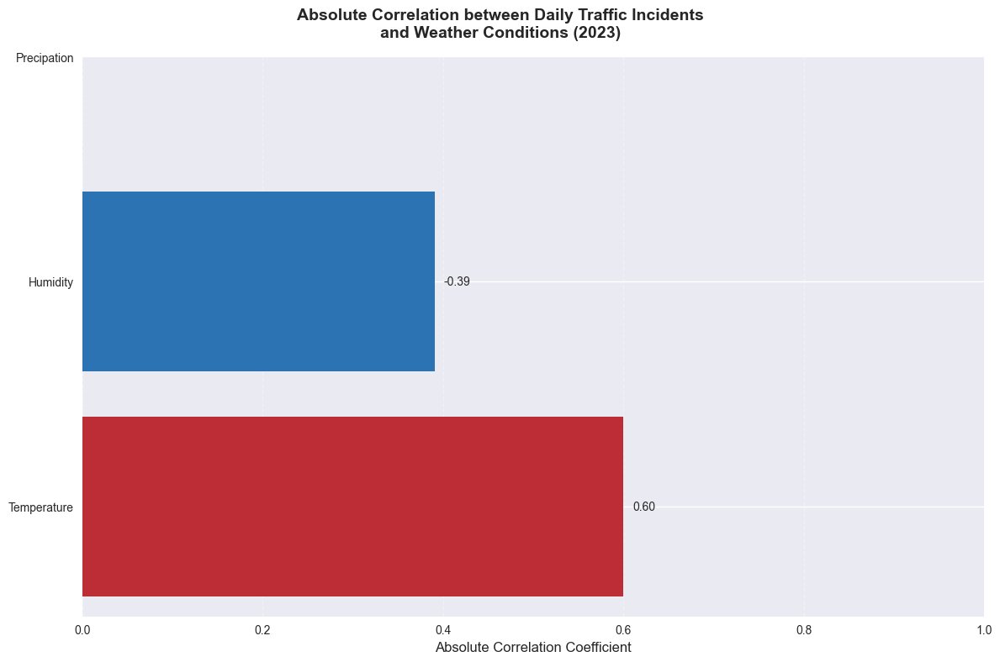

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set style consistent with other charts
plt.style.use('seaborn-v0_8')

# Fix precipitation column name if inconsistent
if 'precipation' in df_incidents.columns and 'precipitation' not in df_incidents.columns:
    df_incidents['precipitation'] = df_incidents['precipation']

# Define weather metrics to analyze
weather_metrics = ['temperature', 'humidity', 'precipation']
weather_metrics = [col for col in weather_metrics if col in df_incidents.columns]

# Extract date components
df_incidents['date'] = df_incidents['datetime'].dt.date
df_incidents['year'] = df_incidents['datetime'].dt.year

# Calculate correlations by year
years = sorted(df_incidents['year'].unique())

for year in years:
    # Filter data for the current year
    year_data = df_incidents[df_incidents['year'] == year].copy()
    
    # Calculate correlations between daily incident count and each weather metric
    correlations = []
    
    # Group by date to get daily counts
    daily_counts = year_data.groupby('date').size().reset_index(name='incident_count')
    
    for metric in weather_metrics:
        # Calculate daily average for each weather metric
        daily_weather = year_data.groupby('date')[metric].mean().reset_index()
        
        # Merge with daily counts
        merged = daily_counts.merge(daily_weather, on='date', how='left')
        
        # Drop rows with missing values
        merged = merged.dropna(subset=[metric])
        
        # Calculate correlation
        corr = merged['incident_count'].corr(merged[metric])
        correlations.append({
            'factor': metric,
            'correlation': corr,
            'abs_correlation': abs(corr)
        })
    
    # Convert to DataFrame and sort by absolute correlation
    corr_df = pd.DataFrame(correlations)
    corr_df = corr_df.sort_values(by='abs_correlation', ascending=False)
    
    # Create figure
    plt.figure(figsize=(12, 8))

    # Add title before creating the plot
    plt.suptitle(f'Absolute Correlation between Daily Traffic Incidents\nand Weather Conditions ({year})',
                fontsize=14, fontweight='bold', y=0.98)

    # Create horizontal bar plot using absolute values but keep original correlation colors
    bars = plt.barh(
        range(len(corr_df)),
        corr_df['abs_correlation'],
        color=[plt.cm.RdBu_r(0.13) if x < 0 else plt.cm.RdBu_r(0.87) for x in corr_df['correlation']]
    )

    # Customize the plot
    plt.yticks(
        range(len(corr_df)),
        [factor.replace('_', ' ').title() for factor in corr_df['factor']],
        fontsize=10
    )
    plt.xlabel('Absolute Correlation Coefficient', fontsize=12)

    # Add value labels with signs
    for i, bar in enumerate(bars):
        original_value = corr_df['correlation'].iloc[i]
        abs_value = corr_df['abs_correlation'].iloc[i]
        sign = ' ' if original_value >= 0 else '-'
        plt.text(abs_value + 0.01,
                i,
                f'{sign}{abs_value:.2f}'.lstrip(),
                va='center',
                ha='left')

    # Set x-axis limits with some padding
    plt.xlim(0, 1)

    # Add grid
    plt.grid(axis='x', linestyle='--', alpha=0.3)

    # Adjust margins to accommodate the title
    plt.subplots_adjust(top=0.85)

    # Adjust layout
    plt.tight_layout()
    plt.show()

In [41]:
df_incidents.describe()

,id,longitude,latitude,speed_limit,elevation,temperature,humidity,precipation,precipation_24h,indicators_population_per_1_km2,...,vehicle_types_passenger_cars,vehicle_types_total_buses,vehicle_types_trucks,vehicle_types_semi-trailer_tractors,road_accidents_total_accidents,road_accidents_total_casualties,road_accidents_fatalities,road_accidents_injured,road_types_municipal_and_county_paved_roads_per_100km2,road_types_municipal_and_county_paved_roads_per_10.000_inhabitants
count,2.499570e+05,249957.000000,249957.000000,229024.000000,249957.000000,158867.000000,158547.000000,1.928700e+05,1.925000e+05,161996.000000,...,161996.000000,161996.000000,161996.000000,161996.000000,161996.000000,13517.000000,161996.000000,161996.000000,161996.000000,161996.000000
mean,1.090566e+08,19.258609,51.721692,59.808688,176.012293,13.182628,69.948103,7.439412e+08,2.705546e+12,118.925475,...,66971.785612,340.448344,9966.612608,1440.301612,98.131275,94.981209,9.680313,121.509550,94.590597,93.757385
std,7.304061e+06,2.016512,1.372468,21.252570,108.189367,8.753681,19.134901,1.252411e+11,3.906359e+14,83.488838,...,39423.439300,254.002564,6847.751420,2318.286914,79.804587,82.701073,6.362564,105.107308,42.419260,37.095676
min,9.870590e+07,14.127694,49.005555,0.000000,-1.687070,-417.098050,9.639741,0.000000e+00,0.000000e+00,18.100000,...,11741.000000,26.000000,1213.000000,39.000000,3.000000,3.000000,0.000000,3.000000,19.900000,33.200000
25%,1.051170e+08,17.946556,50.539916,50.000000,104.286700,6.393689,54.748112,0.000000e+00,1.324714e-02,65.400000,...,41165.000000,174.000000,5668.000000,556.000000,43.000000,42.000000,5.000000,49.000000,66.600000,67.100000
50%,1.073951e+08,19.409694,51.707861,50.000000,162.985840,13.916765,72.999445,2.388290e-04,1.260467e+00,95.000000,...,58881.000000,273.000000,8212.000000,896.000000,71.000000,68.000000,8.000000,85.000000,89.400000,86.900000
75%,1.099758e+08,20.745472,52.555806,70.000000,227.393650,19.765452,86.818331,2.643946e-02,9.725172e+00,144.500000,...,83030.000000,427.000000,12462.000000,1413.000000,129.000000,111.000000,13.000000,162.000000,111.100000,112.600000
max,1.259238e+08,24.129694,54.833583,920.000000,1622.104900,242.791547,100.000000,3.460203e+13,1.170431e+17,729.300000,...,303614.000000,3176.000000,47387.000000,43857.000000,535.000000,421.000000,39.000000,684.000000,293.000000,352.200000


# Part 2

## Dataset after normalization

In [2]:
import pandas as pd

In [3]:
df_normalized_weekly = pd.read_csv('../../data/analysis/normalized_weekly_data.csv')
df_normalized_yearly = pd.read_csv('../../data/analysis/normalized_yearly_data.csv')
params_weather = ['mean_temperature', 'mean_humidity', 'total_precipitation']
params_socioeconomic = ['population_density', 'paved_roads', 'passenger_cars']
df_normalized = pd.concat([df_normalized_weekly[params_weather], df_normalized_yearly[params_socioeconomic]])
df_normalized

,mean_temperature,mean_humidity,total_precipitation,population_density,paved_roads,passenger_cars
0,-1.130634,0.422159,7.430216,NaN,NaN,NaN
1,-0.877091,1.098838,7.504505,NaN,NaN,NaN
2,-0.939740,0.840184,5.853118,NaN,NaN,NaN
3,-1.188621,0.990244,5.927360,NaN,NaN,NaN
4,-0.677239,0.792343,8.824292,NaN,NaN,NaN
...,...,...,...,...,...,...
1515,NaN,NaN,NaN,4.956531,6.070738,11.105889
1516,NaN,NaN,NaN,4.982236,6.691711,11.387419
1517,NaN,NaN,NaN,4.976734,6.520327,11.419483
1518,NaN,NaN,NaN,4.974663,6.531606,11.435742


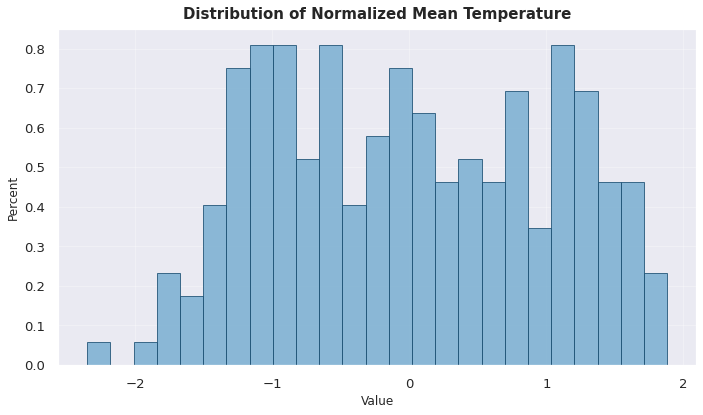

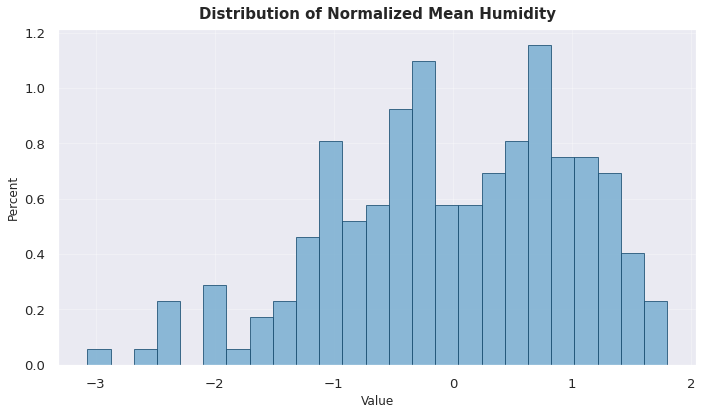

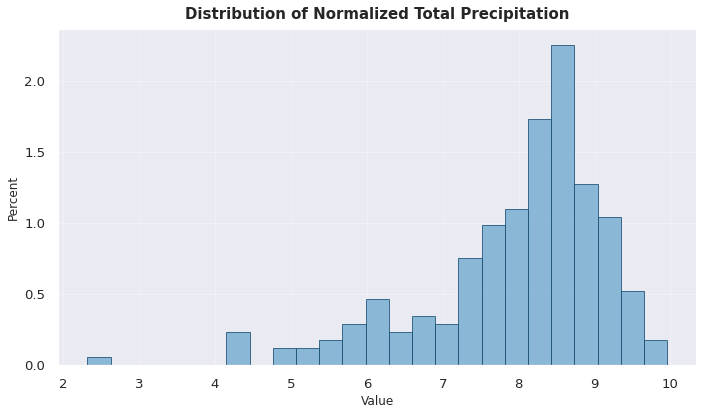

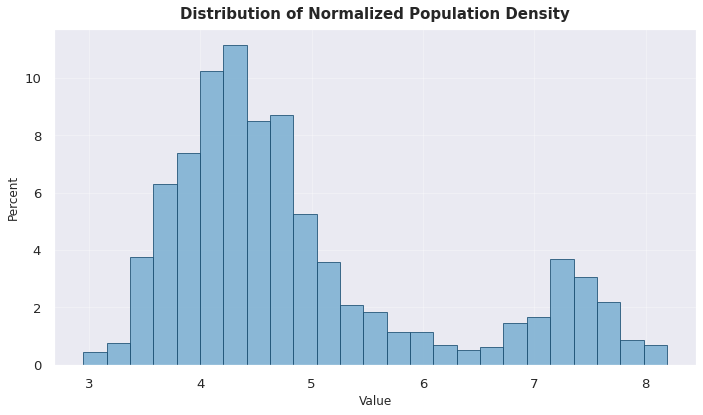

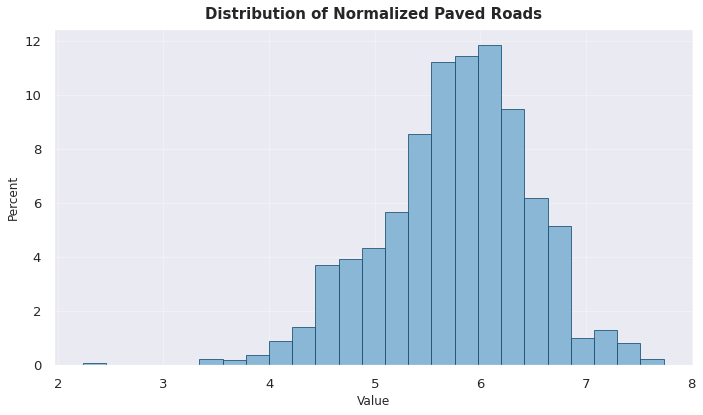

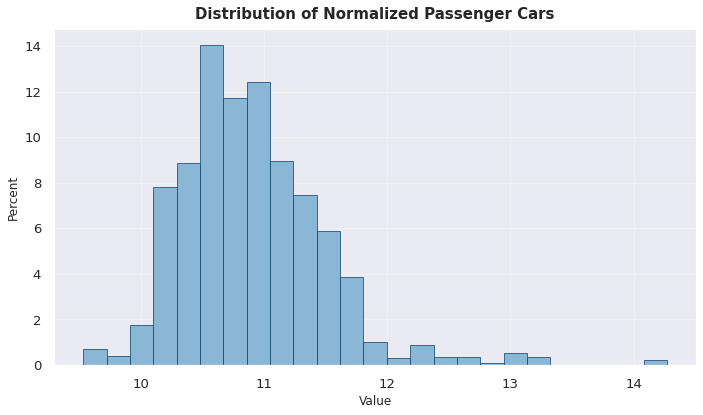

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set style consistent with other visualizations
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_theme(font_scale=1.2)

# Define colors consistent with other plots
bar_color = '#72abcf'
edge_color = '#1B4F72'

# Units dictionary for each variable
units = {
    'mean_temperature': '°C',
    'mean_humidity': '%',
    'total_precipitation': 'mm',
    'population_density': 'people/km²',
    'paved_roads': 'km',
    'passenger_cars': 'vehicles'
}

# Create histograms for each column
for column in df_normalized.columns:
    plt.figure(figsize=(10, 6))
    
    # Create histogram using plt.hist instead of sns.histplot
    plt.hist(
        df_normalized[column], 
        bins=25, 
        color=bar_color,
        edgecolor=edge_color,
        alpha=0.8,
        weights=np.ones_like(df_normalized[column]) * 100 / len(df_normalized)  # For percentage
    )
    
    # Add title and labels with units
    plt.title(f'Distribution of Normalized {column.replace("_", " ").title()}', 
              fontsize=15, fontweight='bold', pad=10)
    plt.xlabel('Value', fontsize=12)
    plt.ylabel('Percent', fontsize=12)
    
    # Add grid with consistent styling
    plt.grid(True, alpha=0.3)
    
    # Adjust layout
    plt.tight_layout()
    
    # Show plot
    plt.show()
